In [ ]:
#comparison of small (POC) and large (GOC) particulate organic carbon from UVP5 measurements and PlankTOM12

In [1]:
import pandas as pd
import numpy as np
from datetime import date
import matplotlib.pyplot as plt
import random
import scipy.io
from scipy import stats
from scipy.signal import *
from mpl_toolkits.basemap import Basemap
import dataframe_image as dfi

In [3]:
#rescale variable
def convert(x,names):
    for col_name in names:
        x[col_name] = x[col_name] * 1000000.
    return x

In [4]:
#convert biovolume to biomass
def biovol_to_biomass(x):
    for i in np.arange(0,x.columns.size,1):
        name_biovol = x.columns[i]  
        if name_biovol[:6] == 'biovol' and len(name_biovol) == 8:
            x[name_biovol+'_wvL'] = 0.99 * (x[name_biovol]*x['watervolume'])**0.52
        
    return x

In [5]:
#summ columns of dataframe
def sum_columns(x):
    name = ['POC_wvL','GOC_wvL','POC_wvL_low','GOC_wvL_low','POC_wvL_high','GOC_wvL_high','POC_wvL_all','GOC_wvL_all',\
           'POC_wvL_low2','GOC_wvL_low2','POC_wvL_high2','GOC_wvL_high2','POC_wvL_low2_all','GOC_wvL_low2_all',\
           'POC_wvL_high2_all','GOC_wvL_high2_all']
    column_left = ["biovol21_wvL","biovol25_wvL","biovol21_wvL","biovol24_wvL","biovol21_wvL","biovol26_wvL",\
                  "biovol21_wvL","biovol25_wvL","biovol21_wvL","biovol21_wvL","biovol21_wvL","biovol27_wvL",\
                  "biovol21_wvL","biovol21_wvL","biovol21_wvL","biovol27_wvL"]
    column_right = ["biovol24_wvL","biovol37_wvL","biovol23_wvL","biovol37_wvL","biovol25_wvL","biovol37_wvL",\
                   "biovol24_wvL","biovol45_wvL","biovol20_wvL","biovol37_wvL","biovol26_wvL","biovol37_wvL",\
                   "biovol20_wvL","biovol45_wvL","biovol26_wvL","biovol45_wvL"]
    for i in np.arange(0,len(name),1):
        x[name[i]] = x.loc[: , column_left[i]:column_right[i]].sum(axis=1)

    return x

In [6]:
#conbirt biomass to umol/L
def biomass_umolL(x):
    name = ['POC_wvL','GOC_wvL','POC_wvL_low','GOC_wvL_low','POC_wvL_high','GOC_wvL_high','POC_wvL_all','GOC_wvL_all',\
           'POC_wvL_low2','GOC_wvL_low2','POC_wvL_high2','GOC_wvL_high2','POC_wvL_low2_all','GOC_wvL_low2_all',\
           'POC_wvL_high2_all','GOC_wvL_high2_all']
    name_biomass = ['POC_Mmol_wvL','GOC_Mmol_wvL','POC_Mmol_wvL_low','GOC_Mmol_wvL_low','POC_Mmol_wvL_high',\
                    'GOC_Mmol_wvL_high','POC_Mmol_wvL_all','GOC_Mmol_wvL_all','POC_Mmol_wvL_low2',\
                    'GOC_Mmol_wvL_low2','POC_Mmol_wvL_high2','GOC_Mmol_wvL_high2','POC_Mmol_wvL_low2_all',\
                    'GOC_Mmol_wvL_low2_all','POC_Mmol_wvL_high2_all','GOC_Mmol_wvL_high2_all']
    for i in np.arange(0,len(name),1):
        x[name_biomass[i]] = (x[name[i]] / x['watervolume']) / 12.0107

    return x

In [7]:
#plot a scatter plot of two dataframes
def plot_fun(df,var_name1,var_name2,y_ax_name,xlim_l,xlim_r,filenamesave):
    plt.figure(figsize=[20. , 15.],facecolor='w') 
    plt.scatter(df[var_name1].values,-df.depth.values,label = 'Obs, UVP5G')
    plt.scatter(df[var_name2].values,-df.depth.values,label = 'PlankTOM')
    plt.plot(df.groupby('depth').mean().reset_index()[var_name1],-df.groupby('depth').mean().reset_index()['depth'].values,'y', linewidth = 4,label = 'Obs mean, UVP5G') 
    plt.plot(df.groupby('depth').mean().reset_index()[var_name2],-df.groupby('depth').mean().reset_index()['depth'].values,'k', linewidth = 4,label = 'PlankTOM mean')
    locsX,labelsx = plt.xticks(size=30)
    plt.xlabel(y_ax_name+', \u03BCmol/L',fontsize=30)
    plt.ylabel('depth,m',fontsize=30)
    locsY,labelsy = plt.yticks(size=30)   
    plt.legend(fontsize = 'x-large')
    plt.xlim([xlim_l,xlim_r])
    plt.savefig(filenamesave)


In [8]:
#estimation of root-mean-square error
def RMSE(x,y):
    rmse = np.sqrt(np.mean((x - y)**2))
    
    return rmse

In [9]:
#plot global distribution of available data
def plot_glob_distr(x,lat_name,lon_name,file_name):
    plt.figure(figsize=[20. , 15.],facecolor='w')
    m = Basemap(projection='cyl',llcrnrlat=-90,urcrnrlat=90,\
                llcrnrlon=-180,urcrnrlon=180)
    m.fillcontinents(color='grey',lake_color='white',zorder = 0)
    parallels = np.arange(-80.,81,20.)
    m.drawparallels(parallels,dashes=[1,10],labels=[1,0,0,0],fontsize=15) #[False,True,True,False])
    meridians = np.arange(10.,351.,20.)
    m.drawmeridians(meridians,dashes=[1,10],labels=[True,False,False,True],fontsize=15)
    m.scatter(x[lon_name].values,x[lat_name].values, latlon = True, \
              c=np.ones(len(x[lon_name].values)),s=70,\
              cmap='jet',alpha = None, edgecolors = 'k')
    cbar = plt.colorbar(orientation='horizontal')
    cbar.set_label(label=r'Data',size=20, weight='bold')
    cbar.ax.tick_params(labelsize=20)
    plt.savefig(file_name)

In [10]:
#plot of data distribution from two dataframes
def plot_scatter_two_df(x,y,var_name,var_name1_plot,var_name2_plot,legend_name1,legend_name2,xlim_l,xlim_r,file_name,\
                        legend_sw,ylim_sw):
    plt.figure(figsize=[20. , 15.],facecolor='w')
    plt.scatter(x[var_name1_plot].values,-x.depth.values,label = legend_name1)
    plt.scatter(y[var_name2_plot].values,-y.depth.values,label = legend_name2)
    plt.plot(x.groupby('depth').mean().reset_index()[var_name1_plot],-x.groupby('depth').mean().reset_index()['depth'].values,'y', linewidth = 4,label = legend_name1+', mean')
    plt.plot(y.groupby('depth').mean().reset_index()[var_name2_plot],-y.groupby('depth').mean().reset_index()['depth'].values,'k', linewidth = 4,label = legend_name2+', mean')
    locsX,labelsx = plt.xticks(size=30)
    plt.xlabel(var_name+',\u03BCmol/L',fontsize=30)
    plt.ylabel('depth,m',fontsize=30)
    locsY,labelsy = plt.yticks(size=30)
    if legend_sw == 'on':
        plt.legend(fontsize = 30)
    plt.xlim([xlim_l,xlim_r])
    if ylim_sw == 'on':
        plt.ylim([-1685,85])
    plt.savefig(file_name)


In [11]:
#plot several profiles
def plot_mean_profiles(x1,x2,x3,x4,var_name,var_name1_plot,var_name2_plot,var_name3_plot,var_name4_plot,\
                      legend_name1,legend_name2,legend_name3,legend_name4,file_name):
    plt.figure(figsize=[20. , 15.],facecolor='w')
    plt.plot(x1[var_name1_plot].values,-x1.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name1)
    plt.plot(x2[var_name2_plot].values,-x2.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name2)
    plt.plot(x3[var_name3_plot].values,-x3.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name3)
    plt.plot(x4[var_name4_plot].values,-x4.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name4) 
    locsX,labelsx = plt.xticks(size=30)
    plt.xlabel(var_name+',\u03BCmol/L',fontsize=30)
    plt.ylabel('depth,m',fontsize=30)
    locsY,labelsy = plt.yticks(size=30)   
    plt.legend(fontsize = 30)
    plt.savefig(file_name)

In [2]:
#read data
r_filenameTSV0 = 'Target_Only_Biovol.csv'
All_Data_tot_OBS = pd.read_csv(r_filenameTSV0)

r_filenameTSV = 'Ecopart_data_2008_to_2010_subm_20201113.tsv'
data_20082010 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV = 'Ecopart_data_2011_to_2013 _subm_20210120.tsv'
data_20112013 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV2 = 'Data_Tara_Back_PlankTOMDaily_bottom_21102021.csv'
Data_Tara_Pl_All = pd.read_csv(r_filenameTSV2)

r_filenameTSV3 = 'Data_RKiko_Back_PlankTOMDaily_bottom_21102021.csv'
Data_RKiko_Pl_All = pd.read_csv(r_filenameTSV3)

r_filenameTSV1 = 'Data_ML_PlankTOM_All_PFTCHL_bottom_13122021.csv'
Data_Tara_Pl_All_month = pd.read_csv(r_filenameTSV1)

r_filenameTSV1 = 'Data_ML_PlankTOM_RKiko_PFT_CHLback_bottom_13122021.csv'
Data_RKiko_Pl_All_month = pd.read_csv(r_filenameTSV1)


In [3]:
All_Data_tot_OBS[['date','time']] = All_Data_tot_OBS.date_time_utc.str.split(" ",expand=True,)

All_Data_tot_OBS[['year','month','day']] = All_Data_tot_OBS.date.str.split("/",expand=True,)

All_Data_tot_OBS['year'] = All_Data_tot_OBS['year'].astype(int)
All_Data_tot_OBS['month'] = All_Data_tot_OBS['month'].astype(int)
All_Data_tot_OBS['day'] = All_Data_tot_OBS['day'].astype(int)

In [4]:
All_Data_concat = pd.concat([data_20082010, data_20112013],ignore_index=True, sort=False).sort_values(['Date_Time', 'Latitude','Longitude','Pressure [dbar]']).reset_index()


In [5]:
All_Data_concat[['date','time']] = All_Data_concat.Date_Time.str.split("T",expand=True,)

All_Data_concat[['year','month','day']] = All_Data_concat.date.str.split("-",expand=True,)

All_Data_concat['year'] = All_Data_concat['year'].astype(int)
All_Data_concat['month'] = All_Data_concat['month'].astype(int)
All_Data_concat['day'] = All_Data_concat['day'].astype(int)

In [6]:
Data_RKiko_Pl_All

,Unnamed: 0,year,month,day,lat,lon,lat_Pl,lon_Pl,depth,Temp,...,DIA_back,COC_back,PIC_back,PHA_back,GEL_back,PRO_back,MAC_back,MIX_back,FIX_back,bottom
0,0,2009,1,16,-48.664830,-16.446330,-48.757957,-15.999863,4.999938,7.038075,...,3.982157e-07,6.013584e-09,6.151971e-06,3.271027e-09,2.898955e-06,7.414583e-10,9.421789e-11,8.993894e-07,1.190631e-09,3257.478760
1,1,2009,1,16,-48.664830,-16.446330,-48.757957,-15.999863,15.000288,7.038076,...,3.982146e-07,6.013575e-09,6.151959e-06,3.271020e-09,2.898955e-06,7.414576e-10,9.421789e-11,8.993869e-07,1.190631e-09,3257.478760
2,2,2009,1,16,-48.664830,-16.446330,-48.757957,-15.999863,25.001759,6.971361,...,3.815950e-07,5.863587e-09,5.980711e-06,3.154479e-09,2.898420e-06,7.301419e-10,9.423193e-11,8.636229e-07,1.185432e-09,3257.478760
3,3,2009,1,16,-48.664830,-16.446330,-48.757957,-15.999863,35.005413,6.928207,...,3.594577e-07,5.656006e-09,5.752522e-06,3.002230e-09,2.898245e-06,7.131153e-10,9.424366e-11,8.191901e-07,1.176137e-09,3257.478760
4,4,2009,1,16,-48.664830,-16.446330,-48.757957,-15.999863,45.013317,6.874273,...,3.238424e-07,5.308615e-09,5.373240e-06,2.757408e-09,2.899390e-06,6.784412e-10,9.424759e-11,7.499104e-07,1.156265e-09,3257.478760
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72504,72504,2013,10,300,61.575333,-55.984667,61.338394,-55.486191,3257.478760,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2289.767822
72505,72505,2013,10,300,61.575333,-55.984667,61.338394,-55.486191,3752.442139,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2289.767822
72506,72506,2013,10,300,61.575333,-55.984667,61.338394,-55.486191,4250.401367,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2289.767822
72507,72507,2013,10,300,61.575333,-55.984667,61.338394,-55.486191,4749.913086,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2289.767822


In [10]:
Data_RKiko_Pl_All.groupby(['lat_Pl','lon_Pl']).mean().reset_index()

,lat_Pl,lon_Pl,Unnamed: 0,year,month,day,lat,lon,depth,Temp,...,DIA_back,COC_back,PIC_back,PHA_back,GEL_back,PRO_back,MAC_back,MIX_back,FIX_back,bottom
0,-64.004227,-54.000256,14631.5,2011.0,1.0,9.0,-64.354415,-53.054170,1097.454844,-0.209143,...,4.552913e-09,5.054186e-10,1.310800e-07,1.006082e-09,8.244014e-11,4.778556e-09,2.913625e-08,6.414507e-10,4.344212e-10,511.534760
1,-60.270821,-60.000267,14569.5,2011.0,1.0,3.0,-60.320915,-60.547000,1097.454844,1.732141,...,8.167252e-10,2.281076e-10,4.289269e-07,4.751094e-09,1.502250e-08,1.492414e-10,1.148063e-07,3.463777e-10,4.957101e-10,3257.478760
2,-56.056770,-66.000259,14523.0,2010.0,12.0,351.0,-55.103170,-65.905330,1097.454844,4.531884,...,2.501234e-07,7.773691e-10,2.124938e-07,8.864620e-09,4.536712e-07,8.918472e-11,5.506475e-11,3.900696e-07,6.168522e-10,1830.885010
3,-53.757950,-66.000259,14492.0,2010.0,12.0,350.0,-54.376830,-65.153000,1097.454844,2.037913,...,1.558335e-07,1.512913e-07,4.077765e-08,1.613785e-08,9.670467e-07,3.220428e-08,2.683240e-11,2.603712e-06,6.094812e-10,75.125511
4,-50.059177,-26.000006,92.5,2009.0,1.0,18.5,-49.962670,-25.576665,1097.454844,3.738232,...,7.277436e-09,3.361887e-10,1.293981e-06,1.184482e-09,7.612647e-07,3.451514e-09,7.697827e-11,1.013136e-08,6.344617e-10,3752.442139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,79.327400,71.186829,65146.0,2013.0,7.0,190.0,79.017333,71.637333,1097.454844,1.109512,...,3.944984e-07,1.491697e-08,1.117031e-08,2.174045e-08,5.315703e-11,2.028251e-06,2.989680e-07,4.272781e-07,5.168708e-10,364.303040
396,79.422272,75.638657,67626.0,2013.0,8.0,224.0,79.046667,74.138833,1097.454844,0.660680,...,3.198242e-07,1.028549e-09,8.998361e-10,7.230630e-10,4.685853e-11,1.166214e-06,5.370284e-07,7.077579e-09,4.333276e-10,158.960617
397,79.752090,60.795490,67595.0,2013.0,8.0,223.0,79.673167,60.879500,1097.454844,0.767519,...,2.151321e-07,2.766615e-10,4.989928e-10,4.486181e-10,4.572450e-11,1.138676e-06,3.364483e-07,4.983923e-10,4.105066e-10,158.960617
398,80.180450,70.412842,67254.0,2013.0,8.0,218.0,79.041667,69.653000,1097.454844,1.306939,...,4.133705e-07,1.219254e-09,1.006510e-09,8.579028e-10,5.254567e-11,1.402651e-06,3.648397e-07,1.046001e-08,4.538451e-10,364.303040


In [7]:
Data_RKiko_Pl_All_month

,Unnamed: 0,year,month,lat_Pl,lon_Pl,depth,Temp,Temp_back,MLD,POC,...,GEL_back,PRO,PRO_back,MAC,MAC_back,MIX,MIX_back,FIX,FIX_back,bottom
0,0,2009,1,-50.059177,-26.000006,4.999938,6.696263,5.270082,51.425594,1.399323e-08,...,2.427618e-11,1.121586e-10,1.151048e-10,0.000005,0.000004,6.788503e-10,6.845104e-10,6.685107e-08,6.440593e-08,3752.442139
1,1,2009,1,-50.059177,-26.000006,15.000288,6.695637,5.269668,51.425594,1.407813e-08,...,2.427545e-11,1.121457e-10,1.151064e-10,0.000005,0.000004,6.770143e-10,6.835441e-10,6.677346e-08,6.436614e-08,3752.442139
2,2,2009,1,-50.059177,-26.000006,25.001759,6.649694,5.243597,51.425594,1.387588e-08,...,2.426249e-11,1.118586e-10,1.151010e-10,0.000005,0.000004,6.426517e-10,6.665815e-10,6.520690e-08,6.364397e-08,3752.442139
3,3,2009,1,-50.059177,-26.000006,35.005413,6.602064,5.220045,51.425594,1.321920e-08,...,2.424775e-11,1.114086e-10,1.151632e-10,0.000005,0.000004,5.970085e-10,6.418436e-10,6.310957e-08,6.274703e-08,3752.442139
4,4,2009,1,-50.059177,-26.000006,45.013317,6.540305,5.197886,51.425594,1.256501e-08,...,2.423053e-11,1.107377e-10,1.154097e-10,0.000005,0.000004,5.415537e-10,6.140276e-10,5.985015e-08,6.168214e-08,3752.442139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72163,72163,2013,10,77.635132,-85.588829,3257.478760,0.000000,0.000000,22.497229,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,142.195251
72164,72164,2013,10,77.635132,-85.588829,3752.442139,0.000000,0.000000,22.497229,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,142.195251
72165,72165,2013,10,77.635132,-85.588829,4250.401367,0.000000,0.000000,22.497229,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,142.195251
72166,72166,2013,10,77.635132,-85.588829,4749.913086,0.000000,0.000000,22.497229,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,142.195251


In [9]:
Data_RKiko_Pl_All_month.groupby(['lat_Pl','lon_Pl']).mean().reset_index()

,lat_Pl,lon_Pl,Unnamed: 0,year,month,depth,Temp,Temp_back,MLD,POC,...,GEL_back,PRO,PRO_back,MAC,MAC_back,MIX,MIX_back,FIX,FIX_back,bottom
0,-64.004227,-54.000256,14569.5,2011.0,1.0,1097.454844,-0.174475,-0.451449,34.199497,1.866440e-08,...,9.161207e-12,4.783539e-10,3.177431e-09,4.905350e-08,3.933306e-08,6.157545e-10,3.092541e-09,4.338457e-10,4.482611e-10,511.534760
1,-60.270821,-60.000267,14631.5,2011.0,1.0,1097.454844,1.858930,1.553927,41.817951,9.826857e-09,...,1.526400e-11,2.655696e-10,1.034764e-09,5.424805e-07,4.907036e-07,3.090999e-10,4.304983e-10,4.915299e-10,4.943045e-10,3257.478760
2,-56.056770,-66.000259,14337.0,2010.0,12.0,1097.454844,4.531303,4.483961,276.304230,1.540390e-08,...,2.822777e-11,4.600879e-10,3.559364e-09,4.934510e-07,4.498759e-07,1.016241e-08,4.137533e-10,4.311217e-09,3.985338e-09,1830.885010
3,-53.757950,-66.000259,14368.0,2010.0,12.0,1097.454844,2.054176,1.868116,73.821091,5.078980e-09,...,1.343381e-11,2.986863e-11,3.076778e-11,3.280996e-07,3.095550e-07,5.720952e-10,4.026560e-10,1.311570e-06,1.192359e-06,75.125511
4,-50.059177,-26.000006,30.5,2009.0,1.0,1097.454844,3.739105,3.422915,51.425594,9.469394e-09,...,2.106351e-11,5.474200e-10,1.288754e-09,1.609134e-06,1.541357e-06,2.250083e-10,2.628094e-10,1.785117e-08,2.090024e-08,3752.442139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,79.327400,71.186829,66107.0,2013.0,7.0,1097.454844,1.124057,0.841448,11.333458,2.118846e-07,...,5.918531e-11,1.882750e-06,1.056710e-06,2.870964e-07,2.010631e-07,1.919186e-07,1.519299e-06,4.862244e-10,5.935864e-10,364.303040
396,79.422272,75.638657,69331.0,2013.0,8.0,1097.454844,0.677401,0.493945,17.226414,1.758816e-07,...,5.199203e-11,1.107006e-06,1.934322e-06,4.701011e-07,3.796020e-07,1.420479e-08,2.083494e-07,4.189277e-10,4.836431e-10,158.960617
397,79.752090,60.795490,69517.0,2013.0,8.0,1097.454844,0.787964,0.636719,20.000834,1.771151e-07,...,5.288798e-11,9.474739e-07,1.637261e-06,3.257752e-07,2.414950e-07,3.771027e-09,1.017270e-07,4.046077e-10,4.490982e-10,158.960617
398,80.180450,70.412842,69300.0,2013.0,8.0,1097.454844,1.273067,1.069221,15.204742,1.780761e-07,...,5.921330e-11,1.214180e-06,2.077917e-06,3.544294e-07,2.691177e-07,2.072289e-09,1.712384e-07,4.253536e-10,4.811656e-10,364.303040


In [16]:
#rename columns
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.032-0.0403 mm)": "biovol16"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0403-0.0508 mm)": "biovol17"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0508-0.064 mm)": "biovol18"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.064-0.0806 mm)": "biovol19"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0806-0.102 mm)": "biovol20"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.102-0.128 mm)": "biovol21"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.128-0.161 mm)": "biovol22"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.161-0.203 mm)": "biovol23"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.203-0.256 mm)": "biovol24"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.256-0.323 mm)": "biovol25"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.323-0.406 mm)": "biovol26"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.406-0.512 mm)": "biovol27"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.512-0.645 mm)": "biovol28"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.645-0.813 mm)": "biovol29"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.813-1.02 mm)": "biovol30"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.02-1.29 mm)": "biovol31"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.29-1.63 mm)": "biovol32"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.63-2.05 mm)": "biovol33"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 2.05-2.58 mm)": "biovol34"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 2.58-3.25 mm)": "biovol35"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 3.25-4.1 mm)": "biovol36"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 4.1-5.16 mm)": "biovol37"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 5.16-6.5 mm)": "biovol38"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 6.5-8.19 mm)": "biovol39"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 8.19-10.3 mm)": "biovol40"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 10.3-13 mm)": "biovol41"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 13-16.4 mm)": "biovol42"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 16.4-20.6 mm)": "biovol43"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 20.6-26 mm)": "biovol44"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: >26 mm)": "biovol45"}, inplace=True)
All_Data_concat.rename(columns={"Latitude": "lat"}, inplace=True)
All_Data_concat.rename(columns={"Longitude": "lon"}, inplace=True)
All_Data_concat.rename(columns={"Vol [L] (sampled for this depth bin)": "watervolume"}, inplace=True)
All_Data_concat.rename(columns={"Pressure [dbar]": "depth"}, inplace=True)


In [18]:
All_Data_concat['year'].min()

2008

In [16]:
#remove values under 1600m of depth
All_Data_Obs = All_Data_tot_OBS.loc[All_Data_tot_OBS['depth'] < 1600.]
All_Data_Obs_RK = All_Data_concat.loc[All_Data_concat['depth'] < 1600.]
All_Data_Pl_All = Data_Tara_Pl_All.loc[Data_Tara_Pl_All['depth'] < 1600.]
All_Data_Pl_All_RK = Data_RKiko_Pl_All.loc[Data_RKiko_Pl_All['depth'] < 1600.]
All_Data_Pl_All_month = Data_Tara_Pl_All_month.loc[Data_Tara_Pl_All_month['depth'] < 1600.]
All_Data_Pl_All_RK_month = Data_RKiko_Pl_All_month.loc[Data_RKiko_Pl_All_month['depth'] < 1600.]

In [17]:
names = ['POC','GOC','CHL','BAC','MES','PTE','DIA','COC','PIC','PHA','GEL','PRO','MAC','MIX','FIX']

In [18]:
#rescales varibales mentioned in array 'names'
convert(All_Data_Pl_All,names)
convert(All_Data_Pl_All_RK,names)
convert(All_Data_Pl_All_month,names)
convert(All_Data_Pl_All_RK_month,names)

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Unnamed: 0,year,month,lat_Pl,lon_Pl,depth,Temp,Temp_back,MLD,POC,...,GEL_back,PRO,PRO_back,MAC,MAC_back,MIX,MIX_back,FIX,FIX_back,bottom
0,0,2009,1,-50.059177,-26.000006,4.999938,6.696263,5.270082,51.425594,0.013993,...,2.427618e-11,0.000112,1.151048e-10,5.188479,0.000004,0.000679,6.845104e-10,0.066851,6.440593e-08,3752.442139
1,1,2009,1,-50.059177,-26.000006,15.000288,6.695637,5.269668,51.425594,0.014078,...,2.427545e-11,0.000112,1.151064e-10,5.188198,0.000004,0.000677,6.835441e-10,0.066773,6.436614e-08,3752.442139
2,2,2009,1,-50.059177,-26.000006,25.001759,6.649694,5.243597,51.425594,0.013876,...,2.426249e-11,0.000112,1.151010e-10,5.183476,0.000004,0.000643,6.665815e-10,0.065207,6.364397e-08,3752.442139
3,3,2009,1,-50.059177,-26.000006,35.005413,6.602064,5.220045,51.425594,0.013219,...,2.424775e-11,0.000111,1.151632e-10,5.176399,0.000004,0.000597,6.418436e-10,0.063110,6.274703e-08,3752.442139
4,4,2009,1,-50.059177,-26.000006,45.013317,6.540305,5.197886,51.425594,0.012565,...,2.423053e-11,0.000111,1.154097e-10,5.163389,0.000004,0.000542,6.140276e-10,0.059850,6.168214e-08,3752.442139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72155,72155,2013,10,77.635132,-85.588829,364.303040,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251
72156,72156,2013,10,77.635132,-85.588829,511.534760,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251
72157,72157,2013,10,77.635132,-85.588829,732.200867,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251
72158,72158,2013,10,77.635132,-85.588829,1033.217285,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251


In [19]:
#remove large values of GOC
Large_Data_All = All_Data_Pl_All.loc[All_Data_Pl_All['GOC'] > 2.]
All_Data_Pl_All = All_Data_Pl_All.drop(Large_Data_All.index.to_numpy()).reset_index()
Large_Data_All_RK = All_Data_Pl_All_RK.loc[All_Data_Pl_All_RK['GOC'] > 2.]
All_Data_Pl_All_RK = All_Data_Pl_All_RK.drop(Large_Data_All_RK.index.to_numpy()).reset_index()

Large_Data_All_month = All_Data_Pl_All_month.loc[All_Data_Pl_All_month['GOC'] > 2.]
All_Data_Pl_All_month = All_Data_Pl_All_month.drop(Large_Data_All_month.index.to_numpy()).reset_index()
Large_Data_All_RK_month = All_Data_Pl_All_RK_month.loc[All_Data_Pl_All_RK_month['GOC'] > 2.]
All_Data_Pl_All_RK_month = All_Data_Pl_All_RK_month.drop(Large_Data_All_RK_month.index.to_numpy()).reset_index()

In [20]:
#remove the data under the PlankTOM12 bathymetry
All_Data_Pl_All_new = All_Data_Pl_All.loc[All_Data_Pl_All['depth'] < All_Data_Pl_All['bottom']]

All_Data_Pl_All_RK_new = All_Data_Pl_All_RK.loc[All_Data_Pl_All_RK['depth'] < All_Data_Pl_All_RK['bottom']]

All_Data_Pl_All_new_month = All_Data_Pl_All_month.loc[All_Data_Pl_All_month['depth'] < All_Data_Pl_All_month['bottom']]

All_Data_Pl_All_RK_new_month = All_Data_Pl_All_RK_month.loc[All_Data_Pl_All_RK_month['depth'] < All_Data_Pl_All_RK_month['bottom']]

In [21]:
#remove dublicates
All_Data_Pl_All_new_month = All_Data_Pl_All_new_month.drop(columns=['index','Unnamed: 0']).drop_duplicates()
All_Data_Pl_All_RK_new_month = All_Data_Pl_All_RK_new_month.drop(columns=['index','Unnamed: 0']).drop_duplicates()

In [22]:
#remove dublicates
All_Data_Pl_All_new = All_Data_Pl_All_new.drop(columns=['index','Unnamed: 0']).drop_duplicates()
All_Data_Pl_All_RK_new = All_Data_Pl_All_RK_new.drop(columns=['index','Unnamed: 0']).drop_duplicates()

In [23]:
All_Data_Obs_RK['lon'] = All_Data_Obs_RK['lon'].apply(lambda x: round(x, 3))
All_Data_Obs_RK['lat'] = All_Data_Obs_RK['lat'].apply(lambda x: round(x, 3))
All_Data_Obs_RK['depth'] = All_Data_Obs_RK['depth'].apply(lambda x: round(x, 1))
All_Data_Obs_RK['coordinates'] = list(zip(All_Data_Obs_RK.lat, All_Data_Obs_RK.lon))

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

In [24]:
All_Data_Pl_All_RK_new['lon'] = All_Data_Pl_All_RK_new['lon'].apply(lambda x: round(x, 3))
All_Data_Pl_All_RK_new['lat'] = All_Data_Pl_All_RK_new['lat'].apply(lambda x: round(x, 3))
All_Data_Pl_All_RK_new['depth'] = All_Data_Pl_All_RK_new['depth'].apply(lambda x: round(x, 1))
All_Data_Pl_All_RK_new['coordinates'] = list(zip(All_Data_Pl_All_RK_new.lat, All_Data_Pl_All_RK_new.lon))

In [25]:
#concatenate observations with PlankTOM12 data colocated at the same positions as observations
All_Data_RK_concat = pd.concat([All_Data_Obs_RK,All_Data_Pl_All_RK_new], ignore_index=True, sort=False).sort_values(['coordinates', 'depth']).reset_index()

In [26]:
All_Data_RK_concat = All_Data_RK_concat.drop(columns=['level_0'])

In [27]:
#interpolate PlankTOM12 values grouped by coordinates to observation's depth
Interp_Pl_RK = All_Data_RK_concat.groupby(['coordinates']).apply(lambda x: x.interpolate(method='linear')).reset_index()


In [28]:
Interp_Pl_RK_new = Interp_Pl_RK.loc[Interp_Pl_RK['Cruise'].isnull() == False]
Interp_Pl_RK_final = Interp_Pl_RK_new.loc[Interp_Pl_RK['POC'].isnull() == False]

In [29]:
#estimation of correlation between variables in dataframe
All_Data_Pl_All_new_corr = All_Data_Pl_All_new[['POC','GOC','Temp', 'MLD','O2', 'NO3', 'PO4', 'Si', 'CHL','BAC',\
                                                'MES', 'PTE', 'DIA', 'COC', 'PIC', 'PHA', 'GEL', 'PRO', 'MAC',\
                                                'MIX', 'FIX']]

In [30]:
corr = All_Data_Pl_All_new_corr.corr(method='pearson')
corr.style.background_gradient(cmap='seismic')

,POC,GOC,Temp,MLD,O2,NO3,PO4,Si,CHL,BAC,MES,PTE,DIA,COC,PIC,PHA,GEL,PRO,MAC,MIX,FIX
POC,1,0.370907,0.369804,-0.0401766,0.128666,-0.317827,-0.241258,-0.238453,0.00371955,-0.237158,-0.142683,-0.0797256,-0.0725057,0.242123,-0.0877013,0.0744696,0.703718,0.390775,0.018036,0.0543029,-0.0452433
GOC,0.370907,1,0.227874,-0.153856,-0.260517,0.0445189,0.23962,-0.142269,0.163016,0.0700836,0.0334036,0.0534294,-0.027738,0.164052,0.0409273,0.062593,0.479757,0.0429325,-0.0418554,0.0990551,0.0594564
Temp,0.369804,0.227874,1,0.16772,-0.438799,-0.314202,-0.342703,-0.341113,0.00752549,-0.0868969,-0.133817,-0.0665214,-0.195239,0.342286,0.0349973,-0.113796,0.271449,-0.115875,-0.300074,-0.157369,0.116671
MLD,-0.0401766,-0.153856,0.16772,1,0.0672978,-0.158158,-0.304798,-0.0707611,-0.0956426,-0.0407208,-0.0904577,0.0187449,-0.0810422,-0.0063562,-0.0652349,-0.080046,-0.130376,-0.141672,-0.0294851,-0.038049,0.00566825
O2,0.128666,-0.260517,-0.438799,0.0672978,1,-0.302994,-0.58593,-0.146337,0.0226187,0.060072,0.135396,0.127036,0.0640067,-0.0368855,0.104894,0.0771943,-0.0326692,0.333669,0.488708,0.200997,-0.0968673
NO3,-0.317827,0.0445189,-0.314202,-0.158158,-0.302994,1,0.662443,0.383205,0.0906484,0.172673,0.225969,0.000429578,0.0752145,-0.212832,-0.0879021,0.0488491,-0.103381,-0.14228,-0.148984,-0.0154928,0.385855
PO4,-0.241258,0.23962,-0.342703,-0.304798,-0.58593,0.662443,1,0.475672,0.0414472,0.0588787,0.045698,-0.00864963,0.0887399,-0.170504,-0.117755,0.0716327,-0.00739698,-0.119584,-0.225619,-0.0205963,0.0855185
Si,-0.238453,-0.142269,-0.341113,-0.0707611,-0.146337,0.383205,0.475672,1,-0.130635,-0.0589774,0.0505649,0.0399245,-0.0296678,-0.165247,0.013011,-0.0270572,-0.120083,-0.182156,-0.152616,-0.0524046,-0.0401958
CHL,0.00371955,0.163016,0.00752549,-0.0956426,0.0226187,0.0906484,0.0414472,-0.130635,1,0.454959,0.237088,0.232017,0.728735,0.383892,0.286861,0.35748,0.20683,0.0273025,-0.0207537,0.460184,0.302194
BAC,-0.237158,0.0700836,-0.0868969,-0.0407208,0.060072,0.172673,0.0588787,-0.0589774,0.454959,1,0.513211,0.454615,0.153118,0.1304,0.543304,0.0822891,0.0761535,-0.168643,0.152224,0.321126,0.328131


In [278]:
corr_img1 = corr.style.background_gradient(cmap='seismic')
dfi.export(corr_img1,'/Figures_Article/Correlation_Tara_PlankTOMDaily.png')

In [30]:
#estimation of correlation between variables in dataframe
All_Data_tot_Pl_All_RK_corr = All_Data_Pl_All_RK_new[['POC','GOC','Temp', 'MLD','O2', 'NO3', 'PO4', 'Si', 'CHL','BAC',\
                                                    'MES', 'PTE', 'DIA', 'COC', 'PIC', 'PHA', 'GEL', 'PRO', 'MAC',\
                                                    'MIX', 'FIX']]

In [280]:
corrRK = All_Data_tot_Pl_All_RK_corr.corr(method='pearson')
corrRK.style.background_gradient(cmap='seismic')

,POC,GOC,Temp,MLD,O2,NO3,PO4,Si,CHL,BAC,MES,PTE,DIA,COC,PIC,PHA,GEL,PRO,MAC,MIX,FIX
POC,1,0.295557,0.401598,-0.0576393,0.0908079,-0.401614,-0.28174,-0.283563,0.00798513,-0.207745,-0.0931862,-0.106789,-0.0895783,0.339615,-0.0510432,0.163786,0.617695,0.565088,0.097295,0.00782608,-0.017657
GOC,0.295557,1,0.1287,-0.16216,-0.128621,-0.0321461,0.0967494,-0.308361,0.267883,0.0810357,0.0323312,0.0594297,0.0890105,0.165887,-0.0247457,0.0712216,0.288901,0.198053,0.0896619,0.190252,0.179277
Temp,0.401598,0.1287,1,-0.0829416,-0.347575,-0.460445,-0.391728,-0.443099,-0.0932302,-0.274285,-0.283193,-0.182957,-0.181278,0.241884,-0.0335488,0.0201382,0.113406,0.153483,-0.0576196,-0.112739,0.140323
MLD,-0.0576393,-0.16216,-0.0829416,1,0.212633,-0.0427741,-0.096125,-0.00604569,0.0136597,0.260513,-0.117443,0.448944,0.0963773,-0.0542968,0.0830897,-0.0347018,0.10703,-0.0809908,-0.0939959,-0.00122002,-0.0518906
O2,0.0908079,-0.128621,-0.347575,0.212633,1,-0.432325,-0.596219,-0.131197,0.16793,0.273533,0.260524,0.250876,0.135839,0.015778,0.162228,0.00576762,0.0924146,0.172867,0.500005,0.192438,-0.187729
NO3,-0.401614,-0.0321461,-0.460445,-0.0427741,-0.432325,1,0.810602,0.541343,-0.044942,0.092114,-0.017445,0.0674526,0.0274573,-0.227494,-0.0133966,-0.0057275,-0.0606287,-0.273208,-0.415633,-0.0640476,0.18611
PO4,-0.28174,0.0967494,-0.391728,-0.096125,-0.596219,0.810602,1,0.523092,-0.00989245,0.111351,-0.0264899,0.0713906,0.0300778,-0.173098,-0.00640353,0.0445301,0.0458347,-0.220233,-0.478862,-0.0538727,0.143451
Si,-0.283563,-0.308361,-0.443099,-0.00604569,-0.131197,0.541343,0.523092,1,-0.145514,-0.0692064,-0.084171,-0.0211342,-0.0651511,-0.177435,0.0231752,-0.0381501,-0.116437,-0.225014,-0.27503,-0.0601068,-0.0828995
CHL,0.00798513,0.267883,-0.0932302,0.0136597,0.16793,-0.044942,-0.00989245,-0.145514,1,0.476088,0.101104,0.209929,0.736941,0.277232,0.301451,0.315365,0.204214,0.0500192,0.0434007,0.584113,0.130574
BAC,-0.207745,0.0810357,-0.274285,0.260513,0.273533,0.092114,0.111351,-0.0692064,0.476088,1,0.27196,0.65304,0.315685,-0.0255528,0.628692,0.0771726,0.340065,-0.145209,0.00300822,0.230913,0.0894738


In [281]:
corr_img2 = corrRK.style.background_gradient(cmap='seismic')
dfi.export(corr_img2,'/Figures_Article/Correlation_RK_PlankTOMDaily.png')

In [31]:
#estimation of correlation between variables in dataframe
All_Data_tot_Pl_All_RK_corr_month = All_Data_Pl_All_RK_new_month[['POC','GOC','Temp', 'MLD','O2', 'NO3', 'PO4', 'Si', 'CHL','BAC',\
                                                    'MES', 'PTE', 'DIA', 'COC', 'PIC', 'PHA', 'GEL', 'PRO', 'MAC',\
                                                    'MIX', 'FIX']]

In [283]:
corrRK_month = All_Data_tot_Pl_All_RK_corr_month.corr(method='pearson')
corrRK_month.style.background_gradient(cmap='seismic')

,POC,GOC,Temp,MLD,O2,NO3,PO4,Si,CHL,BAC,MES,PTE,DIA,COC,PIC,PHA,GEL,PRO,MAC,MIX,FIX
POC,1,0.31688,0.40897,-0.0237692,0.133483,-0.441156,-0.382481,-0.31213,0.158439,-0.169798,-0.104102,-0.0836978,-0.0619324,0.549031,-0.00444657,0.271378,0.668328,0.615002,0.0431651,0.0621167,-0.0154812
GOC,0.31688,1,0.127796,-0.0696122,-0.169912,0.109121,0.143638,-0.212044,0.402621,0.138139,0.0614527,0.164513,0.143966,0.29495,0.0592463,0.156218,0.366849,0.133088,0.114694,0.162616,0.224707
Temp,0.40897,0.127796,1,0.00398141,-0.372287,-0.529807,-0.515098,-0.484008,-0.0669662,-0.296872,-0.314281,-0.145795,-0.195976,0.374801,0.0129611,0.0296489,0.160381,0.099439,-0.155038,-0.168365,0.0646922
MLD,-0.0237692,-0.0696122,0.00398141,1,0.116875,-0.0451626,-0.0524467,0.0438132,0.0169861,0.066836,-0.113064,0.366497,0.181211,-0.0477897,0.0369443,-0.0217715,-0.0734905,-0.0952801,0.017606,-0.072611,-0.0488933
O2,0.133483,-0.169912,-0.372287,0.116875,1,-0.471113,-0.472673,-0.107898,0.215206,0.32133,0.329717,0.21729,0.161206,0.055385,0.15911,-0.0140453,-0.0117176,0.285674,0.557801,0.274468,-0.107828
NO3,-0.441156,0.109121,-0.529807,-0.0451626,-0.471113,1,0.961302,0.62849,-0.0763131,0.0469495,-0.0403143,0.108044,0.0446185,-0.359074,-0.0221983,0.0112769,-0.0587069,-0.33976,-0.308161,-0.0837539,0.0935734
PO4,-0.382481,0.143638,-0.515098,-0.0524467,-0.472673,0.961302,1,0.64154,-0.0578148,0.0693527,-0.0135981,0.0923219,0.0498843,-0.363294,-0.0238038,0.0300481,-0.0346123,-0.307446,-0.288313,-0.0540617,0.106539
Si,-0.31213,-0.212044,-0.484008,0.0438132,-0.107898,0.62849,0.64154,1,-0.192378,-0.0373602,-0.0498347,0.0679826,-0.0518699,-0.275452,0.0658688,-0.0192005,-0.101419,-0.298596,-0.186674,-0.0864145,-0.059125
CHL,0.158439,0.402621,-0.0669662,0.0169861,0.215206,-0.0763131,-0.0578148,-0.192378,1,0.466505,0.258062,0.301524,0.721412,0.283024,0.264578,0.153992,0.285596,0.145725,0.236906,0.402307,0.155078
BAC,-0.169798,0.138139,-0.296872,0.066836,0.32133,0.0469495,0.0693527,-0.0373602,0.466505,1,0.396834,0.450188,0.203953,-0.0450997,0.470209,0.0093838,0.030385,-0.17419,0.622061,0.451558,0.12089


In [284]:
corr_img3 = corrRK_month.style.background_gradient(cmap='seismic')
dfi.export(corr_img3,'/Figures_Article/Correlation_RK_PlankTOMMonthly.png')

In [32]:
#estimation of correlation between variables in dataframe
All_Data_Pl_All_new_corr_month = All_Data_Pl_All_new_month[['POC','GOC','Temp', 'MLD','O2', 'NO3', 'PO4', 'Si', 'CHL','BAC',\
                                                'MES', 'PTE', 'DIA', 'COC', 'PIC', 'PHA', 'GEL', 'PRO', 'MAC',\
                                                'MIX', 'FIX']]

In [286]:
corr_month = All_Data_Pl_All_new_corr_month.corr(method='pearson')
corr_month.style.background_gradient(cmap='seismic')

,POC,GOC,Temp,MLD,O2,NO3,PO4,Si,CHL,BAC,MES,PTE,DIA,COC,PIC,PHA,GEL,PRO,MAC,MIX,FIX
POC,1,0.359923,0.379915,-0.019401,0.107413,-0.366728,-0.272065,-0.281064,0.226399,-0.132211,-0.133587,-0.0886046,-0.0529773,0.574358,-0.0172551,0.213966,0.70647,0.48403,0.0174451,0.206948,-0.0365275
GOC,0.359923,1,0.245831,-0.210627,-0.34571,0.182879,0.266362,-0.139957,0.32314,0.0882989,0.0412344,0.0802108,-0.0533601,0.391283,0.0866434,0.296793,0.479067,0.0553581,-0.0485992,0.112048,0.176133
Temp,0.379915,0.245831,1,0.233015,-0.447909,-0.519356,-0.451716,-0.411778,0.0239251,-0.175509,-0.300054,-0.0603016,-0.173505,0.427188,0.0347842,-0.0549592,0.210606,-0.13032,-0.170429,-0.154871,0.0342214
MLD,-0.019401,-0.210627,0.233015,1,0.00628148,-0.273786,-0.288919,-0.0834841,-0.130948,-0.0461781,-0.101178,0.0485202,-0.0771079,0.0324853,-0.0333861,-0.0652928,-0.119433,-0.166371,-0.070916,-0.126217,-0.0499382
O2,0.107413,-0.34571,-0.447909,0.00628148,1,-0.427607,-0.508539,-0.115345,0.056009,0.137335,0.285425,0.124738,0.0644965,-0.0333606,0.118965,0.00882362,-0.035097,0.388745,0.447243,0.253374,-0.0895435
NO3,-0.366728,0.182879,-0.519356,-0.273786,-0.427607,1,0.936792,0.607639,-0.0382205,0.0328958,0.0502511,0.0568906,0.0639618,-0.299349,-0.0532001,0.0983814,-0.0488779,-0.213341,-0.274463,-0.072144,0.117141
PO4,-0.272065,0.266362,-0.451716,-0.288919,-0.508539,0.936792,1,0.583915,-0.0269829,0.0273082,0.0524926,0.00788712,0.0631059,-0.27947,-0.0801663,0.113133,-0.0149091,-0.171275,-0.255374,-0.0438392,0.107588
Si,-0.281064,-0.139957,-0.411778,-0.0834841,-0.115345,0.607639,0.583915,1,-0.188191,-0.0565958,0.135092,0.0439137,-0.056726,-0.250234,0.0528672,-0.00738658,-0.118023,-0.248085,-0.166321,-0.0865682,-0.0324933
CHL,0.226399,0.32314,0.0239251,-0.130948,0.056009,-0.0382205,-0.0269829,-0.188191,1,0.304924,0.134222,0.261755,0.699069,0.38998,0.280291,0.223651,0.363819,0.175049,0.0383408,0.365815,0.189515
BAC,-0.132211,0.0882989,-0.175509,-0.0461781,0.137335,0.0328958,0.0273082,-0.0565958,0.304924,1,0.483867,0.326012,0.0445325,0.0304056,0.427436,0.0285005,0.0767738,-0.155099,0.527765,0.291435,0.149152


In [287]:
corr_img4 = corr_month.style.background_gradient(cmap='seismic')
dfi.export(corr_img4,'/Figures_Article/Correlation_Tara_PlankTOMMonthly.png')

In [ ]:
#estimation of POC and GOC from observations

In [33]:
All_Data_tot_OBS_extr = All_Data_Obs[['depth','lat', 'lon','year', 'month', 'day','watervolume',\
                                          'biovol18', 'biovol19', 'biovol20', 'biovol21', 'biovol22', 'biovol23',\
                                          'biovol24', 'biovol25', 'biovol26', 'biovol27', 'biovol28', 'biovol29',\
                                          'biovol30', 'biovol31', 'biovol32', 'biovol33', 'biovol34', 'biovol35',\
                                          'biovol36', 'biovol37', 'biovol38', 'biovol39', 'biovol40', 'biovol41',\
                                          'biovol42', 'biovol43', 'biovol44', 'biovol45']]

In [34]:
All_Data_tot_OBS_RK_extr = All_Data_Obs_RK[['depth','lat', 'lon','year', 'month', 'day','watervolume','biovol16', 'biovol17',\
                                          'biovol18', 'biovol19', 'biovol20', 'biovol21', 'biovol22', 'biovol23',\
                                          'biovol24', 'biovol25', 'biovol26', 'biovol27', 'biovol28', 'biovol29',\
                                          'biovol30', 'biovol31', 'biovol32', 'biovol33', 'biovol34', 'biovol35',\
                                          'biovol36', 'biovol37', 'biovol38', 'biovol39', 'biovol40', 'biovol41',\
                                          'biovol42', 'biovol43', 'biovol44', 'biovol45']]

In [35]:
biovol_to_biomass(All_Data_tot_OBS_extr)
biovol_to_biomass(All_Data_tot_OBS_RK_extr)
biovol_to_biomass(Interp_Pl_RK_final)


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,level_0,index,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,...,biovol36_wvL,biovol37_wvL,biovol38_wvL,biovol39_wvL,biovol40_wvL,biovol41_wvL,biovol42_wvL,biovol43_wvL,biovol44_wvL,biovol45_wvL
2,2,480928.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
3,3,480929.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,7.530552,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
5,5,480930.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
6,6,480931.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,8.089910,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
8,8,480932.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444633,444633,236292.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
444634,444634,236293.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
444635,444635,236294.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
444636,444636,236295.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [36]:
sum_columns(All_Data_tot_OBS_extr)
sum_columns(All_Data_tot_OBS_RK_extr)
sum_columns(Interp_Pl_RK_final)


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


,level_0,index,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,...,POC_wvL_all,GOC_wvL_all,POC_wvL_low2,GOC_wvL_low2,POC_wvL_high2,GOC_wvL_high2,POC_wvL_low2_all,GOC_wvL_low2_all,POC_wvL_high2_all,GOC_wvL_high2_all
2,2,480928.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.623009,4.156034,0.0,4.779043,1.509195,3.269848,0.0,4.779043,1.509195,3.269848
3,3,480929.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.562909,14.891277,0.0,15.454186,1.669289,13.784897,0.0,15.454186,1.669289,13.784897
5,5,480930.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.580673,11.167415,0.0,11.748088,1.604647,10.143441,0.0,11.748088,1.604647,10.143441
6,6,480931.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.544615,27.610675,0.0,28.155290,1.771312,26.383978,0.0,28.155290,1.771312,26.383978
8,8,480932.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.740023,11.450084,0.0,12.190107,2.259285,9.930822,0.0,12.190107,2.259285,9.930822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444633,444633,236292.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,12.182351,83.872431,0.0,96.054782,26.213798,69.840983,0.0,96.054782,26.213798,69.840983
444634,444634,236293.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,15.281706,105.256163,0.0,120.537868,31.664197,88.873671,0.0,120.537868,31.664197,88.873671
444635,444635,236294.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,13.868474,92.524742,0.0,106.393216,26.840489,79.552727,0.0,106.393216,26.840489,79.552727
444636,444636,236295.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,12.159705,71.855276,0.0,84.014980,22.300187,61.714793,0.0,84.014980,22.300187,61.714793


In [37]:
biomass_umolL(All_Data_tot_OBS_extr)
biomass_umolL(All_Data_tot_OBS_RK_extr)
biomass_umolL(Interp_Pl_RK_final)

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,level_0,index,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,...,POC_Mmol_wvL_all,GOC_Mmol_wvL_all,POC_Mmol_wvL_low2,GOC_Mmol_wvL_low2,POC_Mmol_wvL_high2,GOC_Mmol_wvL_high2,POC_Mmol_wvL_low2_all,GOC_Mmol_wvL_low2_all,POC_Mmol_wvL_high2_all,GOC_Mmol_wvL_high2_all
2,2,480928.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001737,0.011584,0.0,0.013321,0.004207,0.009114,0.0,0.013321,0.004207,0.009114
3,3,480929.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001896,0.050155,0.0,0.052051,0.005622,0.046429,0.0,0.052051,0.005622,0.046429
5,5,480930.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001467,0.028210,0.0,0.029676,0.004053,0.025623,0.0,0.029676,0.004053,0.025623
6,6,480931.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001572,0.079710,0.0,0.081282,0.005114,0.076169,0.0,0.081282,0.005114,0.076169
8,8,480932.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001994,0.030852,0.0,0.032846,0.006088,0.026758,0.0,0.032846,0.006088,0.026758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444633,444633,236292.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.204907,1.410736,0.0,1.615643,0.440917,1.174727,0.0,1.615643,0.440917,1.174727
444634,444634,236293.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.183599,1.264579,0.0,1.448178,0.380423,1.067755,0.0,1.448178,0.380423,1.067755
444635,444635,236294.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.233268,1.556268,0.0,1.789536,0.451458,1.338078,0.0,1.789536,0.451458,1.338078
444636,444636,236295.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.255658,1.510759,0.0,1.766417,0.468862,1.297555,0.0,1.766417,0.468862,1.297555


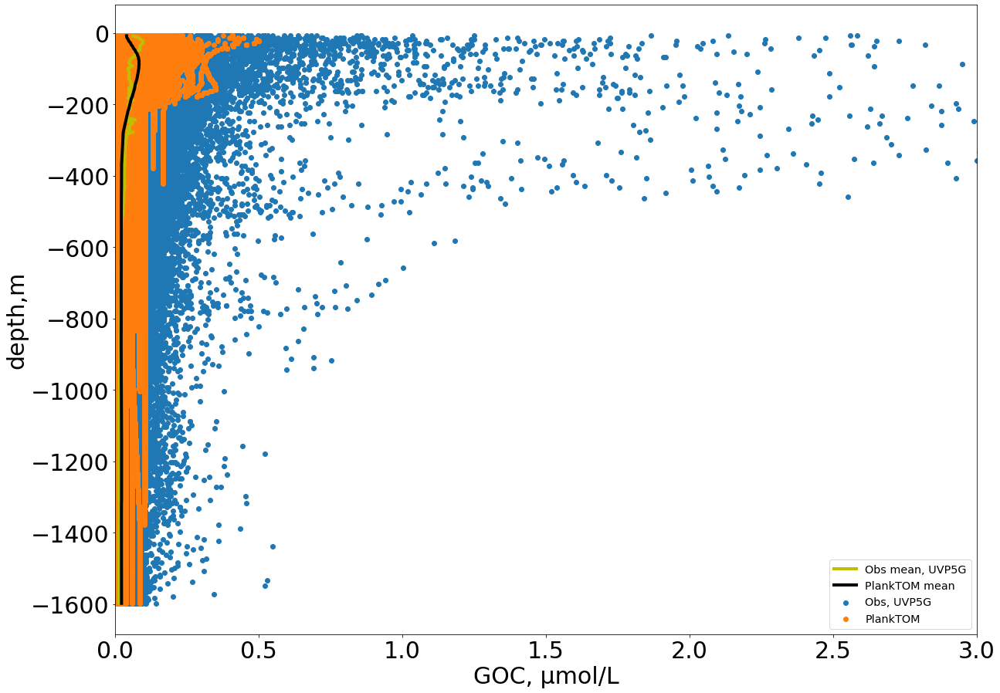

In [297]:
plot_fun(Interp_Pl_RK_final,'GOC_Mmol_wvL','GOC','GOC',0,3,'Scatter_GOC_interpolated_UVP5Glob.png')

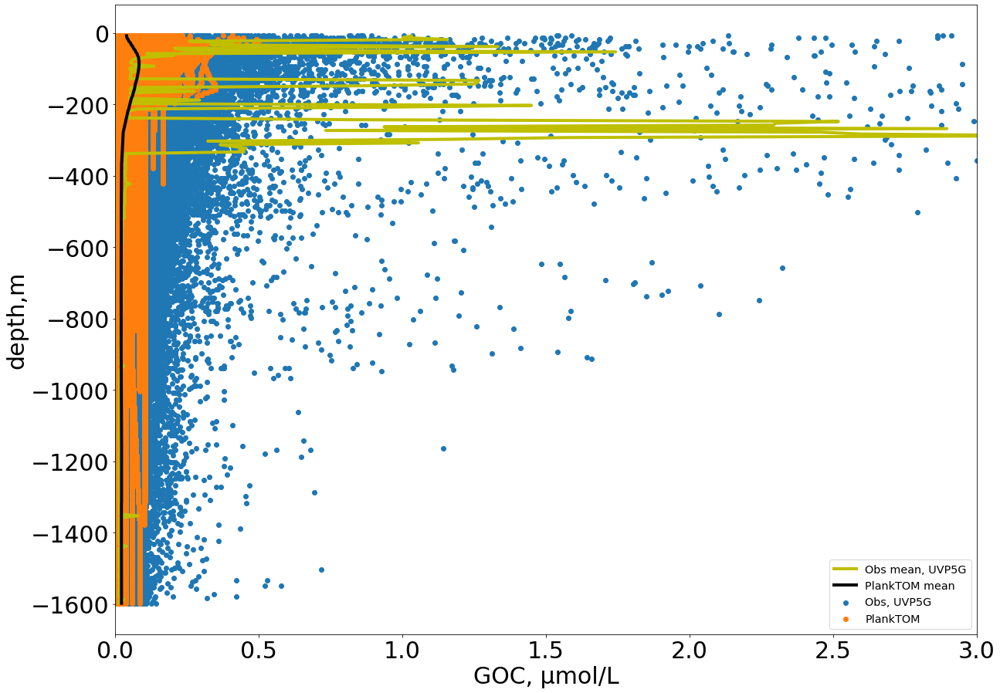

In [298]:
plot_fun(Interp_Pl_RK_final,'GOC_Mmol_wvL_all','GOC','GOC',0,3,'Scatter_GOC_All_interpolated_UVP5Glob.png')

In [38]:
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL.values,Interp_Pl_RK_final.GOC.values))
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL_low.values,Interp_Pl_RK_final.GOC.values))
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL_high.values,Interp_Pl_RK_final.GOC.values))
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL_all.values,Interp_Pl_RK_final.GOC.values))
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL_low2.values,Interp_Pl_RK_final.GOC.values))
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL_high2.values,Interp_Pl_RK_final.GOC.values))
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL_low2_all.values,Interp_Pl_RK_final.GOC.values))
print(RMSE(Interp_Pl_RK_final.GOC_Mmol_wvL_high2_all.values,Interp_Pl_RK_final.GOC.values))

0.2291790090520436
0.23636547221857582
0.2216933022822972
19.95746742434671
0.2484657928450978
0.21221502221137886
19.96179360841376
19.953556042875046


In [39]:
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL.values,Interp_Pl_RK_final.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL_low.values,Interp_Pl_RK_final.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL_high.values,Interp_Pl_RK_final.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL_all.values,Interp_Pl_RK_final.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL_low2.values,Interp_Pl_RK_final.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL_high2.values,Interp_Pl_RK_final.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL_low2_all.values,Interp_Pl_RK_final.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final.GOC_Mmol_wvL_high2_all.values,Interp_Pl_RK_final.GOC.values))

(0.061038192370780814, 2.6504603692473744e-291)
(0.06168691220748163, 1.7102065704080393e-297)
(0.06021149637767753, 1.646247049540071e-283)
(0.003786194758839233, 0.023789576281095407)
(0.06291540763869573, 2.137725768990823e-309)
(0.05909179515340741, 3.9938933643324465e-273)
(0.0038682944881235264, 0.02091430785435114)
(0.0037132783210685172, 0.026624711260307063)


In [40]:
print(Interp_Pl_RK_final.GOC.values.min(),Interp_Pl_RK_final.GOC.values.max())
print(Interp_Pl_RK_final.GOC_Mmol_wvL.values.min(),Interp_Pl_RK_final.GOC_Mmol_wvL.values.max())

0.0013175431856637942 0.5014554365819398
0.0 31.005055885926282


In [41]:
print(np.std(Interp_Pl_RK_final.GOC.values),np.std(Interp_Pl_RK_final.GOC_Mmol_wvL.values))

0.03333371195410363 0.22878431529820575


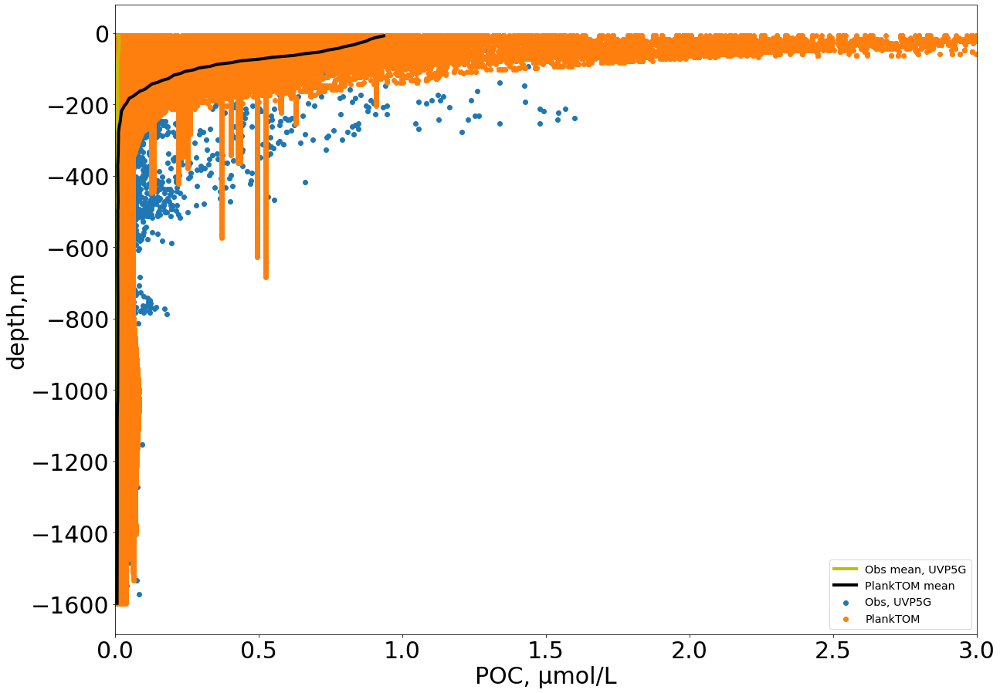

In [306]:
plot_fun(Interp_Pl_RK_final,'POC_Mmol_wvL','POC','POC',0,3,'Scatter_POC_interpolated_UVP5Glob.png')

In [42]:
print(RMSE(Interp_Pl_RK_final.POC_Mmol_wvL.values,Interp_Pl_RK_final.POC.values))

0.33708511530767726


In [43]:
print(scipy.stats.pearsonr(Interp_Pl_RK_final.POC_Mmol_wvL.values,Interp_Pl_RK_final.POC.values))

(0.08180114243151346, 0.0)


In [44]:
print(Interp_Pl_RK_final.POC.values.min(),Interp_Pl_RK_final.POC.values.max())
print(Interp_Pl_RK_final.POC_Mmol_wvL.values.min(),Interp_Pl_RK_final.POC_Mmol_wvL.values.max())

0.002322154468714644 4.780615806036318
0.0 1.6008879387321873


In [45]:
print(np.std(Interp_Pl_RK_final.POC.values),np.std(Interp_Pl_RK_final.POC_Mmol_wvL.values))

0.32358904640352537 0.023703262296314555


In [46]:
Interp_Pl_RK_final = Interp_Pl_RK_final.drop(columns=['level_0'])

In [47]:
Large_Data_Interp = Interp_Pl_RK_final.loc[Interp_Pl_RK_final['GOC_Mmol_wvL'] > 2.]
Interp_Pl_RK_final_NoLarge = Interp_Pl_RK_final.drop(Large_Data_Interp.index.to_numpy()).reset_index()

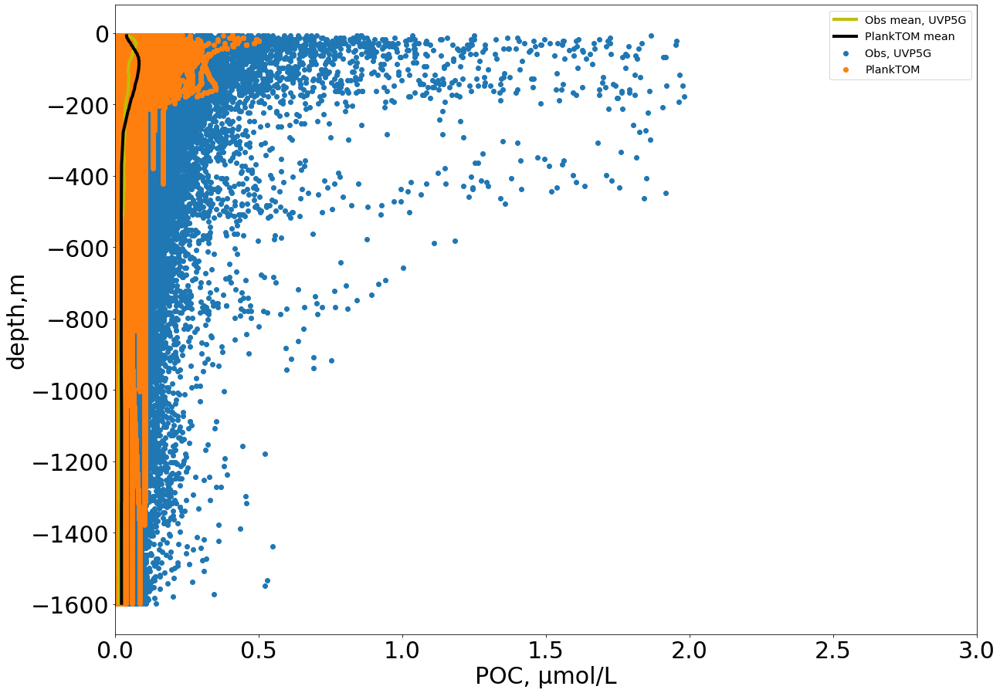

In [313]:
plot_fun(Interp_Pl_RK_final_NoLarge,'GOC_Mmol_wvL','GOC','POC',0,3,'Scatter_GOC_interpolated_UVP5Glob_NoLarge.png')

In [48]:
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_low.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_high.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_all.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_low2.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_high2.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_low2_all.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(RMSE(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_high2_all.values,Interp_Pl_RK_final_NoLarge.GOC.values))

0.06737824357051365
0.07026129058963719
0.064739020985371
13.510132706887994
0.07550646500851305
0.061661371383385476
13.510612811211633
13.509776137807236


In [49]:
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_low.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_high.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_all.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_low2.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_high2.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_low2_all.values,Interp_Pl_RK_final_NoLarge.GOC.values))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL_high2_all.values,Interp_Pl_RK_final_NoLarge.GOC.values))

(0.18330090495075826, 0.0)
(0.1818365417669527, 0.0)
(0.18411893626569975, 0.0)
(0.0020944538681977234, 0.21128930240338323)
(0.1798093707885327, 0.0)
(0.18482141975630906, 0.0)
(0.0022004258064165253, 0.1890902383549904)
(0.00200022899172015, 0.23255937460671489)


In [50]:
print(np.std(Interp_Pl_RK_final_NoLarge.GOC.values),np.std(Interp_Pl_RK_final_NoLarge.GOC_Mmol_wvL.values))

0.03332943688055802 0.06477693963062305


In [51]:
print(np.sqrt(np.mean((Interp_Pl_RK_final_NoLarge.POC_Mmol_wvL.values - Interp_Pl_RK_final_NoLarge.POC.values)**2)))
print(scipy.stats.pearsonr(Interp_Pl_RK_final_NoLarge.POC_Mmol_wvL.values,Interp_Pl_RK_final_NoLarge.POC.values))
print(np.std(Interp_Pl_RK_final_NoLarge.POC.values),np.std(Interp_Pl_RK_final_NoLarge.POC_Mmol_wvL.values))

0.33657131219749986
(0.11992827071692998, 0.0)
0.3231052347516986 0.011865418810193483


In [ ]:
#estimation of percentiles of POC and GOC from UVP5 and PlankTOM12

In [52]:
Percantiles_Interp = Interp_Pl_RK_final.groupby(['depth'])['POC', 'GOC', 'POC_Mmol_wvL', 'GOC_Mmol_wvL','POC_Mmol_wvL_all', 'GOC_Mmol_wvL_all'].quantile([0.25, 0.50, 0.75, 0.95]).unstack().reset_index()

In [53]:
Percantiles_Interp

depth       POC                                     GOC            \
                 0.25       0.5      0.75      0.95      0.25       0.5   
0       7.5  0.348842  0.698201  1.259171  3.000571  0.013768  0.026567   
1      12.5  0.301463  0.666987  1.239896  2.992073  0.014366  0.027678   
2      17.5  0.303387  0.652115  1.192316  2.815768  0.016474  0.029927   
3      22.5  0.289114  0.651118  1.206910  2.658418  0.018167  0.031751   
4      27.5  0.253662  0.632038  1.148276  2.533828  0.021561  0.036341   
..      ...       ...       ...       ...       ...       ...       ...   
314  1577.5  0.003388  0.004066  0.007741  0.027889  0.019212  0.024143   
315  1582.5  0.003387  0.004066  0.007732  0.027889  0.019357  0.024173   
316  1587.5  0.003387  0.004066  0.007732  0.027889  0.019357  0.024173   
317  1592.5  0.003387  0.004066  0.007732  0.027889  0.019357  0.024173   
318  1597.5  0.003387  0.004055  0.007718  0.027889  0.019357  0.024174   

                        POC_Mmol_wvL  ... GOC_Mmol_wvL            \
         0.75      0.95         0.25  ...         0.75      0.95   
0    0.048618  0.126830     0.002736  ...     0.050465  0.182071   
1    0.049795  0.125541     0.002849  ...     0.059101  0.219639   
2    0.053800  0.148803     0.002953  ...     0.065322  0.245854   
3    0.059138  0.145346     0.003004  ...     0.068531  0.265058   
4    0.065797  0.167737     0.003054  ...     0.071706  0.251566   
..        ...       ...          ...  ...          ...       ...   
314  0.026854  0.031349     0.002548  ...     0.016147  0.041035   
315  0.026870  0.031349     0.002550  ...     0.016461  0.037862   
316  0.026870  0.031349     0.002559  ...     0.015484  0.042885   
317  0.026870  0.031349     0.002506  ...     0.016254  0.041947   
318  0.026870  0.031349     0.002444  ...     0.016629  0.047100   

    POC_Mmol_wvL_all                               GOC_Mmol_wvL_all            \
                0.25       0.5      0.75      0.95             0.25       0.5   
0           0.002736  0.004602  0.009813  0.031842         0.012905  0.026005   
1           0.002849  0.004960  0.011174  0.039430         0.014434  0.028899   
2           0.002953  0.005047  0.011307  0.039234         0.015645  0.031389   
3           0.003004  0.005203  0.011608  0.040241         0.017151  0.033854   
4           0.003054  0.005155  0.011919  0.041917         0.017570  0.035938   
..               ...       ...       ...       ...              ...       ...   
314         0.002548  0.003520  0.005287  0.010530         0.004849  0.008394   
315         0.002550  0.003511  0.005281  0.010541         0.004617  0.009005   
316         0.002559  0.003488  0.005187  0.010308         0.005037  0.008681   
317         0.002506  0.003618  0.005294  0.010306         0.004867  0.008725   
318         0.002444  0.003532  0.005221  0.010904         0.004796  0.009086   

                         
         0.75      0.95  
0    0.056876  0.231507  
1    0.065042  0.278523  
2    0.071391  0.308068  
3    0.074867  0.319166  
4    0.078787  0.374110  
..        ...       ...  
314  0.016198  0.043323  
315  0.016461  0.040511  
316  0.015681  0.046313  
317  0.016254  0.044250  
318  0.016794  0.050556  

[319 rows x 25 columns]

In [ ]:
#plot Figure 4 from article

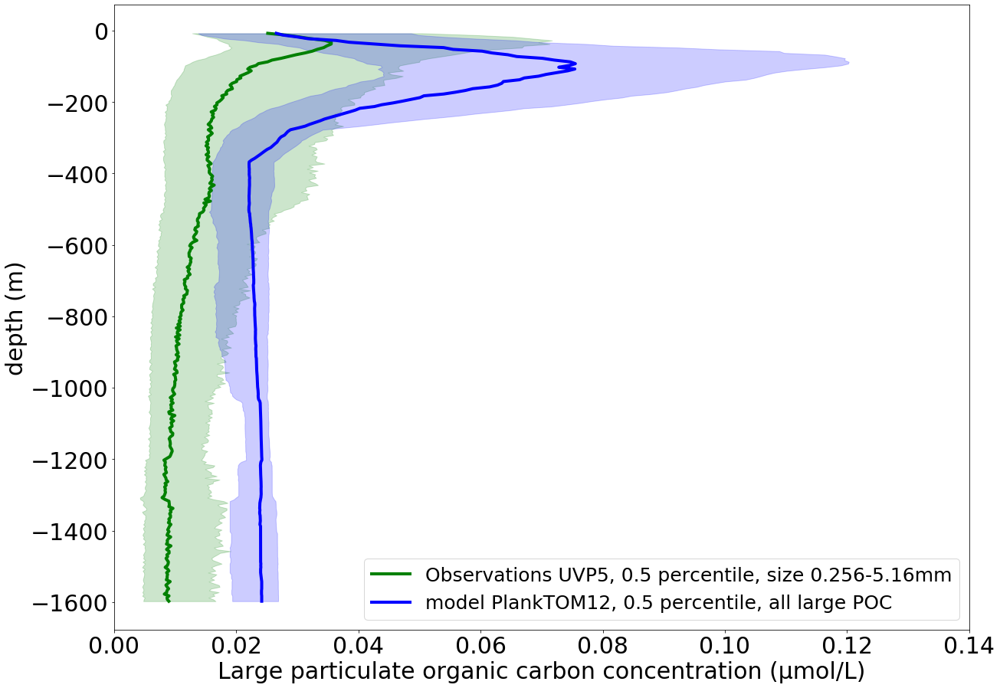

In [45]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Percantiles_Interp['GOC_Mmol_wvL', 0.5].values,-Percantiles_Interp.depth.values,'g', linewidth = 4,label = 'Observations UVP5, 0.5 percentile, size 0.256-5.16mm')
# plt.plot(Percantiles_Interp['GOC_Mmol_wvL_all', 0.5].values,-Percantiles_Interp.depth.values,'g', ls ='-.', linewidth = 4,label = 'Obs 0.5 all, UVP5G')
plt.plot(Percantiles_Interp['GOC', 0.5].values,-Percantiles_Interp.depth.values,'b', linewidth = 4,label = 'model PlankTOM12, 0.5 percentile, all large POC')

plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['GOC_Mmol_wvL', 0.25].values, Percantiles_Interp['GOC_Mmol_wvL', 0.75].values, alpha=0.2,color='g')
plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['GOC', 0.25].values, Percantiles_Interp['GOC', 0.75].values, alpha=0.2,color='b')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Large particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,0.14])
plt.savefig('/Figures_Article/GOC_percetiles_interpolated_UVP5Glob.png')


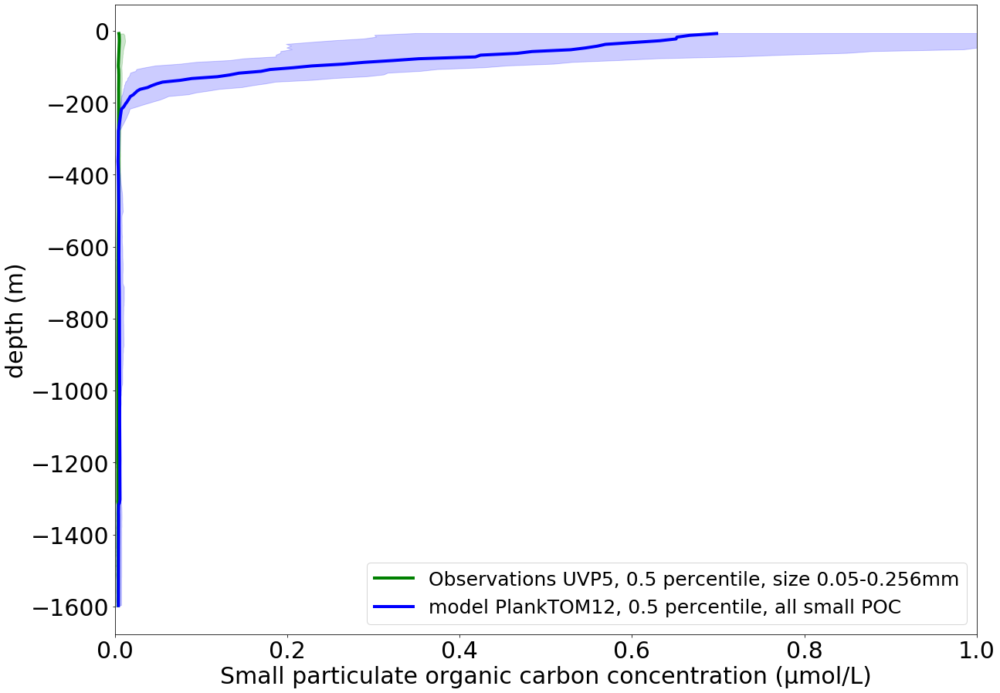

In [46]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Percantiles_Interp['POC_Mmol_wvL', 0.5].values,-Percantiles_Interp.depth.values,'g', linewidth = 4,label = 'Observations UVP5, 0.5 percentile, size 0.05-0.256mm')
# plt.plot(Percantiles_Interp['GOC_Mmol_wvL_all', 0.5].values,-Percantiles_Interp.depth.values,'g', ls ='-.', linewidth = 4,label = 'Obs 0.5 all, UVP5G')
plt.plot(Percantiles_Interp['POC', 0.5].values,-Percantiles_Interp.depth.values,'b', linewidth = 4,label = 'model PlankTOM12, 0.5 percentile, all small POC')

plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['POC_Mmol_wvL', 0.25].values, Percantiles_Interp['POC_Mmol_wvL', 0.75].values, alpha=0.2,color='g')
plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['POC', 0.25].values, Percantiles_Interp['POC', 0.75].values, alpha=0.2,color='b')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Small particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,1.])
plt.savefig('/Figures_Article/POC_percetiles_interpolated_UVP5Glob_new.png')


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


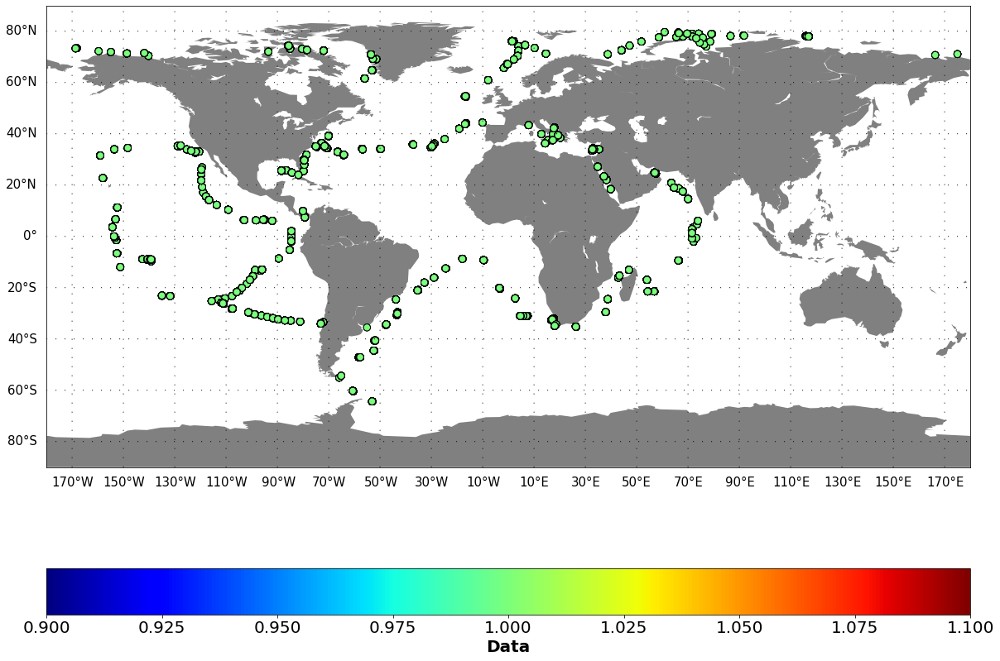

In [344]:
plot_glob_distr(All_Data_tot_OBS_extr,'lat','lon','Obs_Tara_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


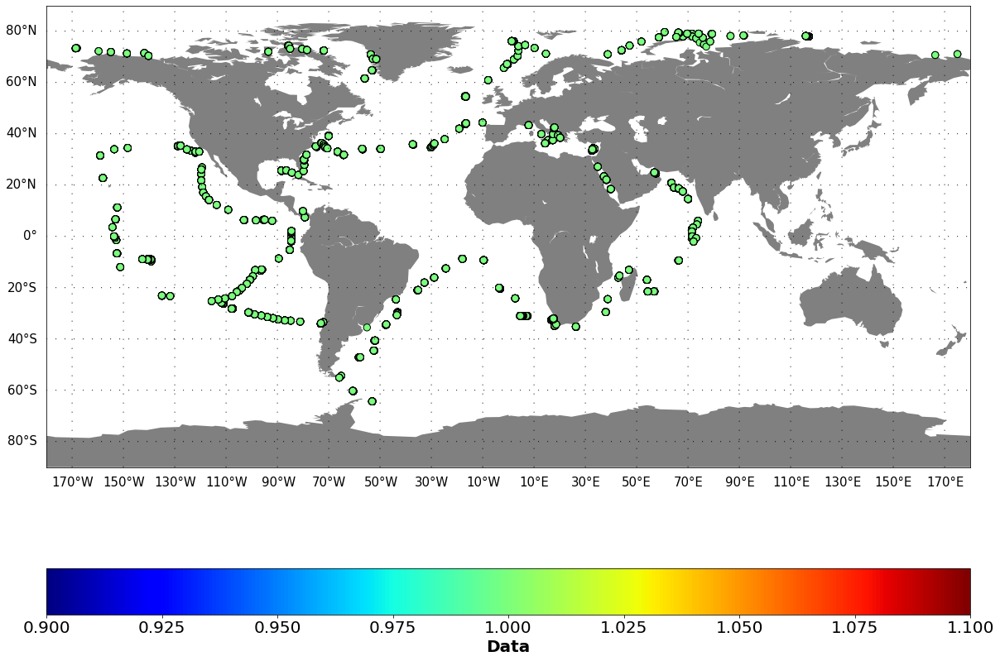

In [345]:
plot_glob_distr(All_Data_Pl_All_new,'lat','lon','PlankTOMDaily_Tara_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


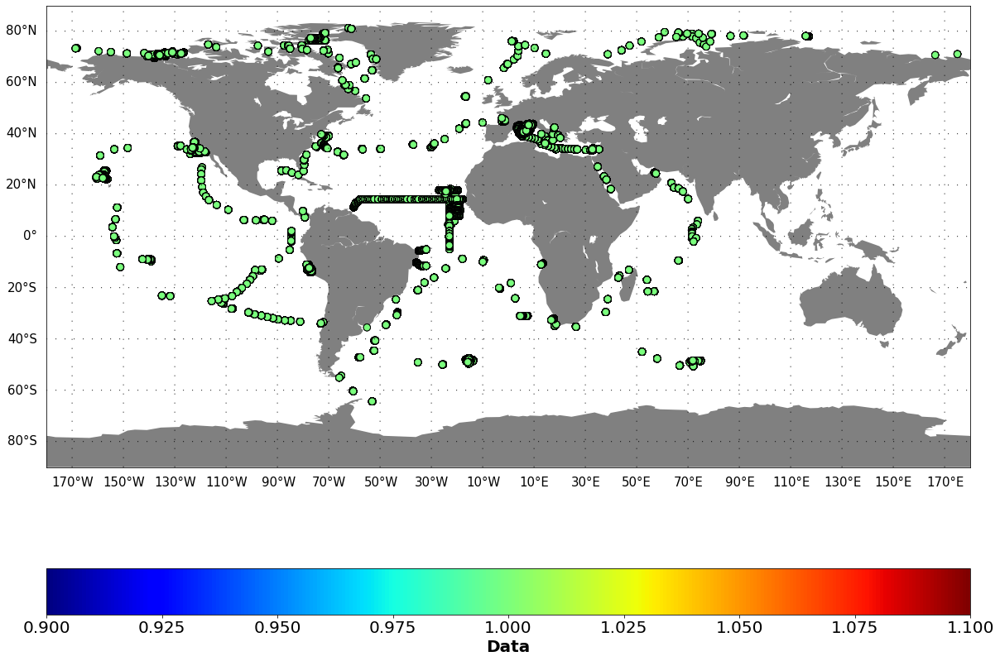

In [346]:
plot_glob_distr(All_Data_tot_OBS_RK_extr,'lat','lon','Obs_RK_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


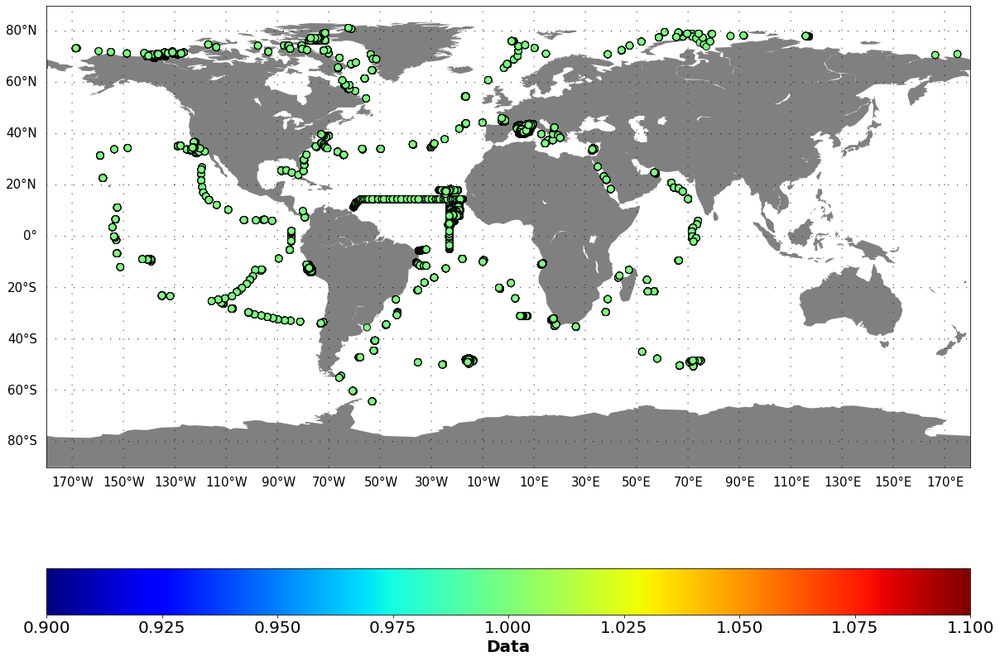

In [347]:
plot_glob_distr(All_Data_Pl_All_RK_new,'lat','lon','PlankTOMDaily_RK_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


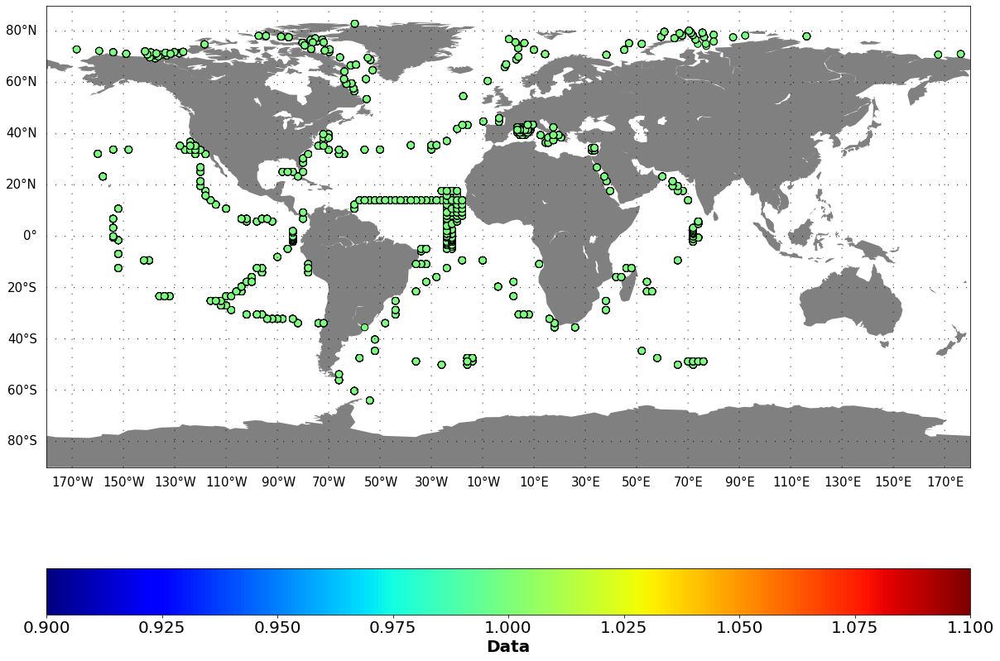

In [350]:
plot_glob_distr(All_Data_Pl_All_RK_new_month,'lat_Pl','lon_Pl','PlankTOMMonthly_RK_positions.png')

In [57]:
All_Data_tot_OBS_RK_extr['coordinates'] = list(zip(All_Data_tot_OBS_RK_extr.lat, All_Data_tot_OBS_RK_extr.lon))
All_Data_tot_OBS_extr['coordinates'] = list(zip(All_Data_tot_OBS_extr.lat, All_Data_tot_OBS_extr.lon))

In [ ]:
#plot Figure 1 from article

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


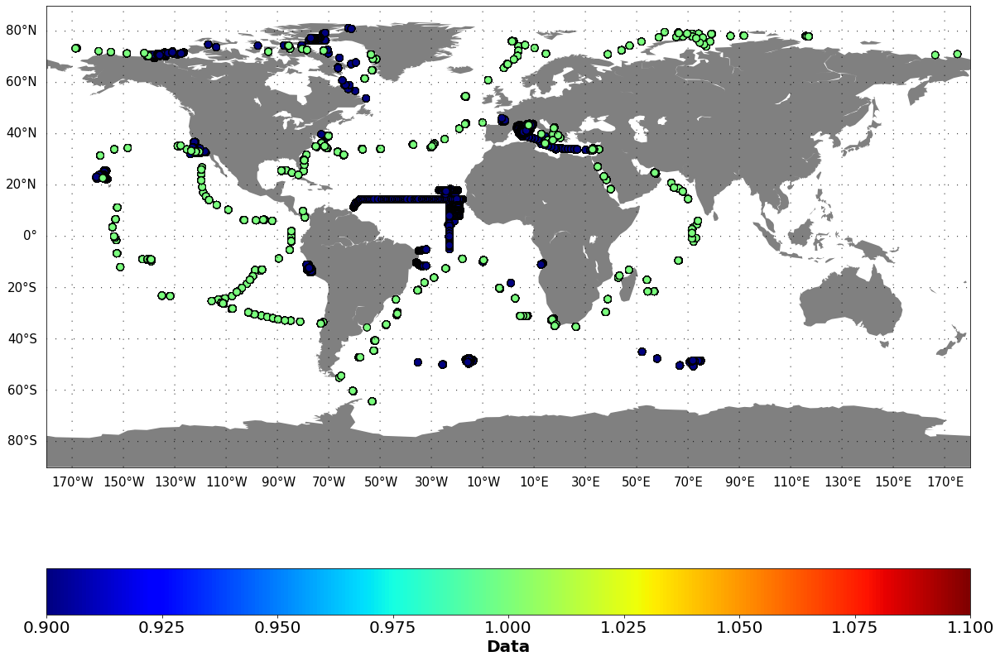

In [351]:
plt.figure(figsize=[20. , 15.],facecolor='w')
#limits=[1.,18.]
m = Basemap(projection='cyl',llcrnrlat=-90,urcrnrlat=90,\
            llcrnrlon=-180,urcrnrlon=180)
m.fillcontinents(color='grey',lake_color='white',zorder = 0)
parallels = np.arange(-80.,81,20.)
m.drawparallels(parallels,dashes=[1,10],labels=[1,0,0,0],fontsize=15) #[False,True,True,False])
meridians = np.arange(10.,351.,20.)
m.drawmeridians(meridians,dashes=[1,10],labels=[True,False,False,True],fontsize=15)
m.scatter(All_Data_tot_OBS_RK_extr.lon.values,All_Data_tot_OBS_RK_extr.lat.values, latlon = True, \
          c=10*np.ones(len(All_Data_tot_OBS_RK_extr.lon.values)),s=70,\
          cmap='jet',alpha = None, edgecolors = 'k')
m.scatter(All_Data_tot_OBS_extr.lon.values,All_Data_tot_OBS_extr.lat.values, latlon = True, \
          c=np.ones(len(All_Data_tot_OBS_extr.lon.values)),s=70,\
          cmap='jet',alpha = None, edgecolors = 'k')
#create colorbar 
cbar = plt.colorbar(orientation='horizontal')
cbar.set_label(label=r'Data',size=20, weight='bold')
cbar.ax.tick_params(labelsize=20)
plt.savefig('/Figures_Article/Obs_TaraRK_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


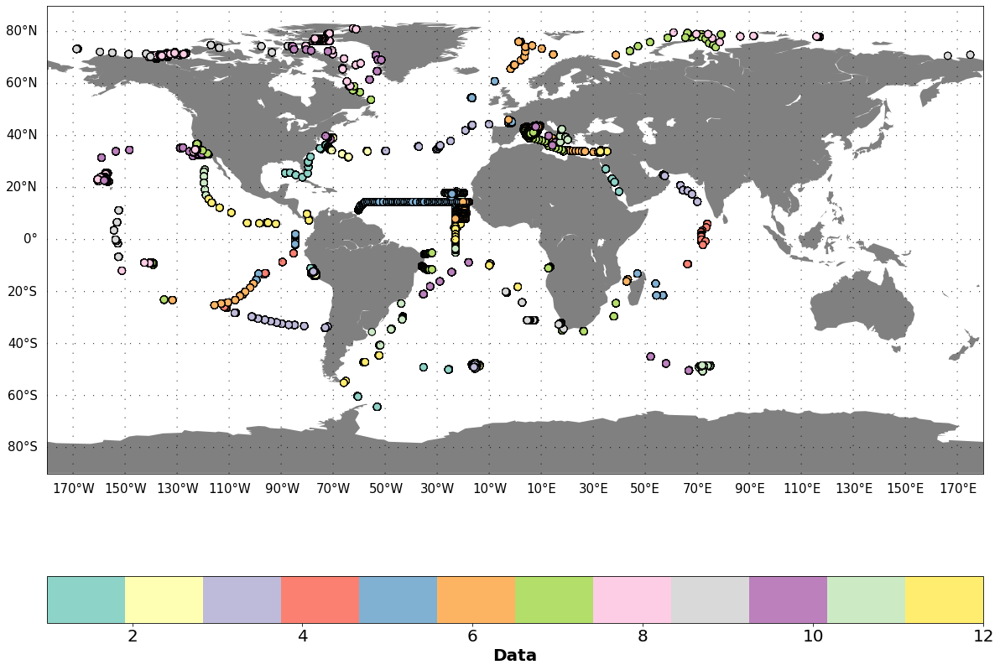

In [35]:
plt.figure(figsize=[20. , 15.],facecolor='w')
#limits=[1.,18.]
m = Basemap(projection='cyl',llcrnrlat=-90,urcrnrlat=90,\
            llcrnrlon=-180,urcrnrlon=180)
m.fillcontinents(color='grey',lake_color='white',zorder = 0)
parallels = np.arange(-80.,81,20.)
m.drawparallels(parallels,dashes=[1,10],labels=[1,0,0,0],fontsize=15) #[False,True,True,False])
meridians = np.arange(10.,351.,20.)
m.drawmeridians(meridians,dashes=[1,10],labels=[True,False,False,True],fontsize=15)
m.scatter(All_Data_tot_OBS_RK_extr.lon.values,All_Data_tot_OBS_RK_extr.lat.values, latlon = True, \
          c=All_Data_tot_OBS_RK_extr.month.values,s=70,\
          cmap='Set3',alpha = None, edgecolors = 'k')
#create colorbar 
cbar = plt.colorbar(orientation='horizontal')
cbar.set_label(label=r'Data',size=20, weight='bold')
cbar.ax.tick_params(labelsize=20)
plt.savefig('/Figures_Article/Obs_RK_months.png')

In [352]:
All_Data_tot_OBS_RK_extr.groupby(['lat','lon','year','month','day']).mean().reset_index()

,lat,lon,year,month,day,depth,watervolume,biovol16,biovol17,biovol18,...,POC_Mmol_wvL_all,GOC_Mmol_wvL_all,POC_Mmol_wvL_low2,GOC_Mmol_wvL_low2,POC_Mmol_wvL_high2,GOC_Mmol_wvL_high2,POC_Mmol_wvL_low2_all,GOC_Mmol_wvL_low2_all,POC_Mmol_wvL_high2_all,GOC_Mmol_wvL_high2_all
0,-64.359,-53.006,2011,1,9,250.000000,27.058100,0.0,0.0,0.0,...,0.002487,0.129237,0.0,0.117571,0.008883,0.108689,0.0,0.131724,0.008883,0.122842
1,-64.349,-53.102,2011,1,9,232.500000,38.098925,0.0,0.0,0.0,...,0.002221,0.091795,0.0,0.084231,0.007776,0.076454,0.0,0.094016,0.007776,0.086239
2,-60.410,-60.449,2011,1,3,242.500000,33.607732,0.0,0.0,0.0,...,0.001967,0.060909,0.0,0.062725,0.007444,0.055281,0.0,0.062875,0.007444,0.055432
3,-60.232,-60.645,2011,1,3,442.500000,40.123446,0.0,0.0,0.0,...,0.001161,0.034654,0.0,0.035012,0.004229,0.030783,0.0,0.035816,0.004229,0.031586
4,-55.103,-65.905,2010,12,17,37.500000,56.375333,0.0,0.0,0.0,...,0.006142,0.040341,0.0,0.046483,0.018088,0.028394,0.0,0.046483,0.018088,0.028394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,79.673,60.880,2013,8,11,55.000000,47.683636,0.0,0.0,0.0,...,0.009587,0.102865,0.0,0.091602,0.018932,0.072671,0.0,0.112452,0.018932,0.093520
2600,80.908,-61.196,2013,8,22,384.565217,21.145109,0.0,0.0,0.0,...,0.079638,0.337107,0.0,0.391786,0.156683,0.235103,0.0,0.416746,0.156683,0.260063
2601,81.244,-62.355,2013,8,22,234.777778,9.603000,0.0,0.0,0.0,...,0.367575,2.255576,0.0,2.591521,0.750416,1.841105,0.0,2.623152,0.750416,1.872736
2602,81.249,-62.368,2013,8,21,228.088235,10.831765,0.0,0.0,0.0,...,0.331128,2.049468,0.0,2.314752,0.673565,1.641187,0.0,2.380596,0.673565,1.707032


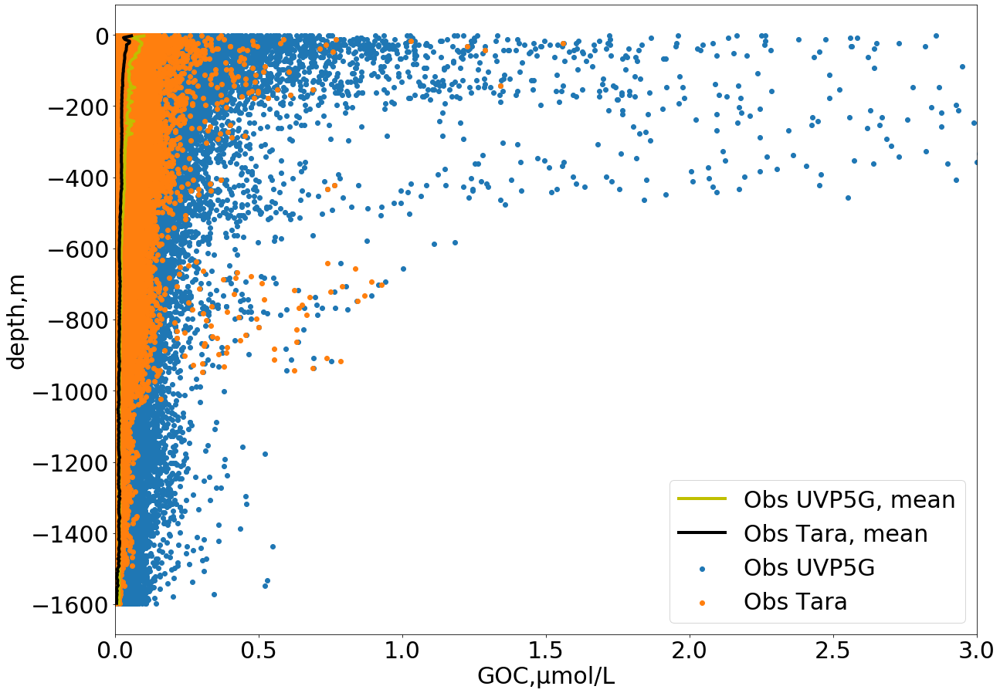

In [363]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_tot_OBS_extr,'GOC','GOC_Mmol_wvL','GOC_Mmol_wvL',\
                    'Obs UVP5G','Obs Tara',0,3,'Scatter_All_RKvsTara_GOC.png')

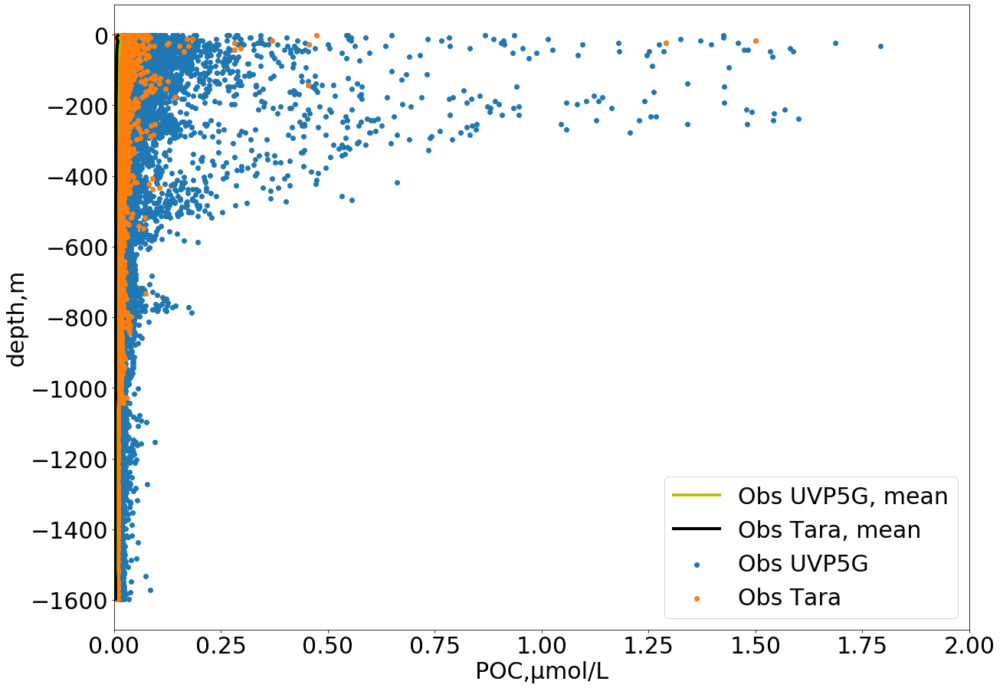

In [364]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_tot_OBS_extr,'POC','POC_Mmol_wvL','POC_Mmol_wvL',\
                    'Obs UVP5G','Obs Tara',0,2,'Scatter_All_RKvsTara_POC.png')

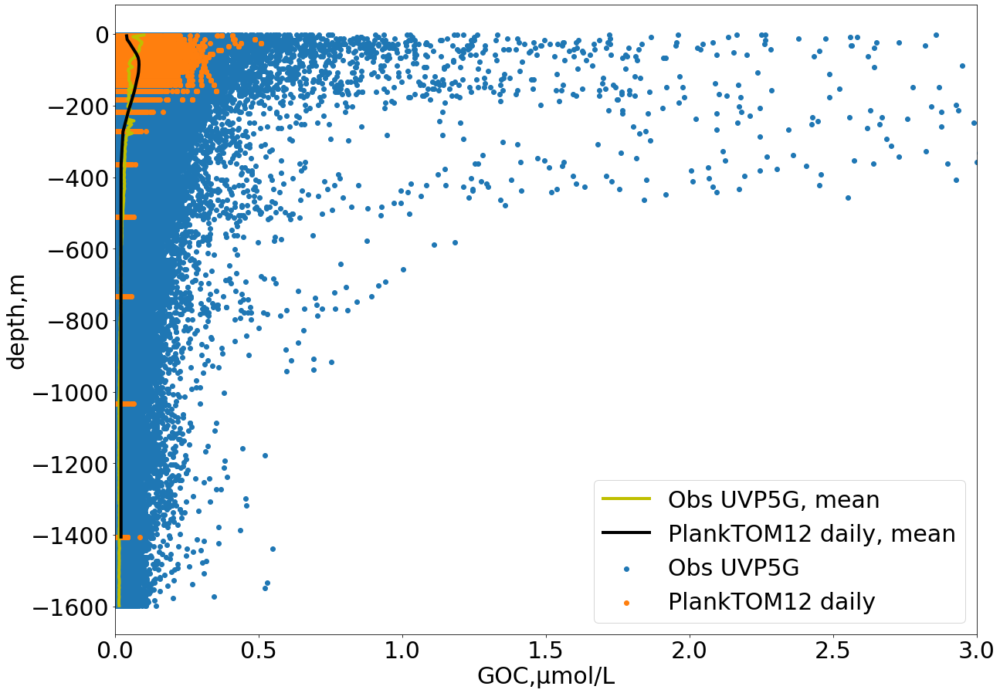

In [365]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs UVP5G','PlankTOM12 daily',0,3,'Scatter_PlankTOMDaily_All_RK_GOC.png')

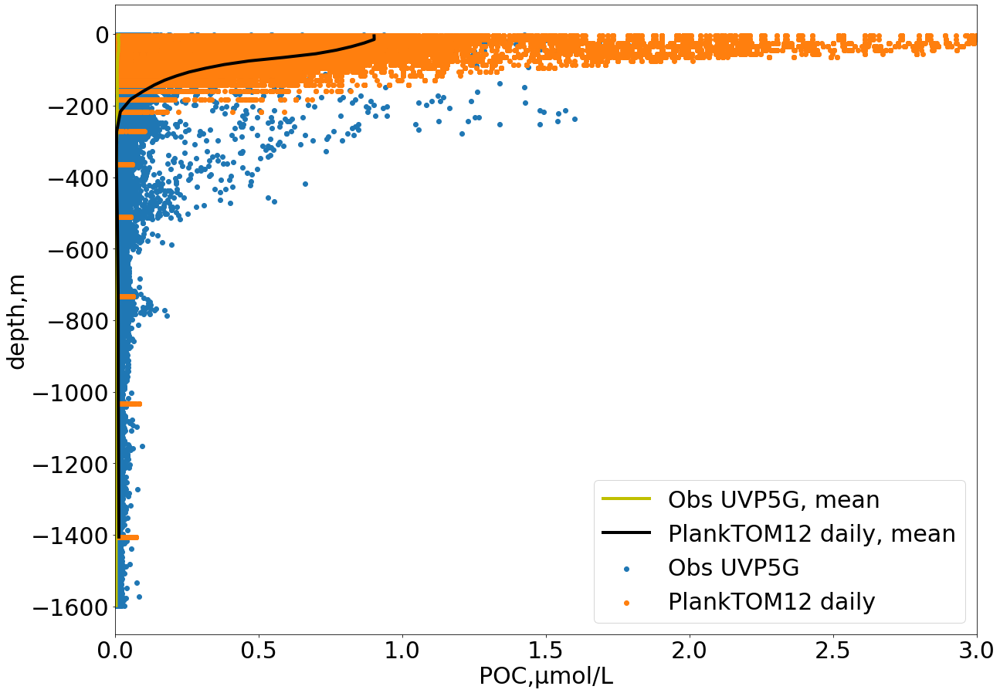

In [366]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new,'POC','POC_Mmol_wvL','POC',\
                    'Obs UVP5G','PlankTOM12 daily',0,3,'Scatter_PlankTOMDaily_All_RK_POC.png')

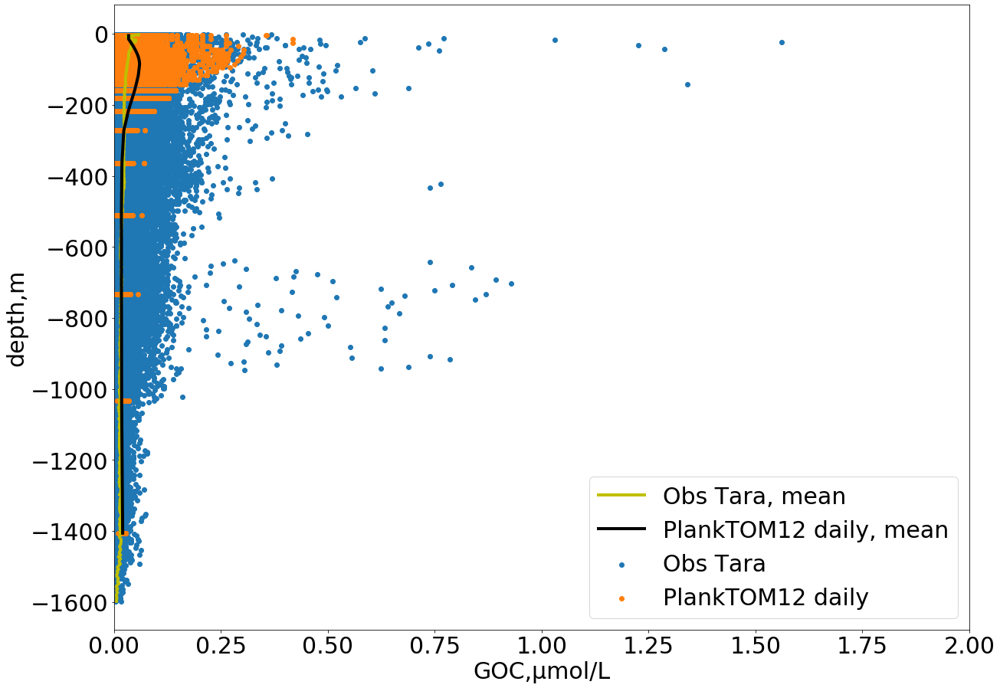

In [368]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs Tara','PlankTOM12 daily',0,2,'Scatter_PlankTOMDaily_All_Tara_GOC.png')

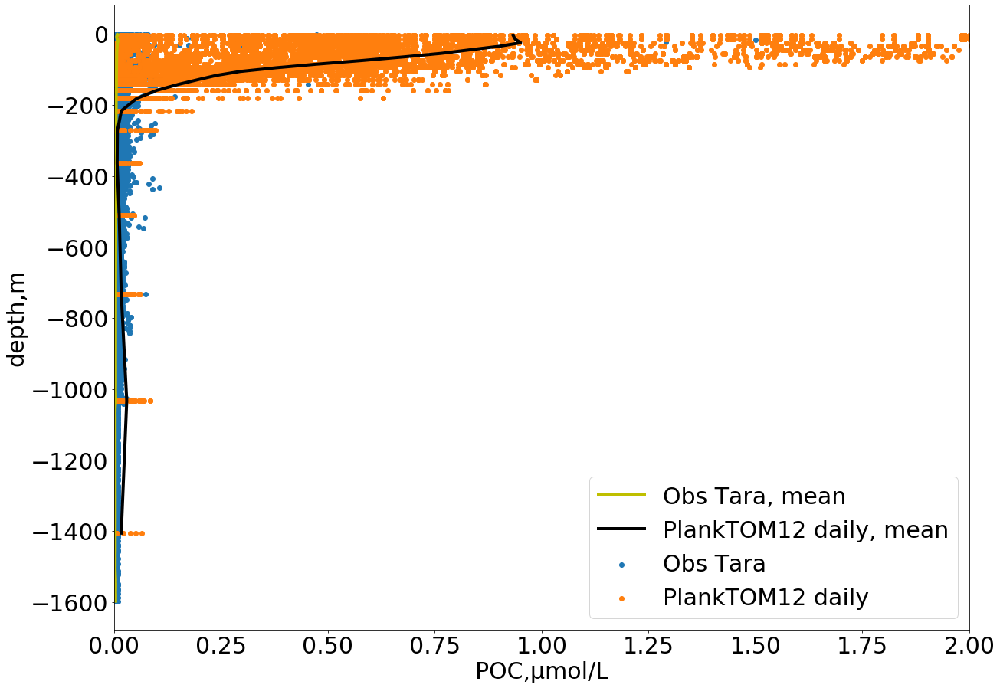

In [369]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new,'POC','POC_Mmol_wvL','POC',\
                    'Obs Tara','PlankTOM12 daily',0,2,'Scatter_PlankTOMDaily_All_Tara_POC.png')

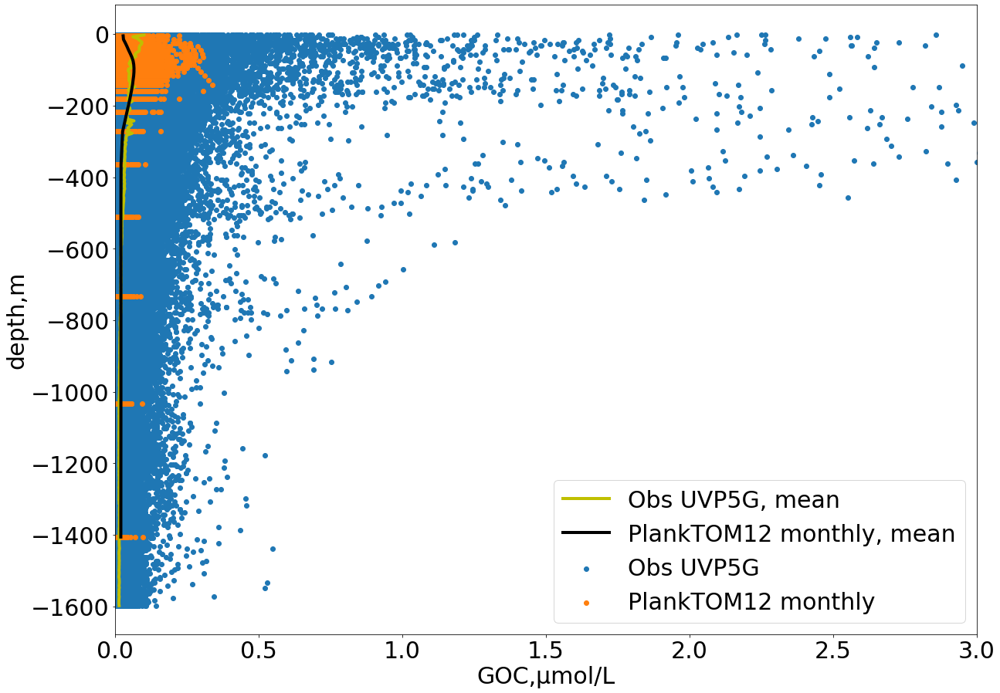

In [372]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new_month,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs UVP5G','PlankTOM12 monthly',0,3,'Scatter_PlankTOMMonthly_All_RK_GOC.png')

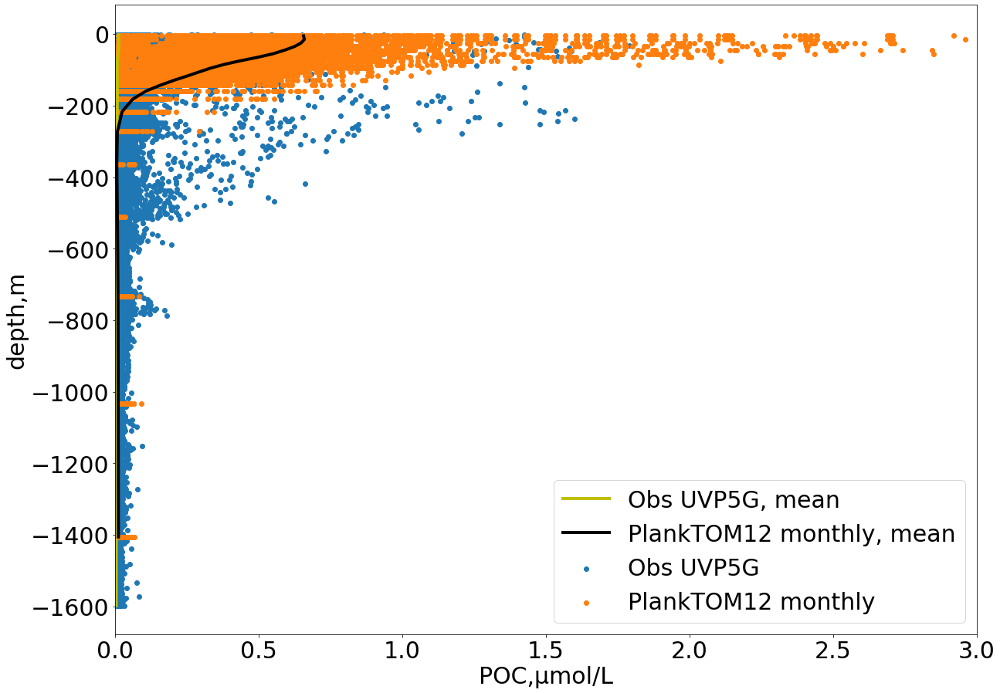

In [373]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new_month,'POC','POC_Mmol_wvL','POC',\
                    'Obs UVP5G','PlankTOM12 monthly',0,3,'Scatter_PlankTOMMonthly_All_RK_POC.png')

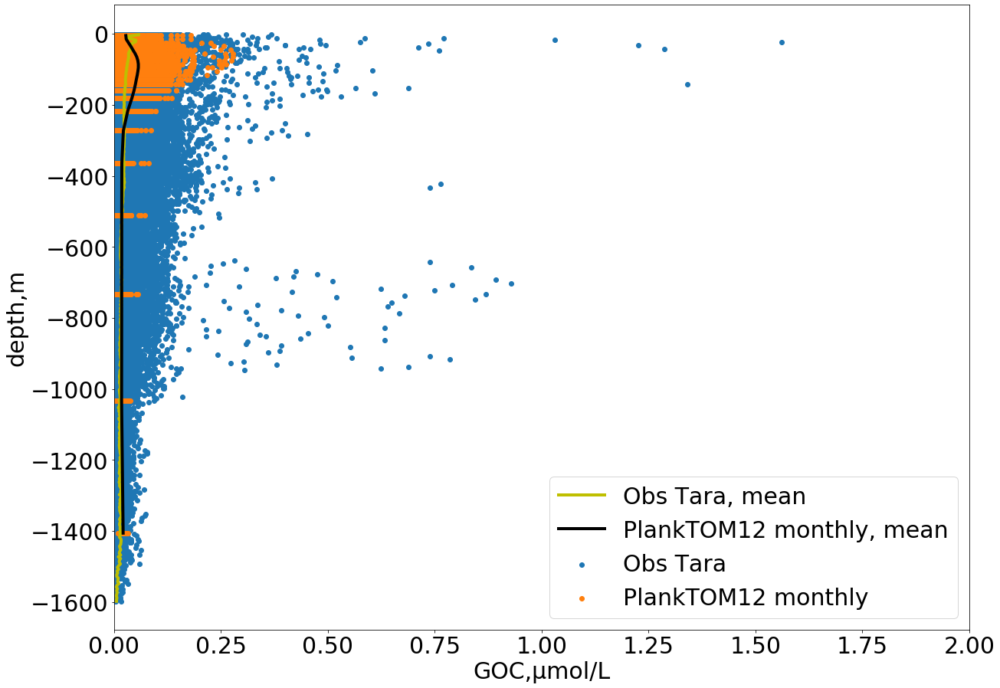

In [374]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new_month,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs Tara','PlankTOM12 monthly',0,2,'Scatter_PlankTOMMonthly_All_Tara_GOC.png')

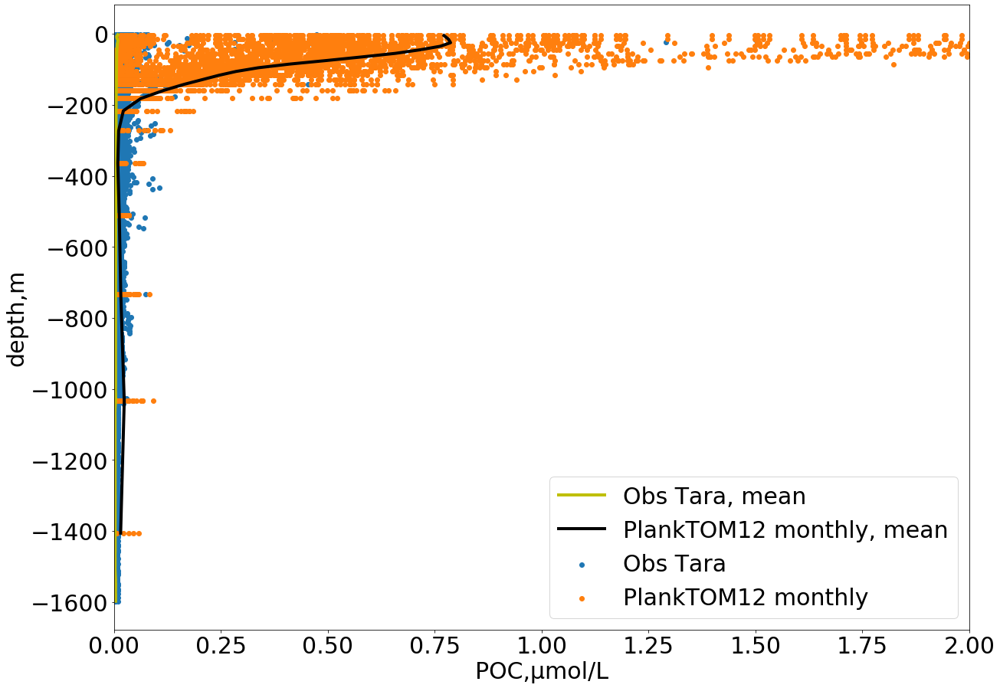

In [375]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new_month,'POC','POC_Mmol_wvL','POC',\
                    'Obs Tara','PlankTOM12 monthly',0,2,'Scatter_PlankTOMMonthly_All_Tara_POC.png')

In [376]:
All_Data_tot_OBS_extr_mean = All_Data_tot_OBS_extr.groupby('depth').sum().reset_index()
All_Data_tot_OBS_RK_extr_mean = All_Data_tot_OBS_RK_extr.groupby('depth').sum().reset_index()
All_Data_Pl_new_mean = All_Data_Pl_All_new.groupby('depth').sum().reset_index()
All_Data_Pl_RK_new_mean = All_Data_Pl_All_RK_new.groupby('depth').sum().reset_index()

In [377]:
All_Data_tot_OBS_RK_extr['lon'] = All_Data_tot_OBS_RK_extr['lon'].apply(lambda x: round(x, 2))
All_Data_tot_OBS_RK_extr['lat'] = All_Data_tot_OBS_RK_extr['lat'].apply(lambda x: round(x, 2))
All_Data_tot_OBS_extr['lon'] = All_Data_tot_OBS_extr['lon'].apply(lambda x: round(x, 2))
All_Data_tot_OBS_extr['lat'] = All_Data_tot_OBS_extr['lat'].apply(lambda x: round(x, 2))

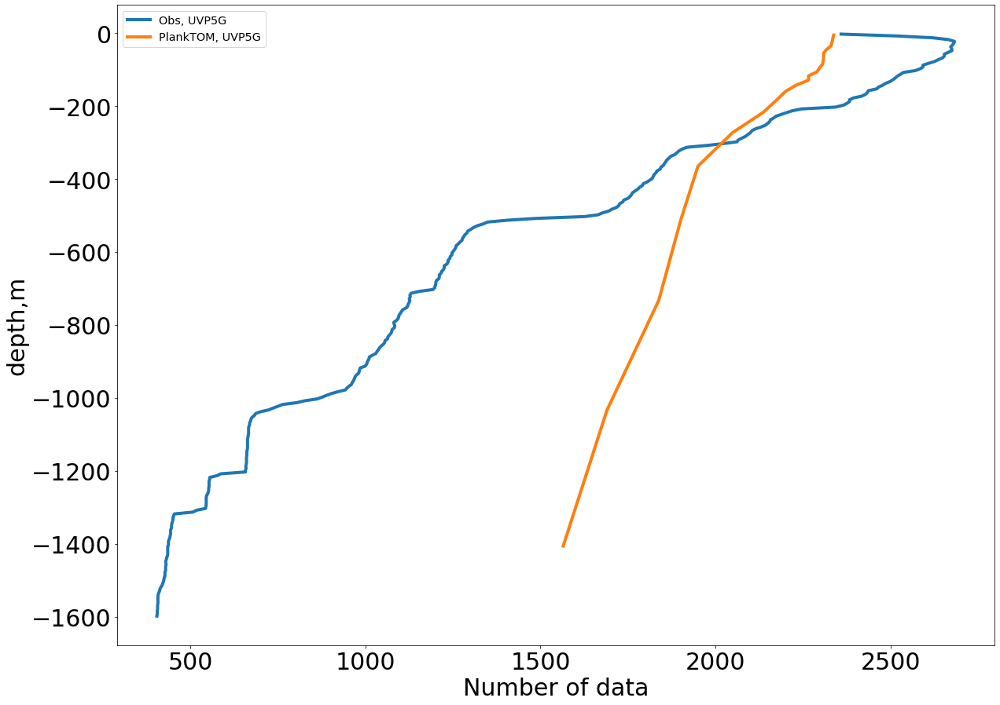

In [378]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(All_Data_tot_OBS_RK_extr.groupby(['depth']).size().values,-All_Data_tot_OBS_RK_extr.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'Obs, UVP5G')
plt.plot(All_Data_Pl_All_RK_new.groupby(['depth']).size().values,-All_Data_Pl_All_RK_new.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'PlankTOM, UVP5G')
locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Number of data',fontsize=30)
plt.ylabel('depth,m',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 'x-large')
#plt.xlim([0,3])
plt.savefig('/Figures_Article/NumberData_PlankTOMDaily_RK_GOC.png')

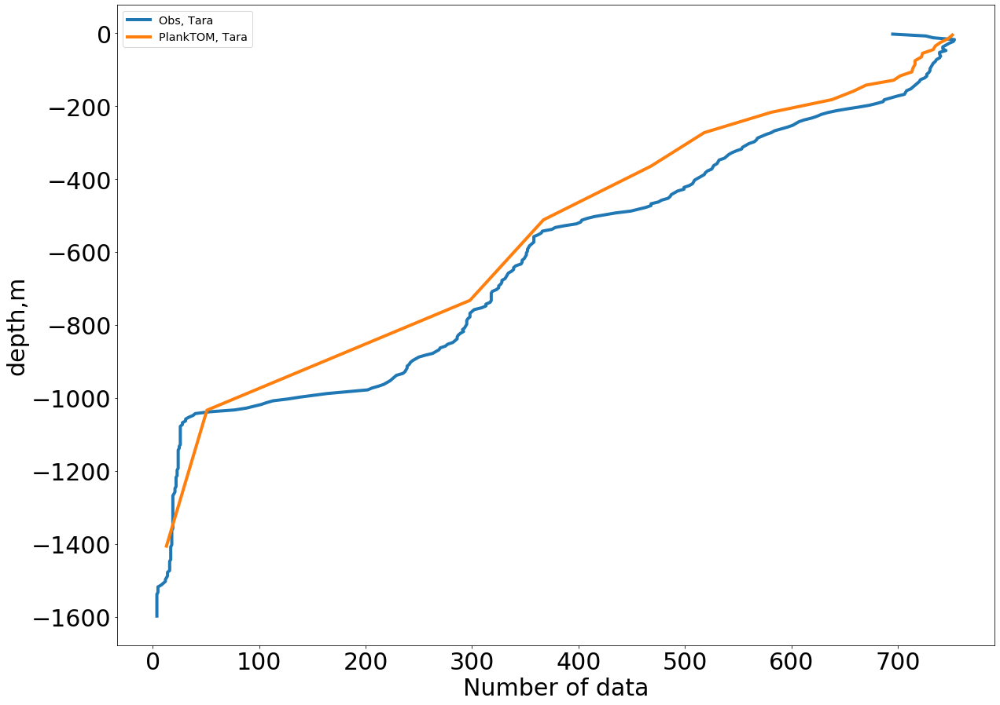

In [379]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(All_Data_tot_OBS_extr.groupby(['depth']).size().values,-All_Data_tot_OBS_extr.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'Obs, Tara')
plt.plot(All_Data_Pl_All_new.groupby(['depth']).size().values,-All_Data_Pl_All_new.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'PlankTOM, Tara')
locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Number of data',fontsize=30)
plt.ylabel('depth,m',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 'x-large')
#plt.xlim([0,3])
plt.savefig('/Figures_Article/NumberData_PlankTOMDaily_Tara_GOC.png')


In [381]:
test = ['','_all','_low2','_high2','_low2_all','_high2_all']

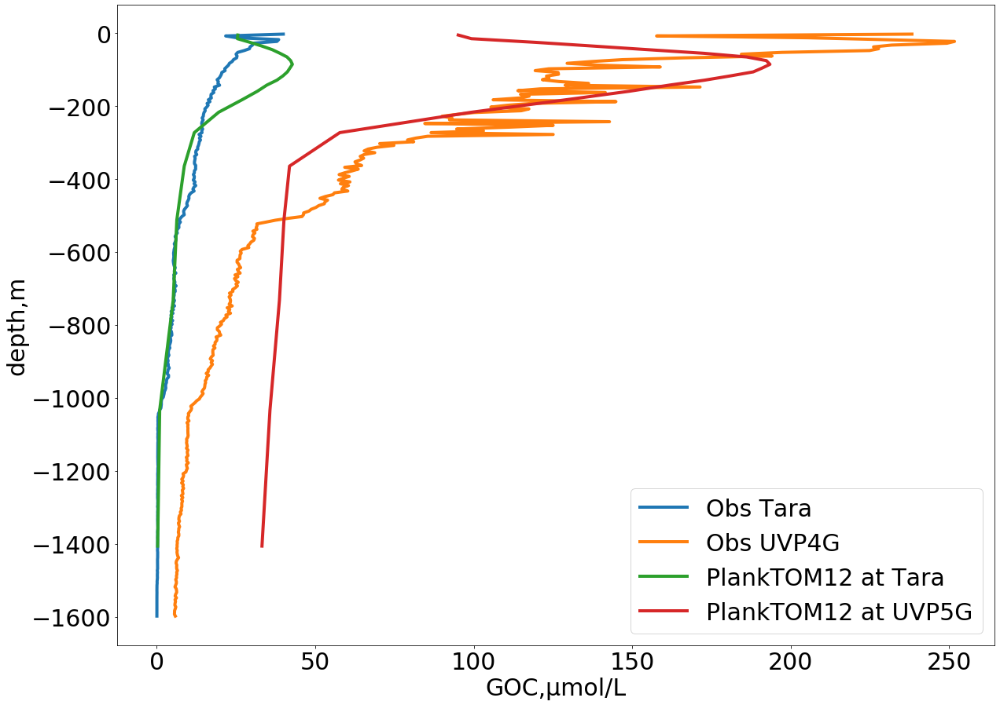

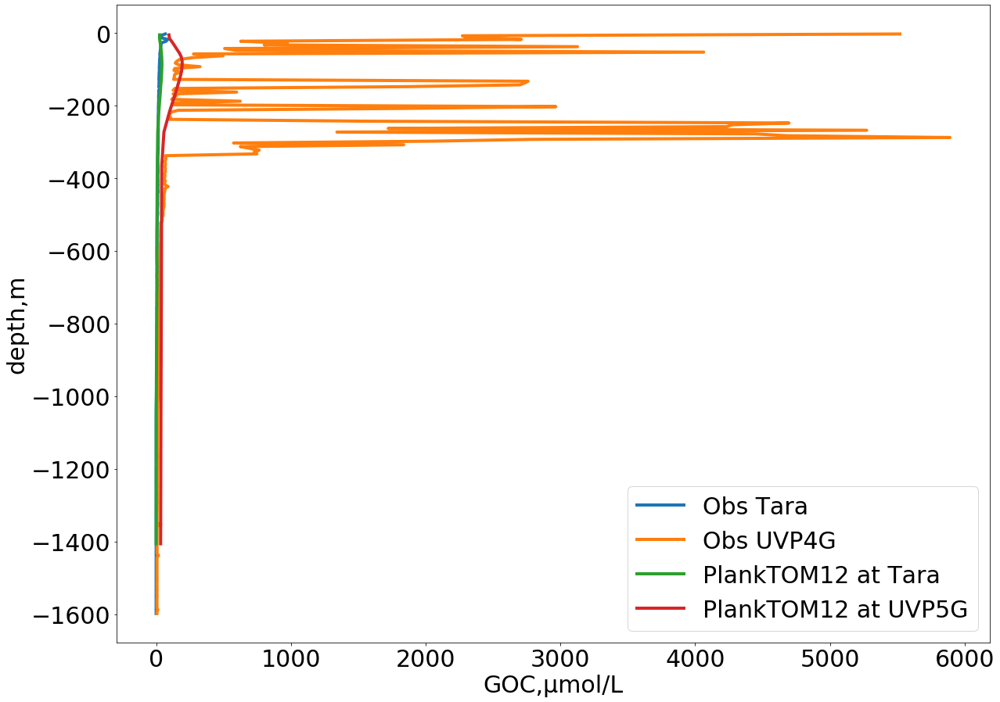

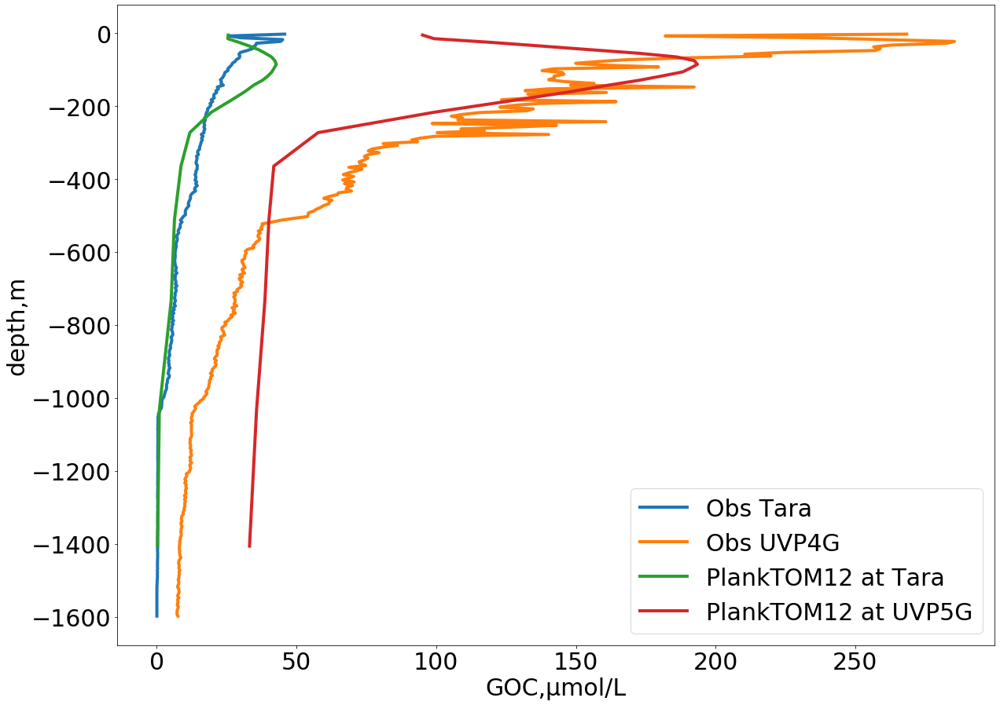

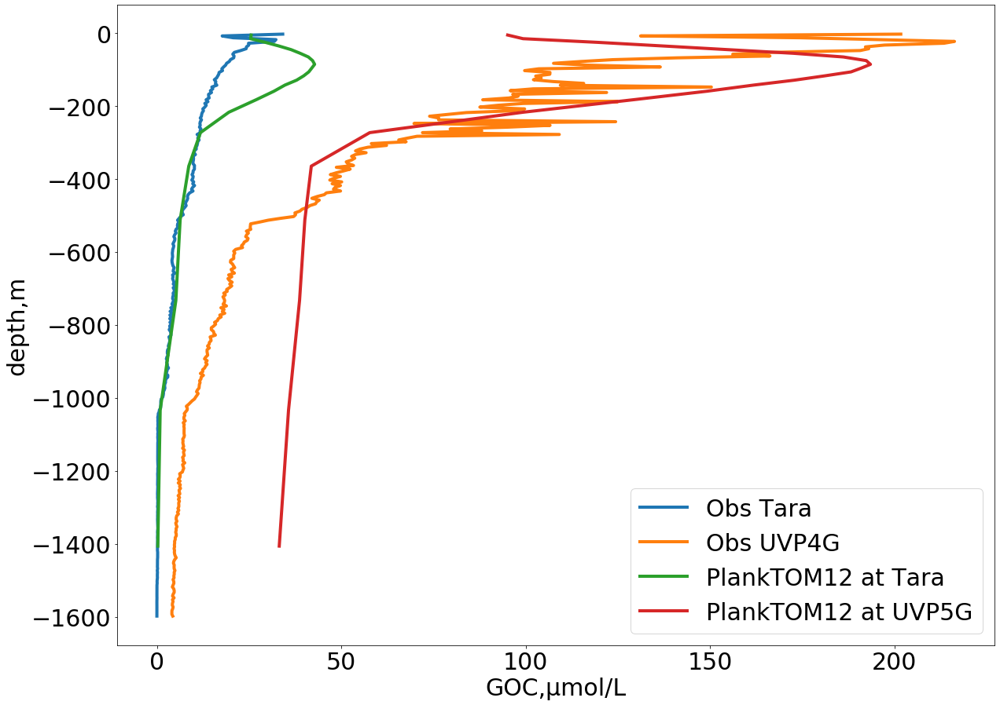

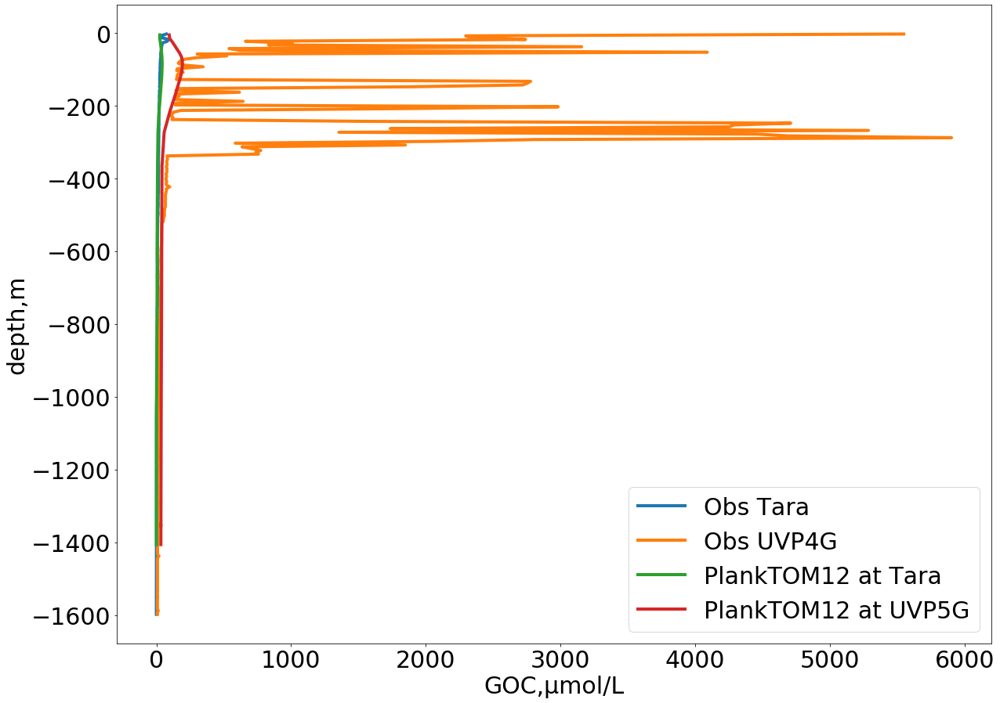

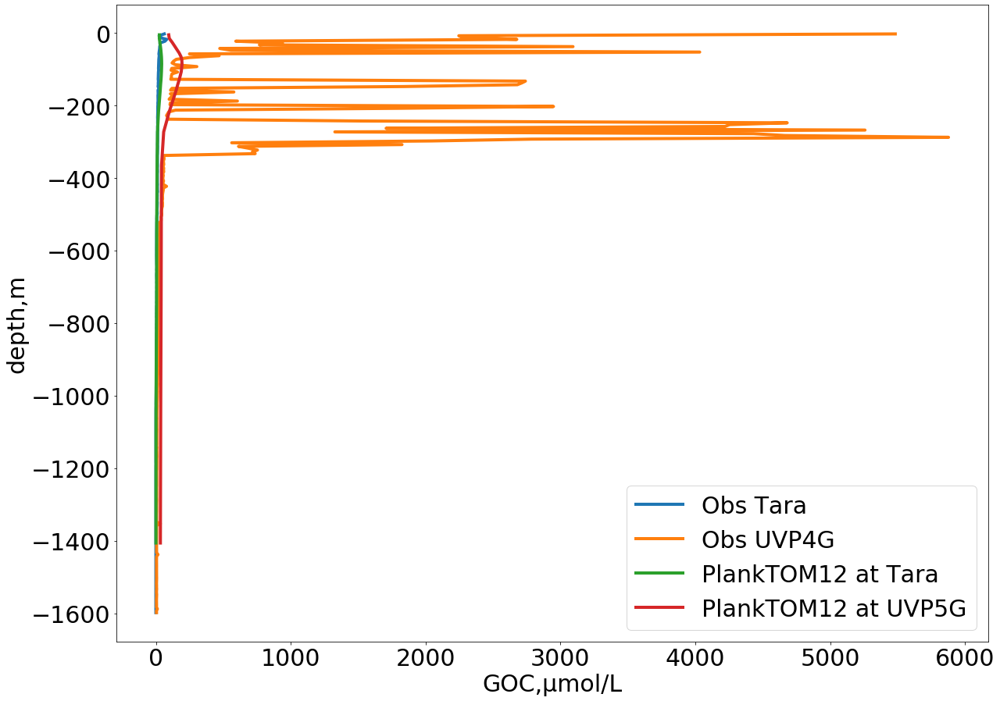

In [383]:
for r in test:
    plot_mean_profiles(All_Data_tot_OBS_extr_mean,All_Data_tot_OBS_RK_extr_mean,All_Data_Pl_new_mean,\
                       All_Data_Pl_RK_new_mean,\
                       'GOC','GOC_Mmol_wvL'+r,'GOC_Mmol_wvL'+r,'GOC','GOC',\
                       'Obs Tara','Obs UVP4G','PlankTOM12 at Tara','PlankTOM12 at UVP5G',\
                       'GOC'+r+'_vertical_pr_comp_Daily_PlvsObs.png')

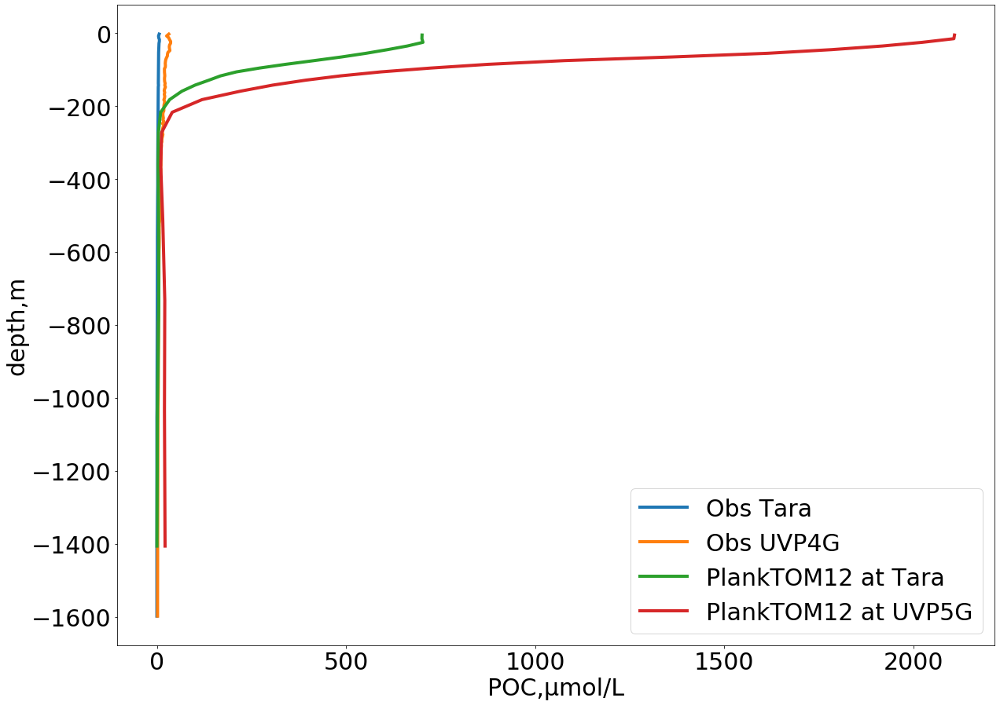

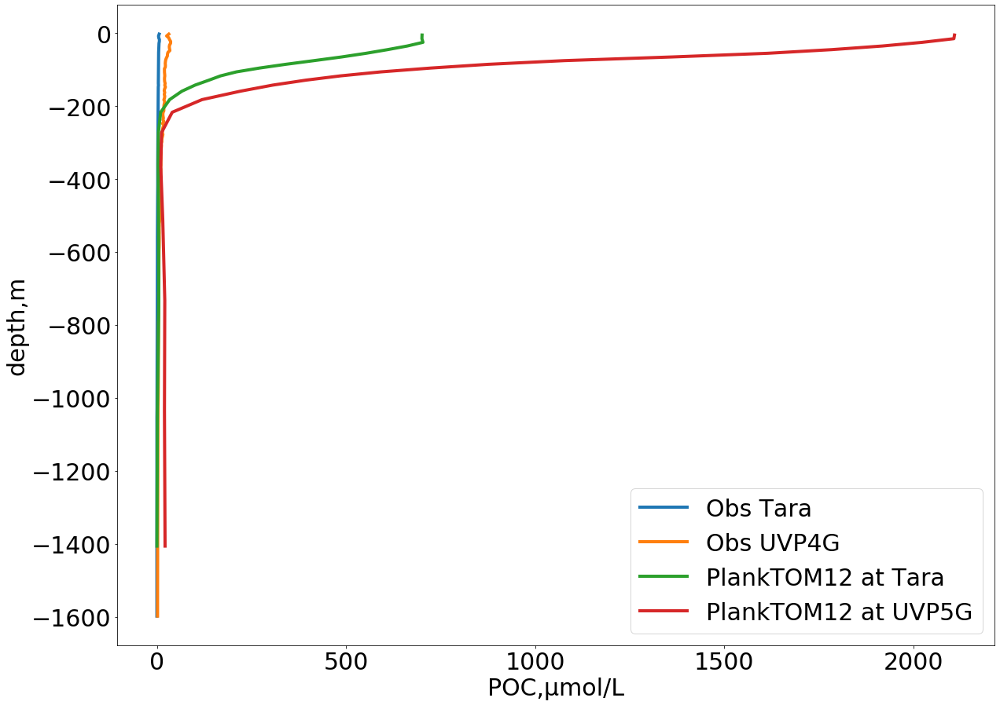

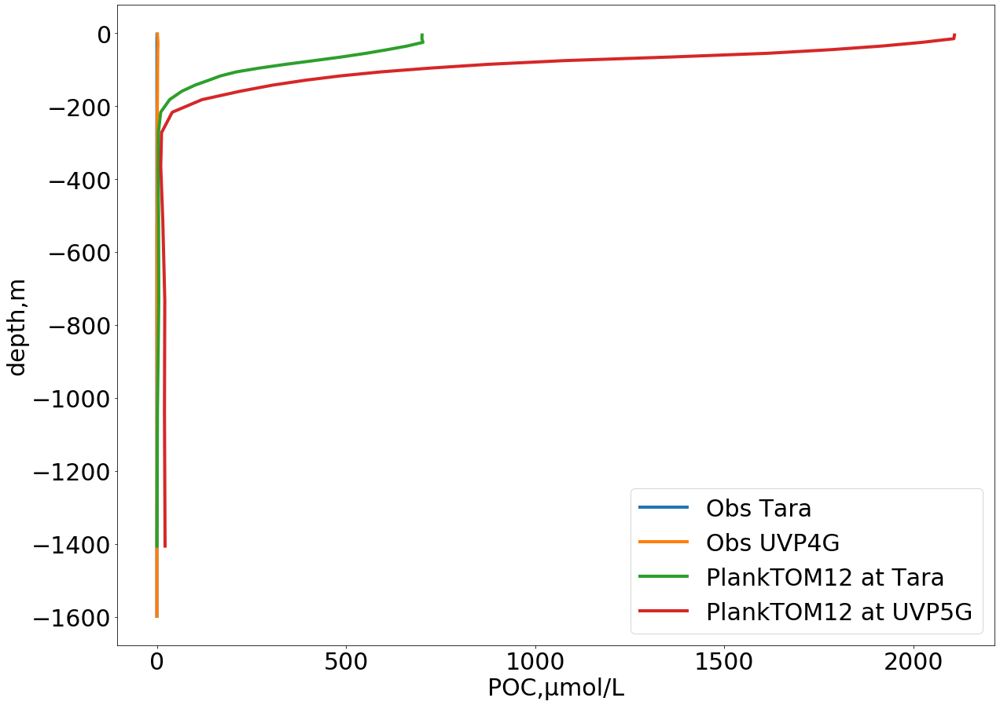

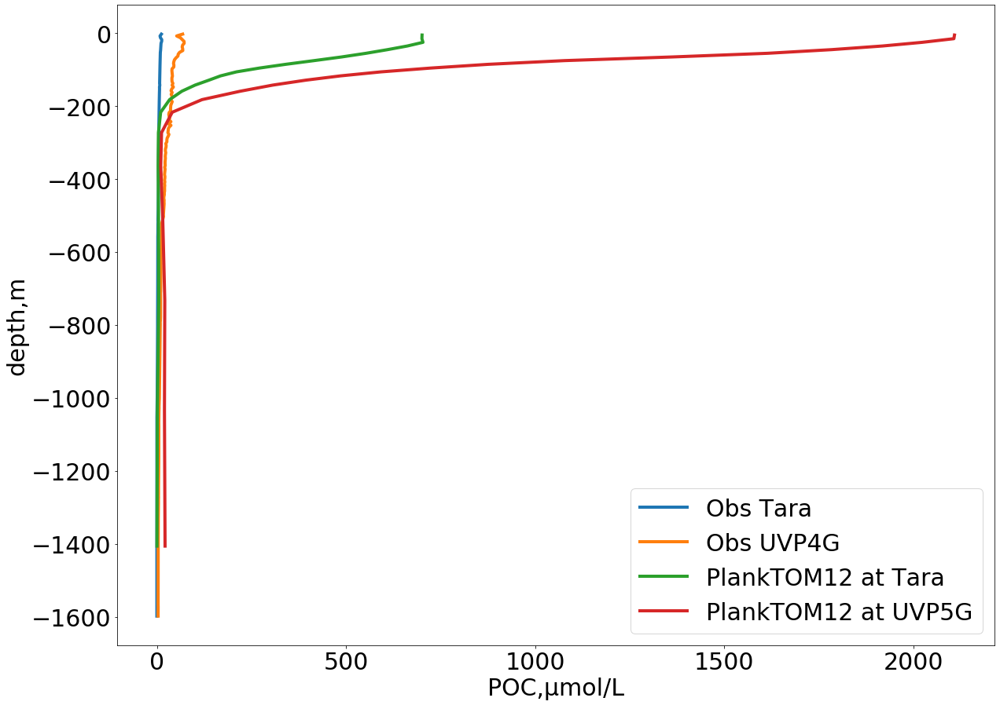

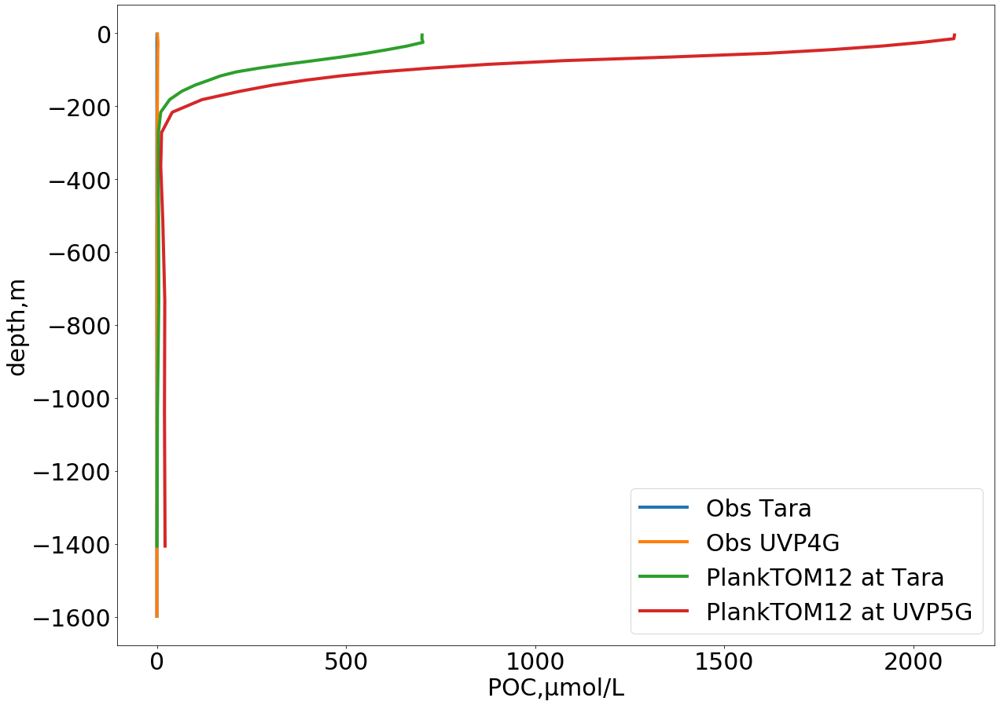

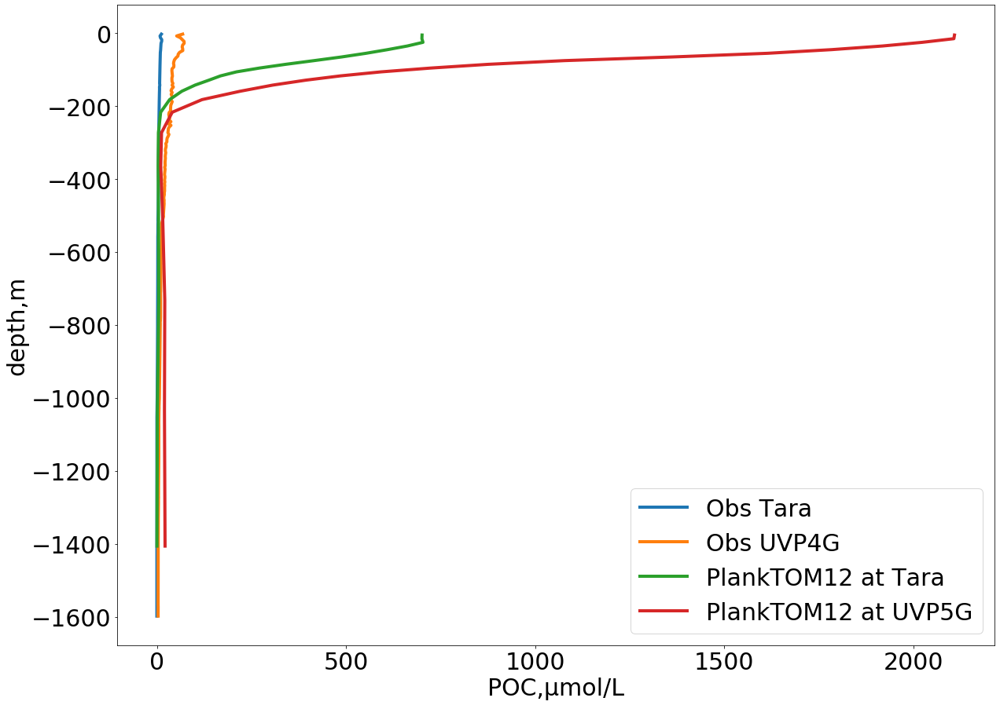

In [385]:
for r in test:
    plot_mean_profiles(All_Data_tot_OBS_extr_mean,All_Data_tot_OBS_RK_extr_mean,All_Data_Pl_new_mean,\
                       All_Data_Pl_RK_new_mean,\
                       'POC','POC_Mmol_wvL'+r,'POC_Mmol_wvL'+r,'POC','POC',\
                       'Obs Tara','Obs UVP4G','PlankTOM12 at Tara','PlankTOM12 at UVP5G',\
                       'POC'+r+'_vertical_pr_comp_Daily_PlvsObs.png')

In [ ]:
#separation of zone on Figure S1

In [154]:
All_Data_tot_OBS_extr_zone1 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -180.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < -50.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 40.)]

All_Data_tot_OBS_RK_extr_zone1 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -180.) &\
                                                       (All_Data_tot_OBS_RK_extr['lon'] < -50.) &\
                                                       (All_Data_tot_OBS_RK_extr['lat'] > 40.)]

All_Data_Pl_All_new_zone1 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -180.) &\
                                            (All_Data_Pl_All_new['lon'] < -50.) &\
                                            (All_Data_Pl_All_new['lat'] > 40.)]

All_Data_Pl_All_RK_new_zone1 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -180.) &\
                                            (All_Data_Pl_All_RK_new['lon'] < -50.) &\
                                            (All_Data_Pl_All_RK_new['lat'] > 40.)]

All_Data_Pl_All_RK_new_month_zone1 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -180.) &\
                                            (All_Data_Pl_All_RK_new_month['lon_Pl'] < -50.) &\
                                            (All_Data_Pl_All_RK_new_month['lat_Pl'] > 40.)]

In [158]:
All_Data_tot_OBS_extr_zone2 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -30.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 180.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 50.)]

All_Data_tot_OBS_RK_extr_zone2 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -30.) &\
                                                       (All_Data_tot_OBS_RK_extr['lon'] < 180.) &\
                                                       (All_Data_tot_OBS_RK_extr['lat'] > 50.)]

All_Data_Pl_All_new_zone2 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -30.) &\
                                            (All_Data_Pl_All_new['lon'] < 180.) &\
                                            (All_Data_Pl_All_new['lat'] > 50.)]

All_Data_Pl_All_RK_new_zone2 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -30.) &\
                                            (All_Data_Pl_All_RK_new['lon'] < 180.) &\
                                            (All_Data_Pl_All_RK_new['lat'] > 50.)]

All_Data_Pl_All_RK_new_month_zone2 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -30.) &\
                                            (All_Data_Pl_All_RK_new_month['lon_Pl'] < 180.) &\
                                            (All_Data_Pl_All_RK_new_month['lat_Pl'] > 50.)]

In [165]:
All_Data_tot_OBS_extr_zone3 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -90.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 0.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 20.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 50.)]

All_Data_tot_OBS_RK_extr_zone3 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -90.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 0.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > 20.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 50.)]

All_Data_Pl_All_new_zone3 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -90.) &\
                                                    (All_Data_Pl_All_new['lon'] < 0.) &\
                                                    (All_Data_Pl_All_new['lat'] > 20.) &\
                                                    (All_Data_Pl_All_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_zone3 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -90.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 0.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > 20.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_month_zone3 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -90.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 0.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > 20.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 50.)]

In [169]:
All_Data_tot_OBS_extr_zone4 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -70.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < -10.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -8.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 20.)]

All_Data_tot_OBS_RK_extr_zone4 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < -10.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -8.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 20.)]

All_Data_Pl_All_new_zone4 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -70.) &\
                                                    (All_Data_Pl_All_new['lon'] < -10.) &\
                                                    (All_Data_Pl_All_new['lat'] > -8.) &\
                                                    (All_Data_Pl_All_new['lat'] < 20.)]

All_Data_Pl_All_RK_new_zone4 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -70.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < -10.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -8.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 20.)]

All_Data_Pl_All_RK_new_month_zone4 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < -10.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -8.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 20.)]

In [173]:
All_Data_tot_OBS_extr_zone5 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -70.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -8.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -40.)]

All_Data_tot_OBS_RK_extr_zone5 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -8.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -40.)]

All_Data_Pl_All_new_zone5 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -70.) &\
                                                    (All_Data_Pl_All_new['lon'] < 30.) &\
                                                    (All_Data_Pl_All_new['lat'] < -8.) &\
                                                    (All_Data_Pl_All_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_zone5 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -70.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -8.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_month_zone5 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -8.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -40.)]

In [177]:
All_Data_tot_OBS_extr_zone6 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -70.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -40.)]

All_Data_tot_OBS_RK_extr_zone6 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -40.)]

All_Data_Pl_All_new_zone6 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -70.) &\
                                                    (All_Data_Pl_All_new['lon'] < 30.) &\
                                                    (All_Data_Pl_All_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_zone6 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -70.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_month_zone6 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -40.)]

In [185]:
All_Data_tot_OBS_extr_zone7 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > 0.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 40.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 50.)]

All_Data_tot_OBS_RK_extr_zone7 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > 0.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 40.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 50.)]

All_Data_Pl_All_new_zone7 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > 0.) &\
                                                    (All_Data_Pl_All_new['lon'] < 40.) &\
                                                    (All_Data_Pl_All_new['lat'] > 30.) &\
                                                    (All_Data_Pl_All_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_zone7 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > 0.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 40.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_month_zone7 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > 0.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 40.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 50.)]

In [189]:
All_Data_tot_OBS_extr_zone8 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > 30.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 90.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -40.)]

All_Data_tot_OBS_RK_extr_zone8 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 90.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -40.)]

All_Data_Pl_All_new_zone8 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > 30.) &\
                                                    (All_Data_Pl_All_new['lon'] < 90.) &\
                                                    (All_Data_Pl_All_new['lat'] < 30.) &\
                                                    (All_Data_Pl_All_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_zone8 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > 30.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 90.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_month_zone8 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 90.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -40.)]

In [193]:
All_Data_tot_OBS_extr_zone9 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > 30.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 90.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -40.)]

All_Data_tot_OBS_RK_extr_zone9 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 90.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -40.)]

All_Data_Pl_All_new_zone9 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > 30.) &\
                                                    (All_Data_Pl_All_new['lon'] < 90.) &\
                                                    (All_Data_Pl_All_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_zone9 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > 30.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 90.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_month_zone9 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 90.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -40.)]

In [197]:
All_Data_tot_OBS_extr_zone10 = All_Data_tot_OBS_extr.loc[((All_Data_tot_OBS_extr['lon'] < -110.) &\
                                                         (All_Data_tot_OBS_extr['lat'] > 20.) &\
                                                         (All_Data_tot_OBS_extr['lat'] < 40.))]

All_Data_tot_OBS_RK_extr_zone10 = All_Data_tot_OBS_RK_extr.loc[((All_Data_tot_OBS_RK_extr['lon'] < -110.) &\
                                                               (All_Data_tot_OBS_RK_extr['lat'] > 20.) &\
                                                               (All_Data_tot_OBS_RK_extr['lat'] < 40.))]

All_Data_Pl_All_new_zone10 = All_Data_Pl_All_new.loc[((All_Data_Pl_All_new['lon'] < -110.) &\
                                                     (All_Data_Pl_All_new['lat'] > 20.) &\
                                                     (All_Data_Pl_All_new['lat'] < 40.))]

All_Data_Pl_All_RK_new_zone10 = All_Data_Pl_All_RK_new.loc[((All_Data_Pl_All_RK_new['lon'] < -110.) &\
                                                           (All_Data_Pl_All_RK_new['lat'] > 20.) &\
                                                           (All_Data_Pl_All_RK_new['lat'] < 40.))]

All_Data_Pl_All_RK_new_month_zone10 = All_Data_Pl_All_RK_new_month.loc[((All_Data_Pl_All_RK_new_month['lon_Pl'] < -110.) &\
                                                                       (All_Data_Pl_All_RK_new_month['lat_Pl'] > 20.) &\
                                                                       (All_Data_Pl_All_RK_new_month['lat_Pl'] < 40.))]

In [201]:
All_Data_tot_OBS_extr_zone11 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] < -70.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 20.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -20.)]

All_Data_tot_OBS_RK_extr_zone11 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] < -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 20.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -20.)]

All_Data_Pl_All_new_zone11 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] < -70.) &\
                                                    (All_Data_Pl_All_new['lat'] < 20.) &\
                                                    (All_Data_Pl_All_new['lat'] > -20.)]

All_Data_Pl_All_RK_new_zone11 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] < -70.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 20.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -20.)]

All_Data_Pl_All_RK_new_month_zone11 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] < -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 20.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -20.)]

In [205]:
All_Data_tot_OBS_extr_zone12 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] < -70.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -20.)]

All_Data_tot_OBS_RK_extr_zone12 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] < -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -20.)]

All_Data_Pl_All_new_zone12 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] < -70.) &\
                                                    (All_Data_Pl_All_new['lat'] < -20.)]

All_Data_Pl_All_RK_new_zone12 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] < -70.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -20.)]

All_Data_Pl_All_RK_new_month_zone12 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] < -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -20.)]

In [389]:
zone_names = ['zone1','zone2','zone3','zone4','zone5','zone6','zone7','zone8','zone9','zone10','zone11','zone12']

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


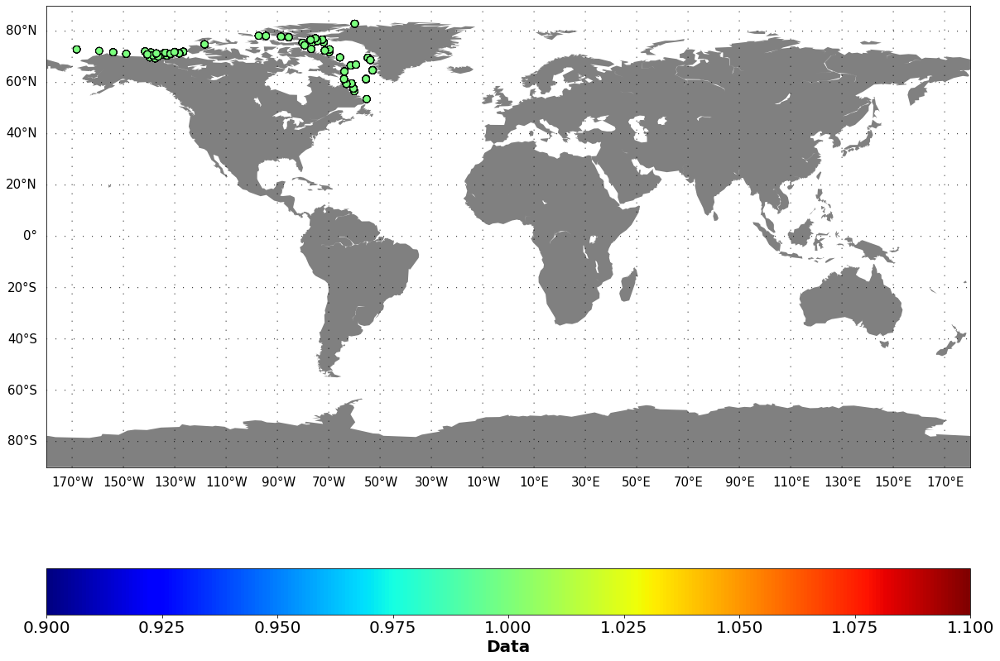

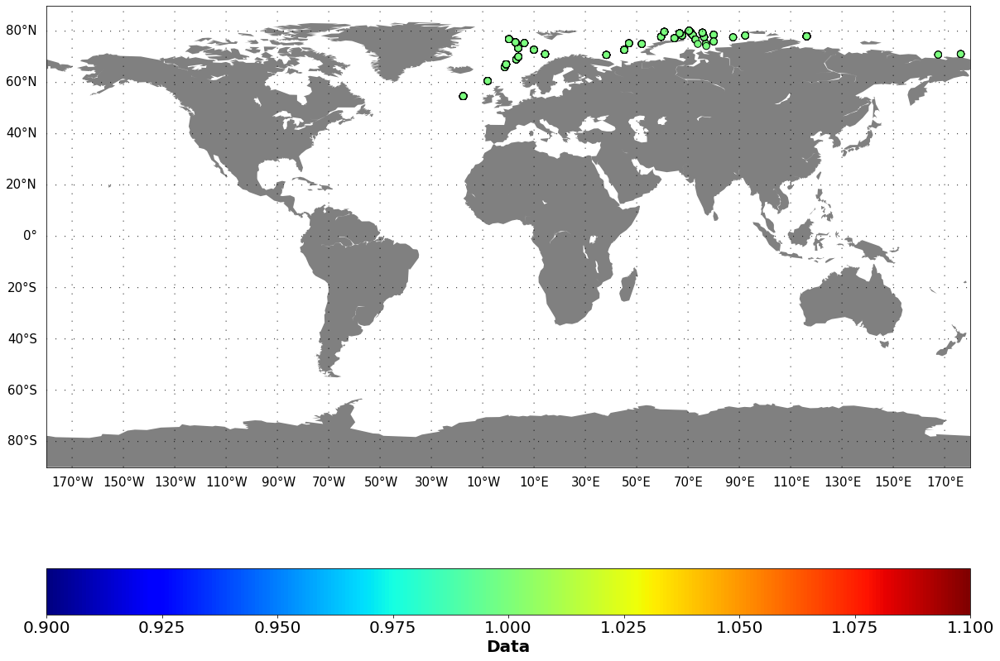

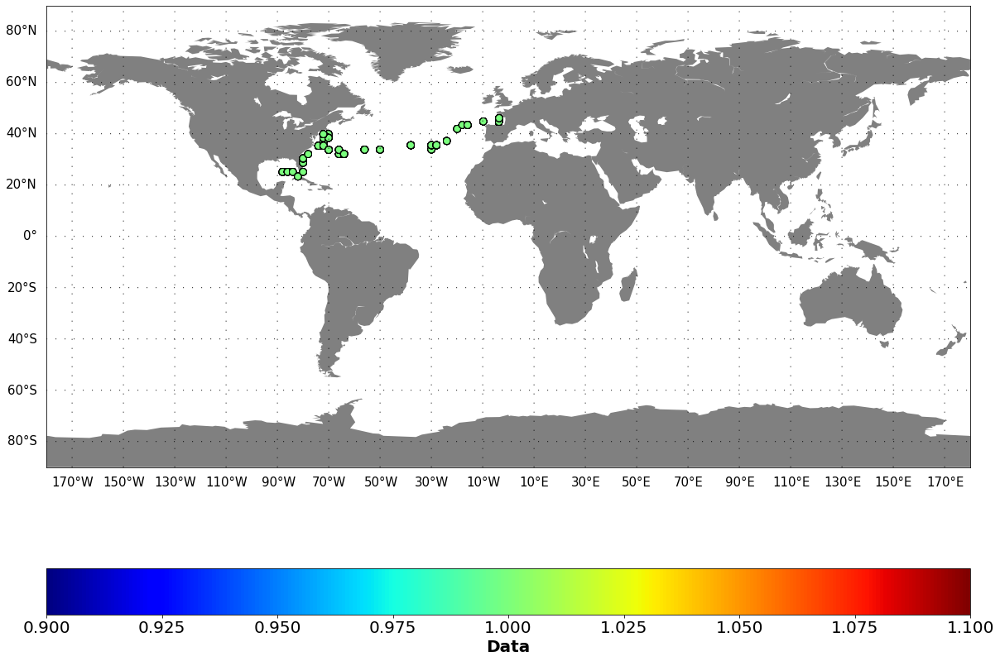

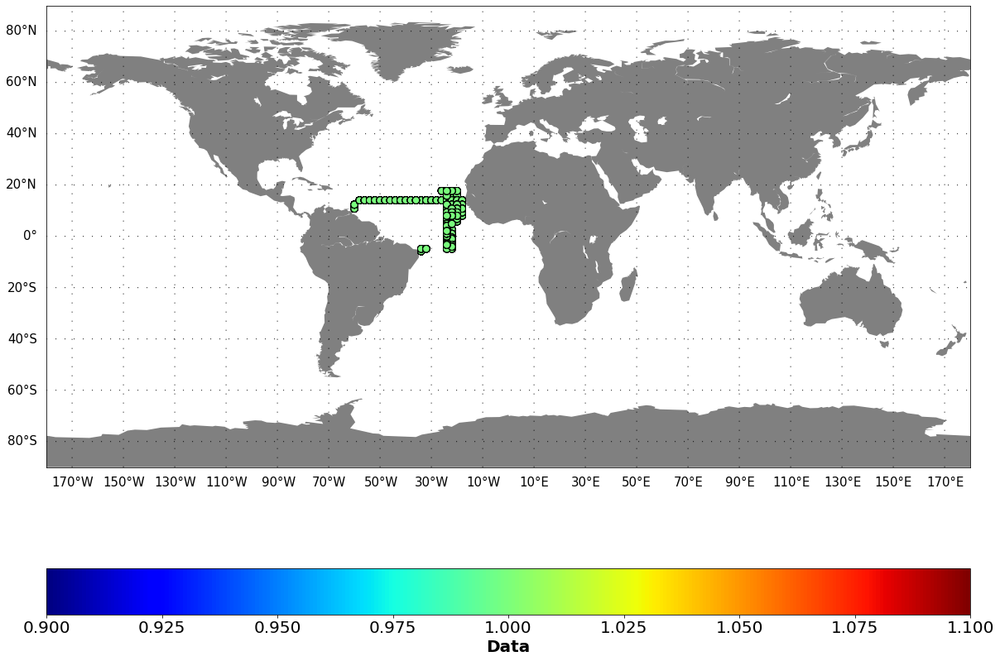

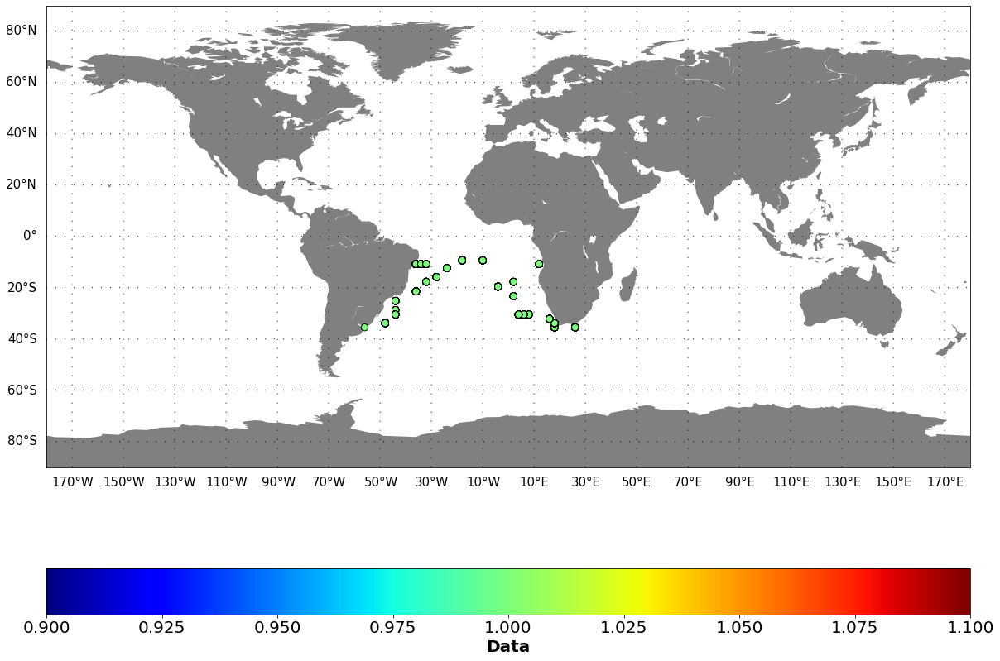

...

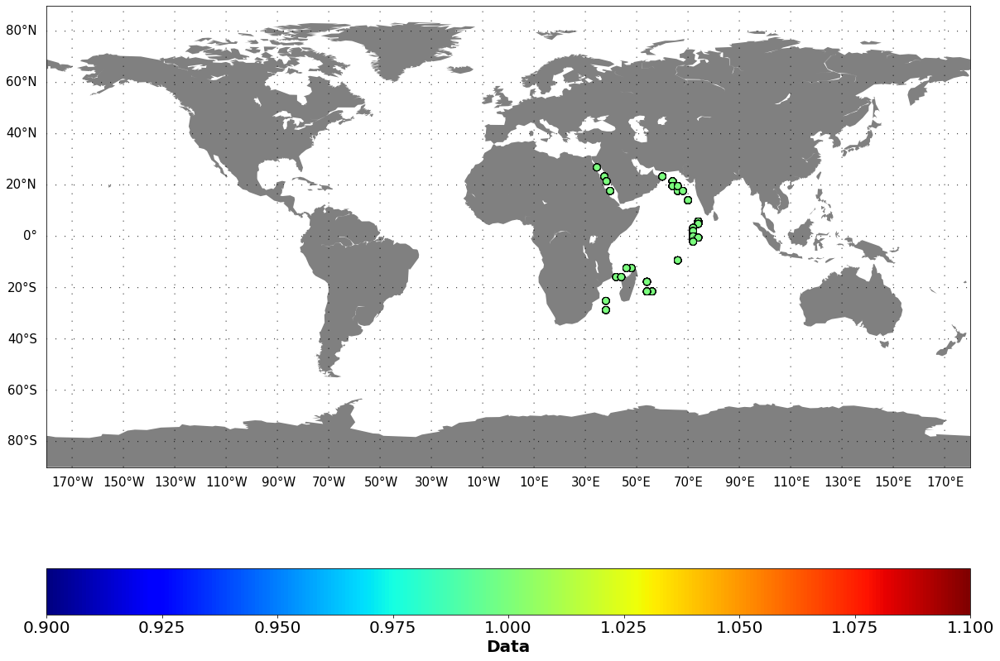

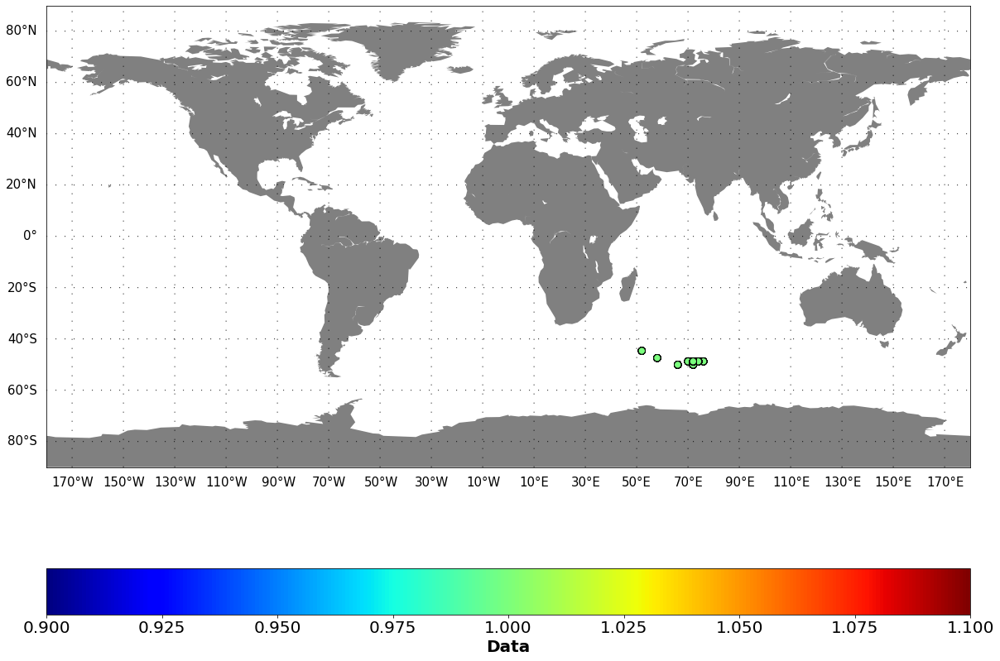

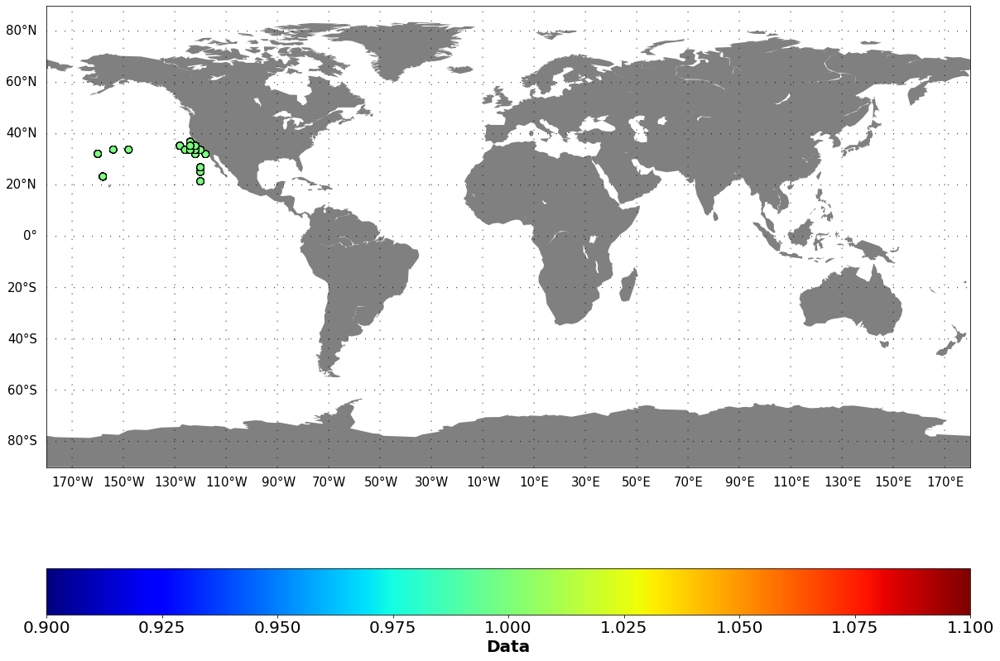

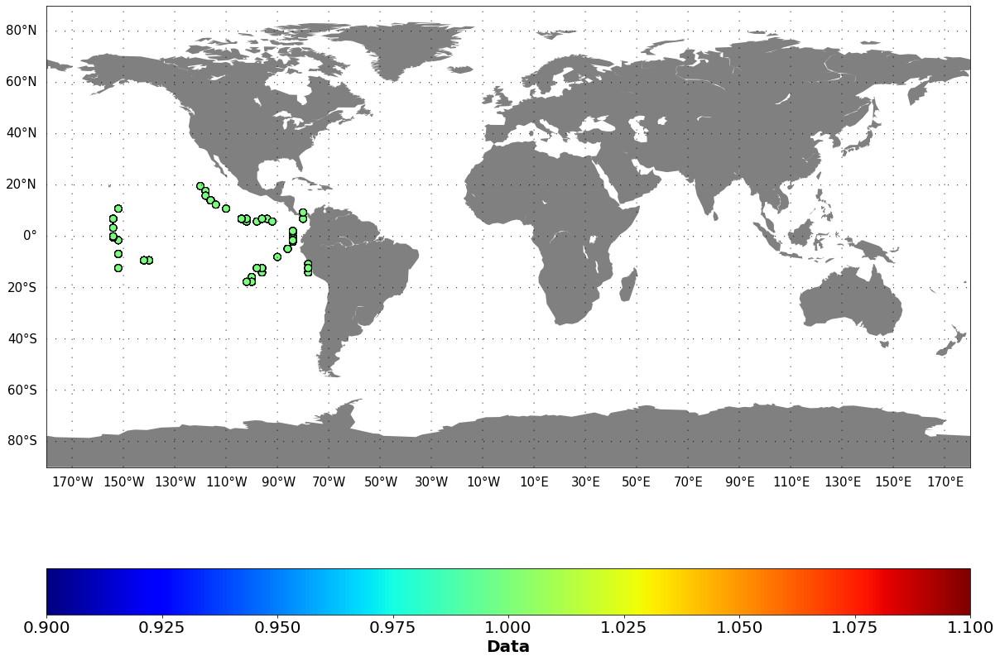

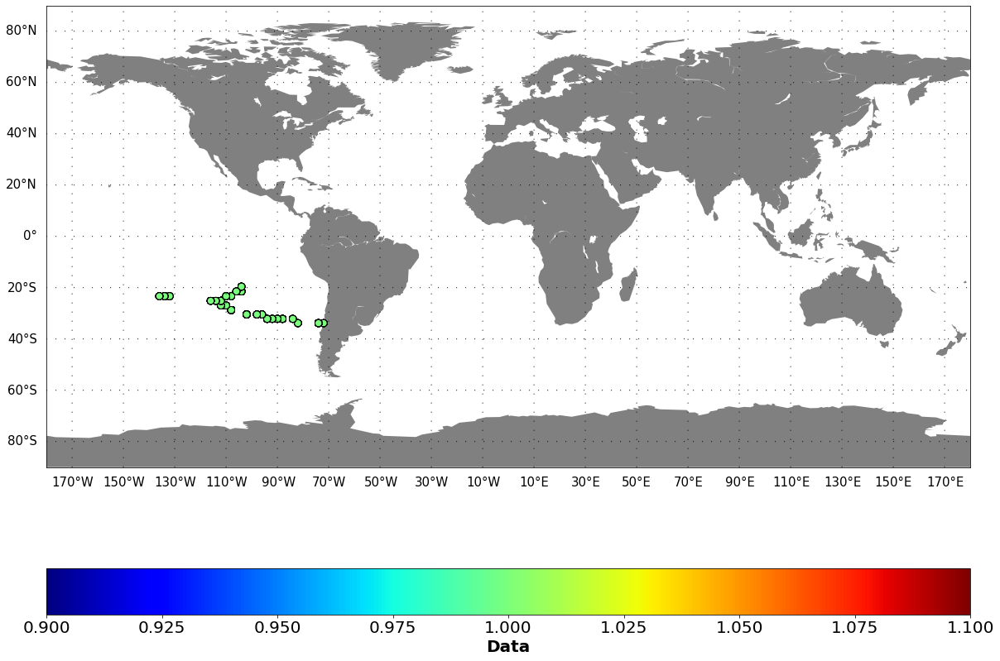

In [390]:
for zone in zone_names:
    plot_glob_distr(globals()["All_Data_Pl_All_RK_new_"+zone],'lat_Pl','lon_Pl',zone+'.png')

In [ ]:
#plot Figure S3

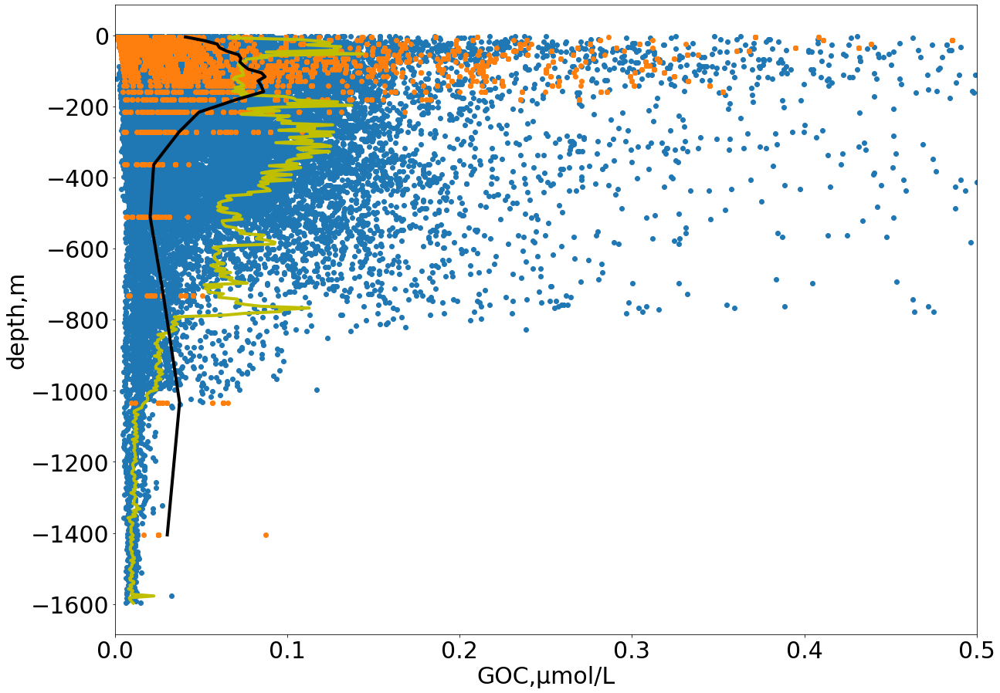

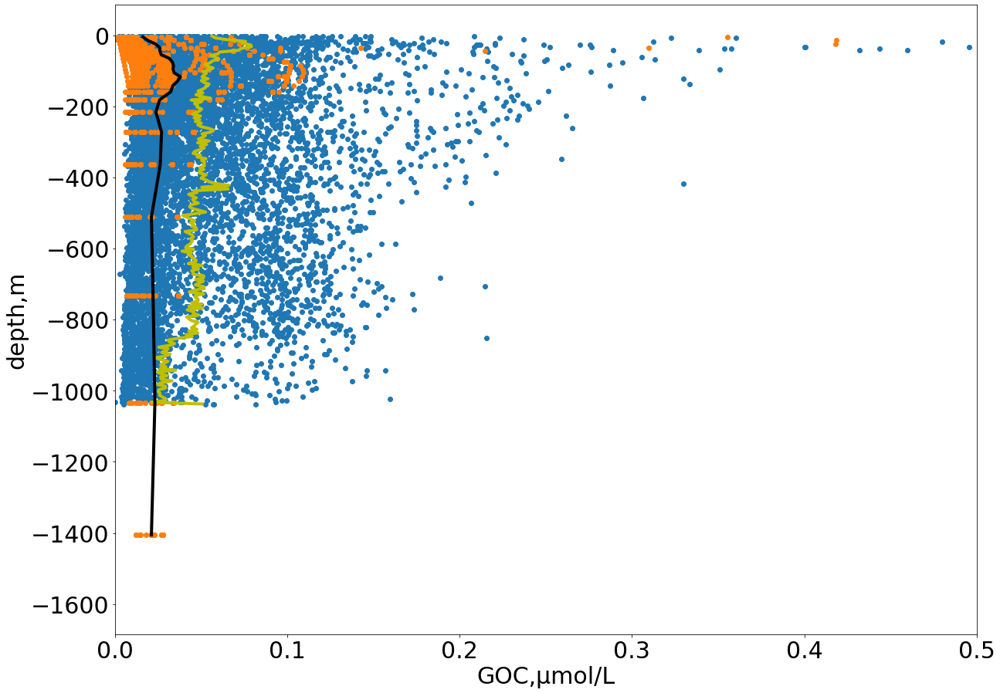

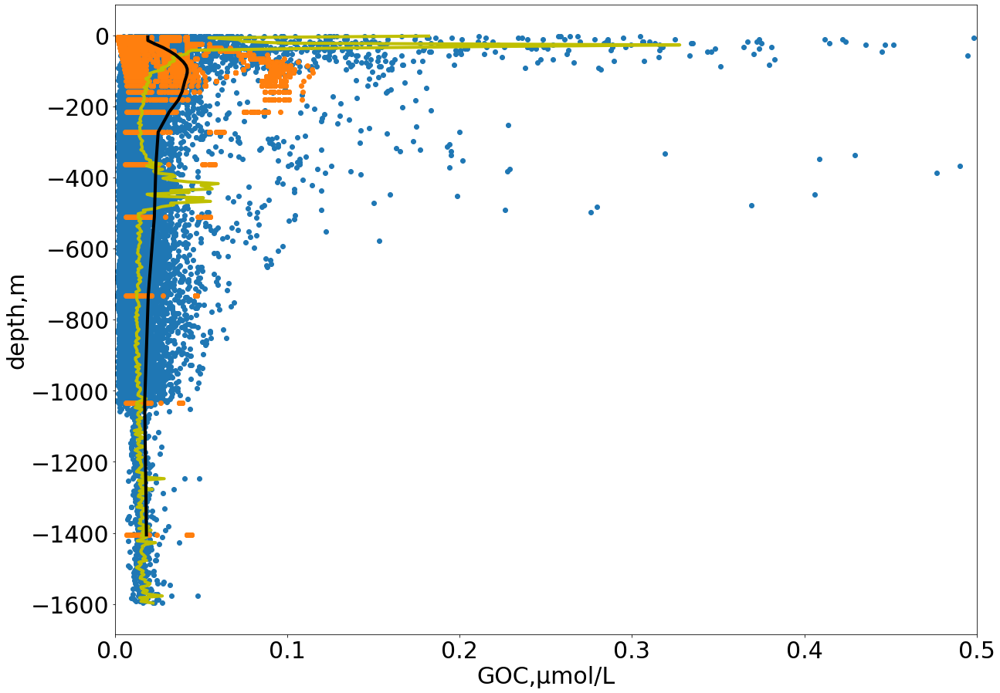

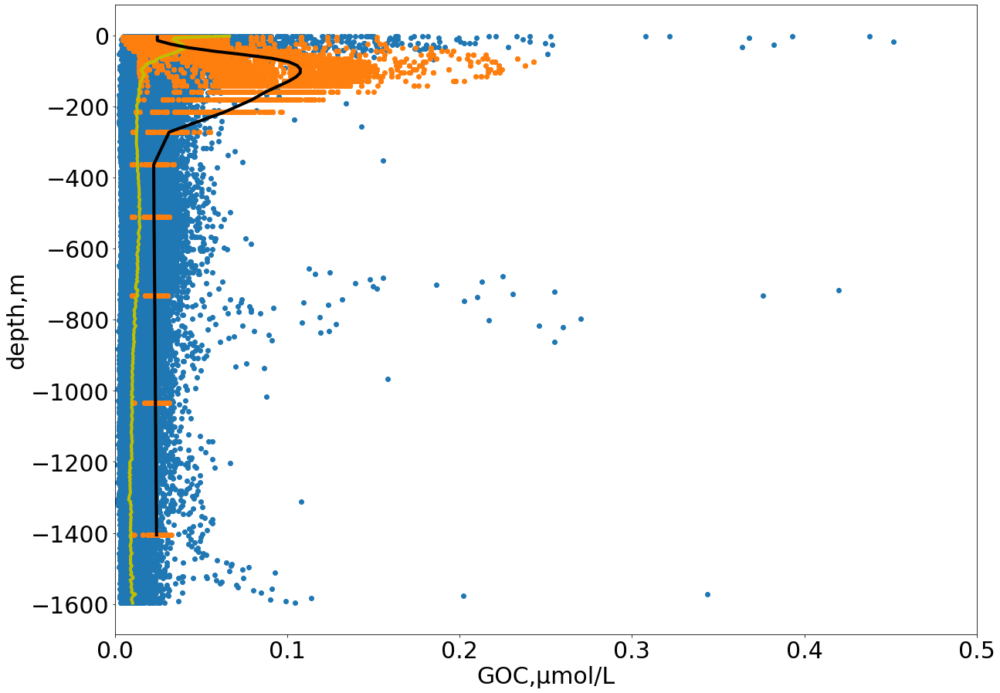

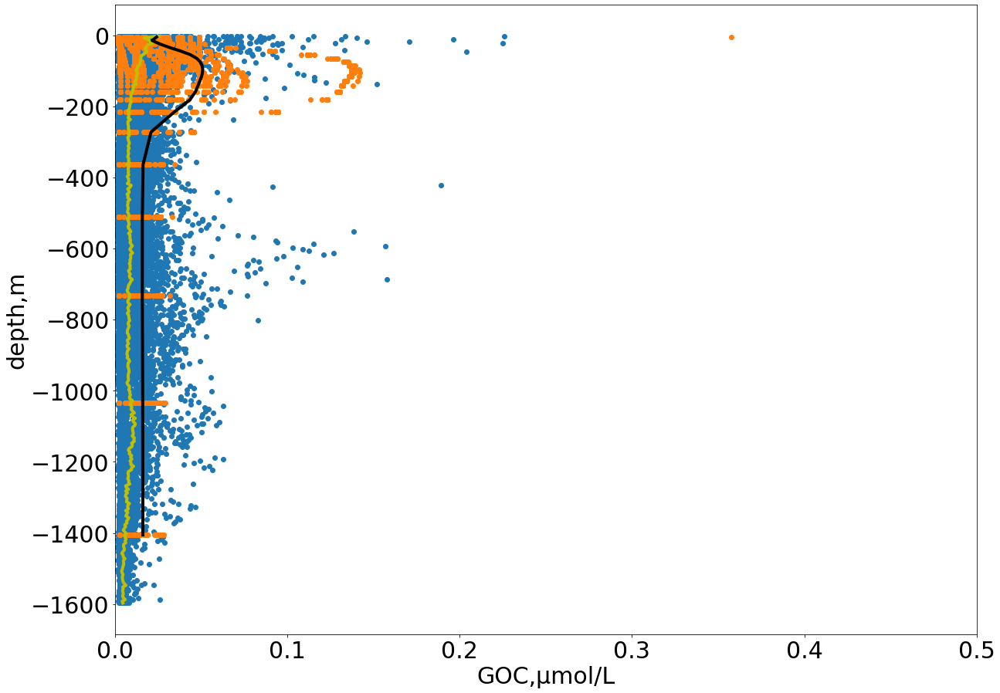

...

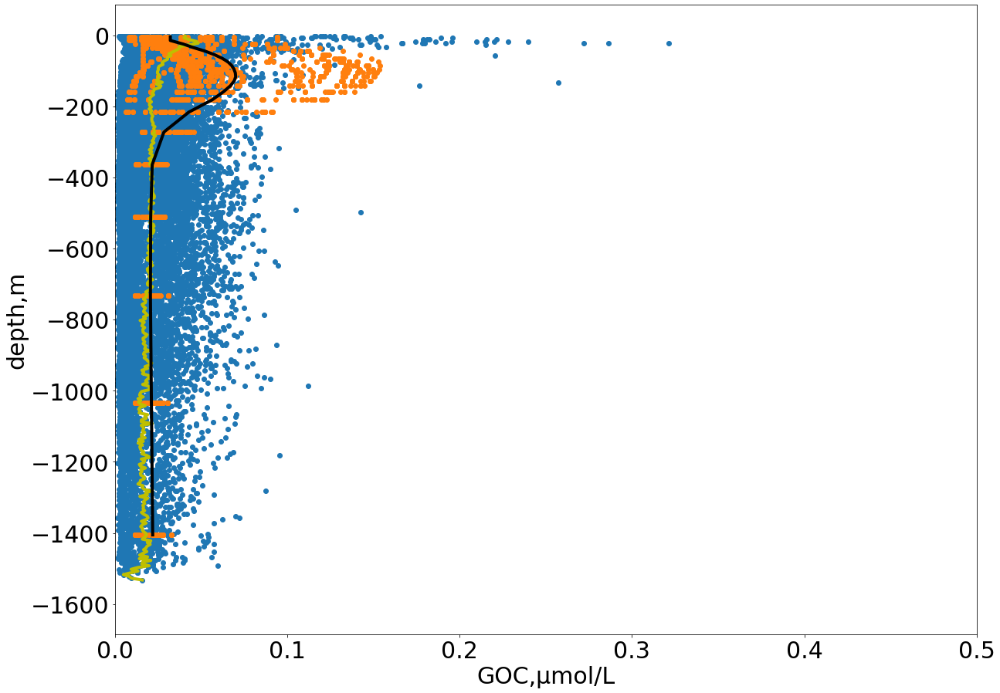

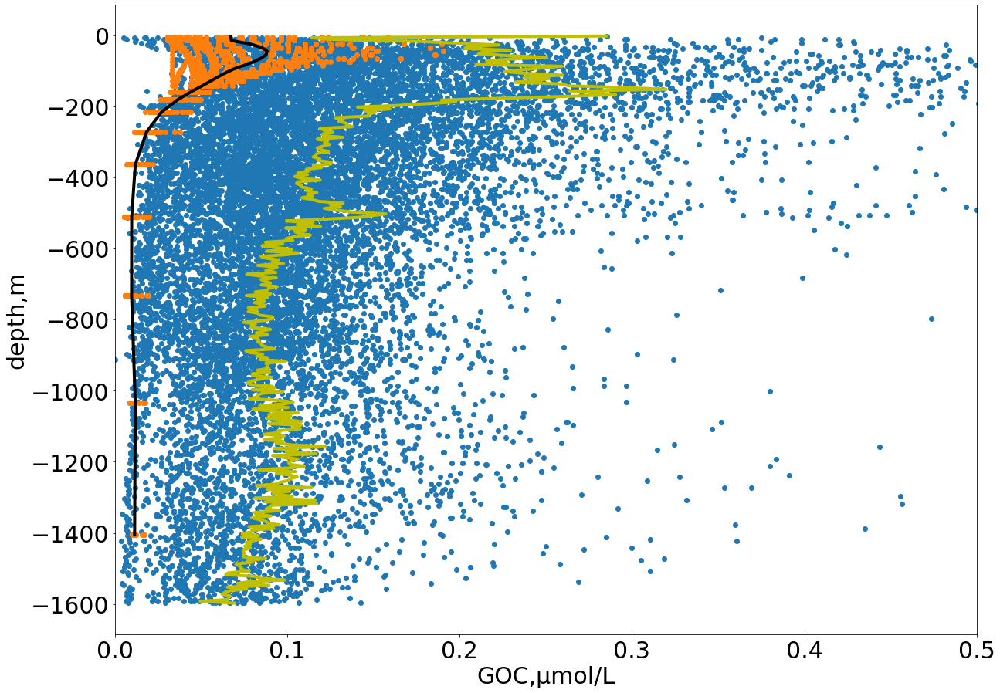

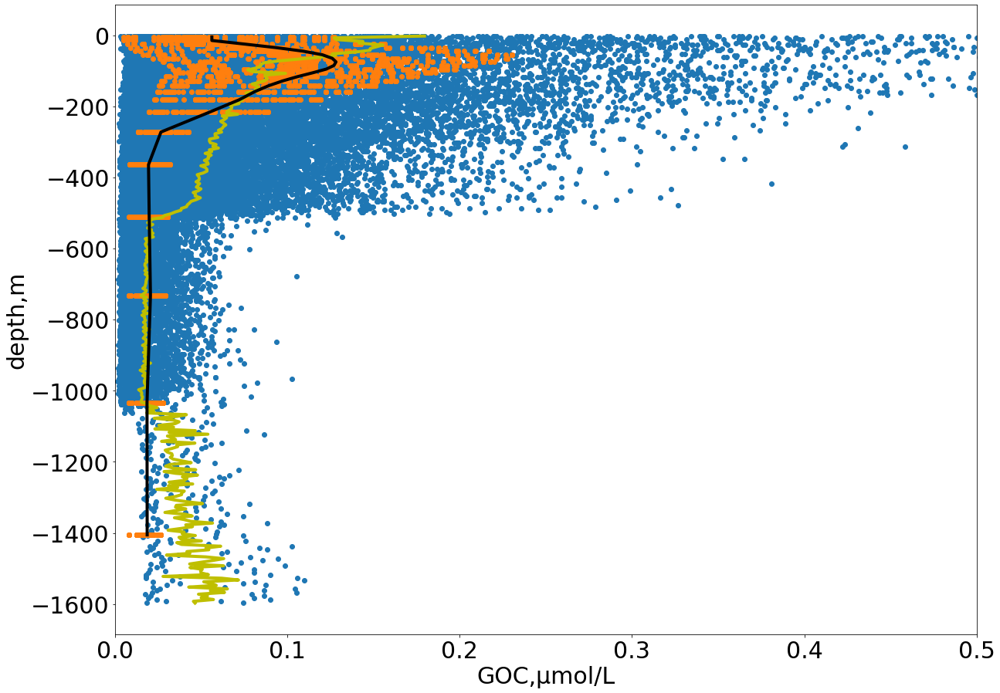

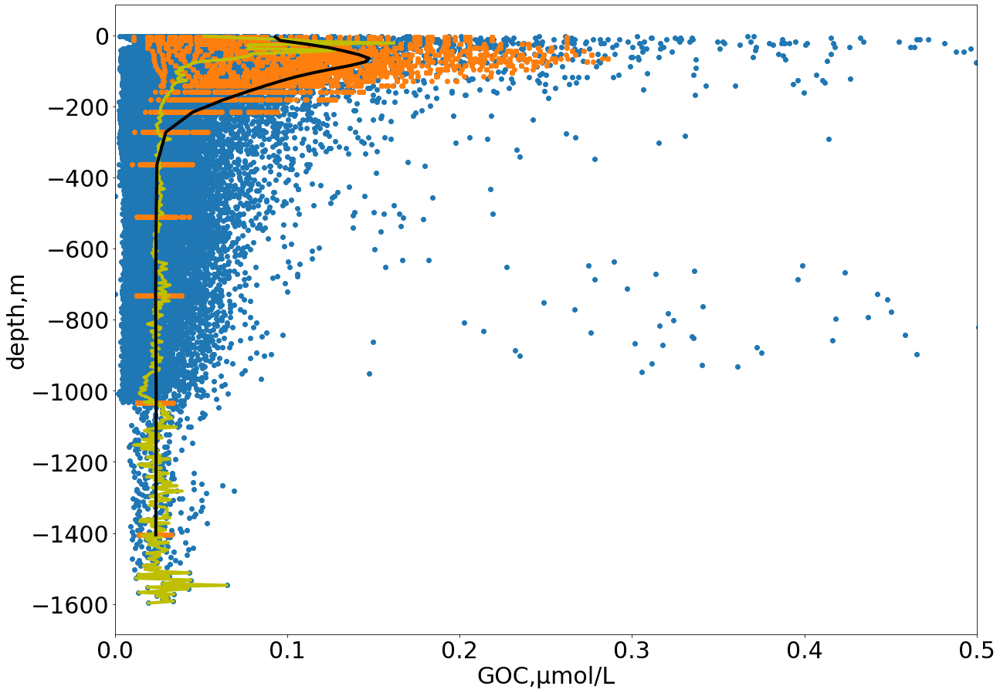

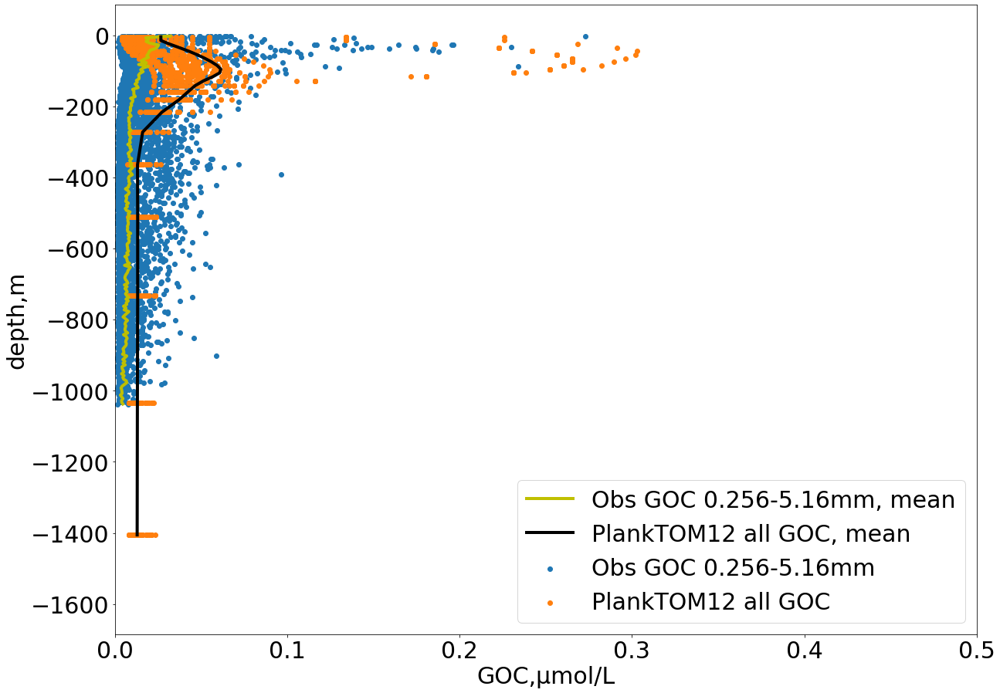

In [413]:
for zone in zone_names:
    if zone != 'zone12':
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'GOC','GOC_Mmol_wvL','GOC','Obs GOC 0.256-5.16mm','PlankTOM12 all GOC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_GOC_'+zone+'.png',legend_sw='off',ylim_sw='on')
    else:
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'GOC','GOC_Mmol_wvL','GOC','Obs GOC 0.256-5.16mm','PlankTOM12 all GOC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_GOC_'+zone+'.png',legend_sw='on',ylim_sw='on')

In [ ]:
#plot Figire S2

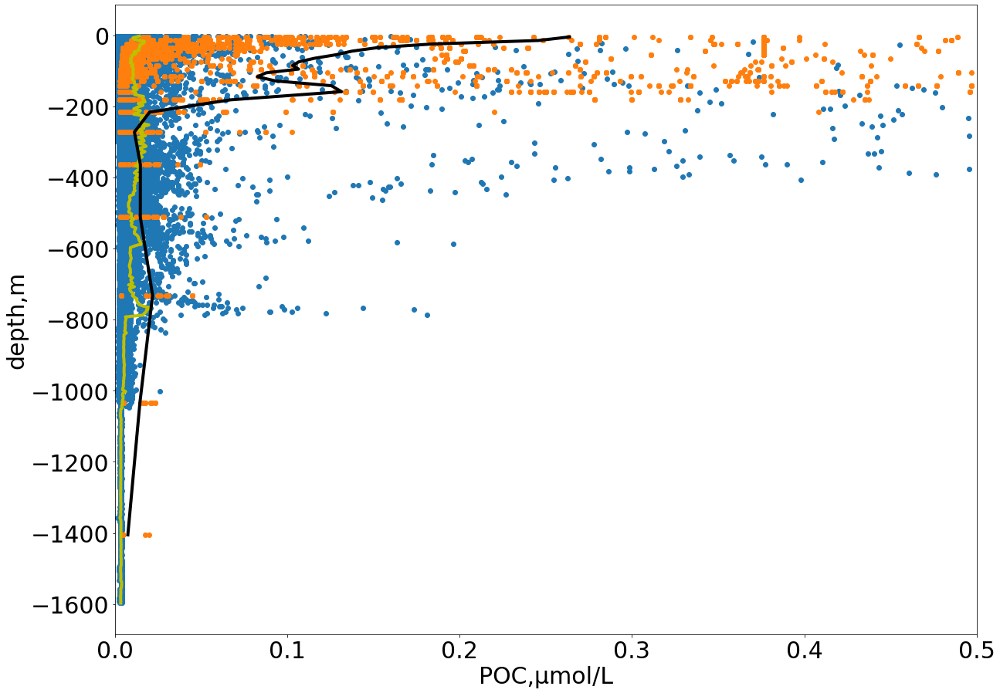

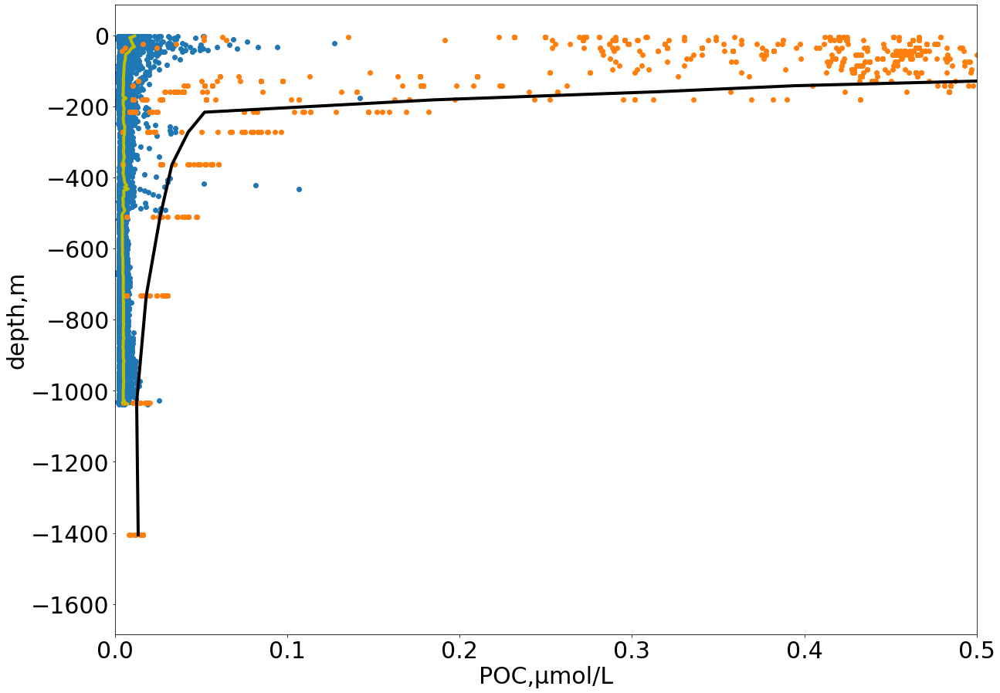

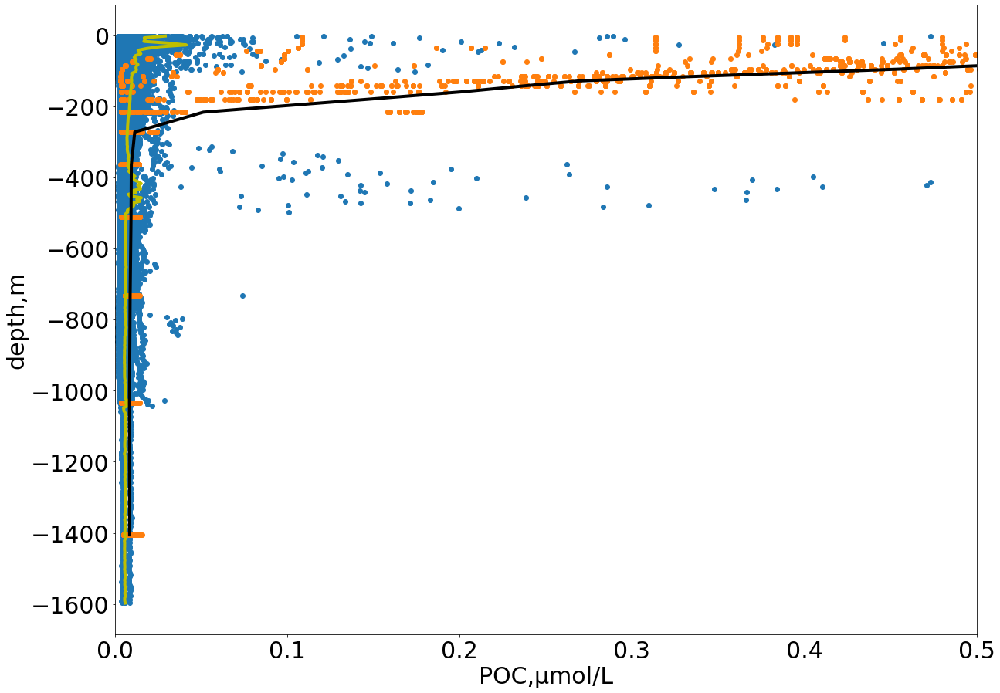

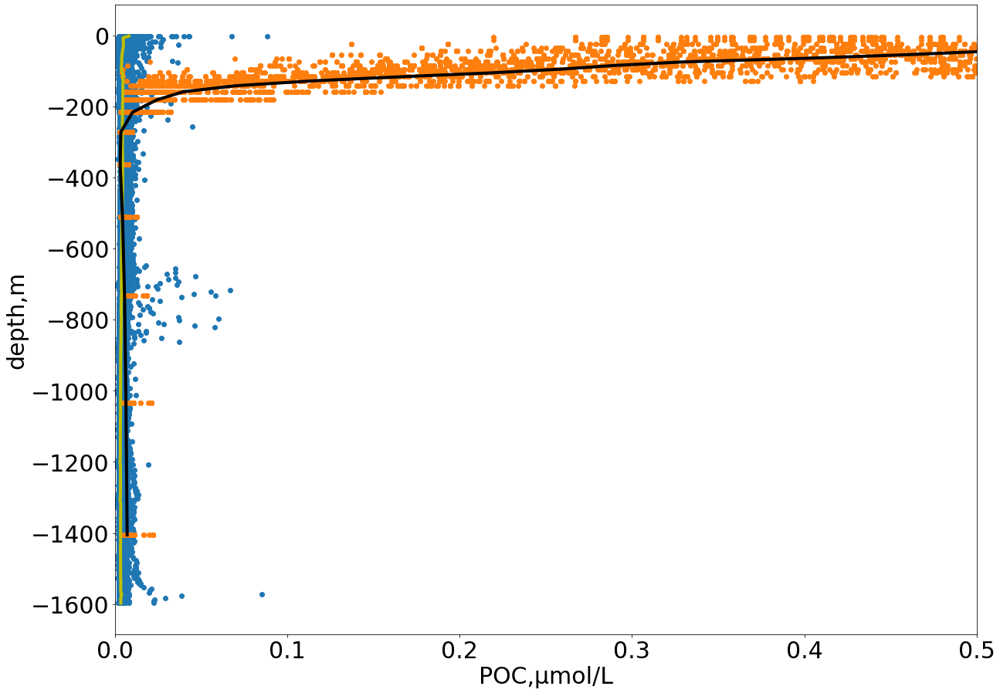

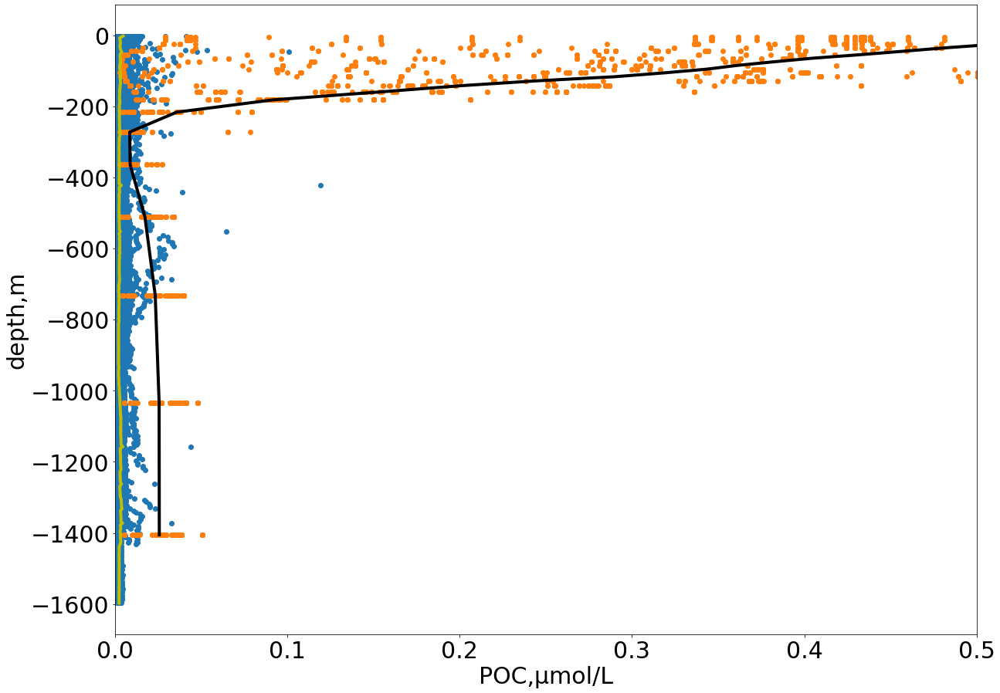

...

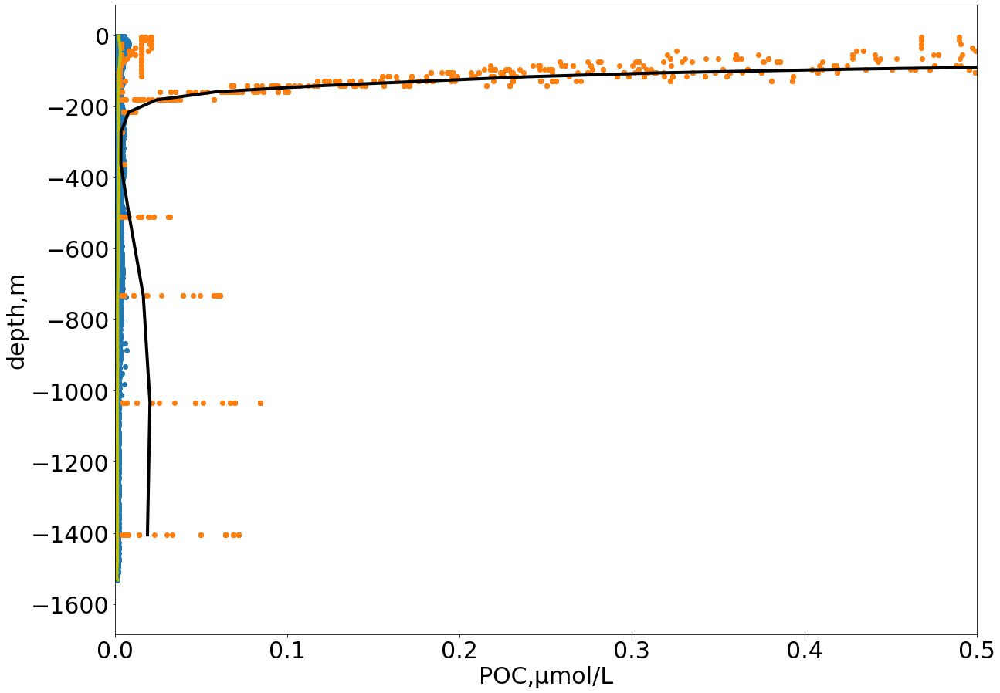

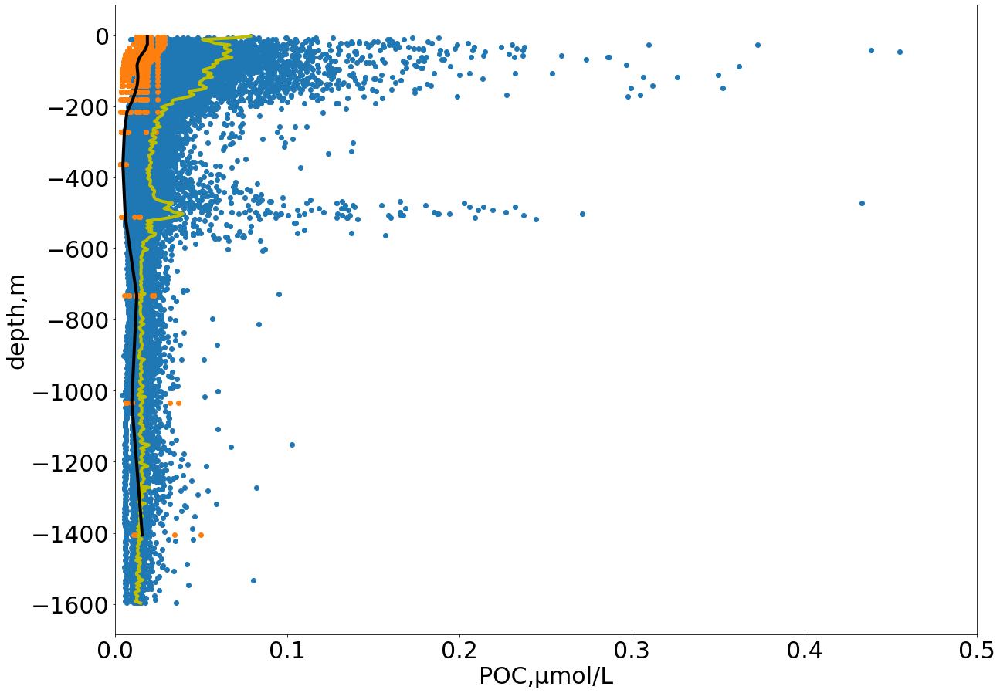

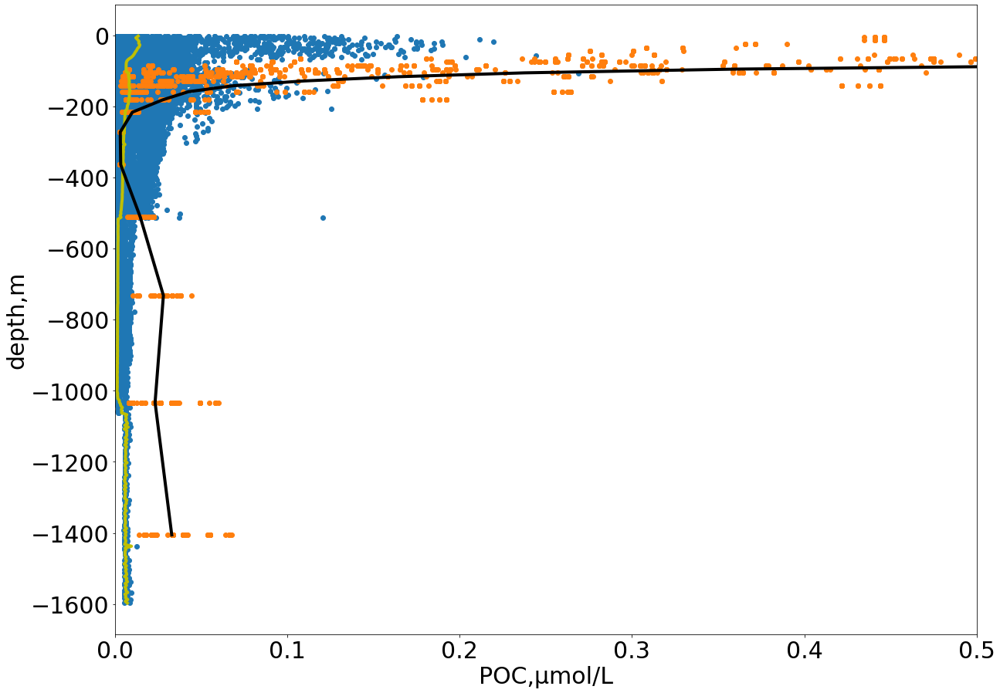

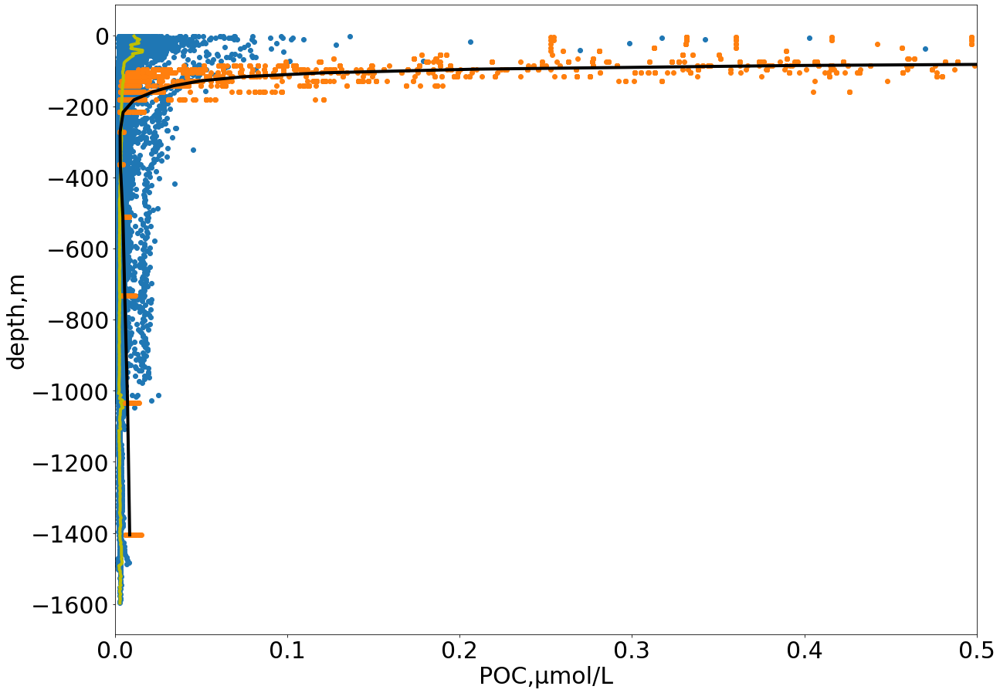

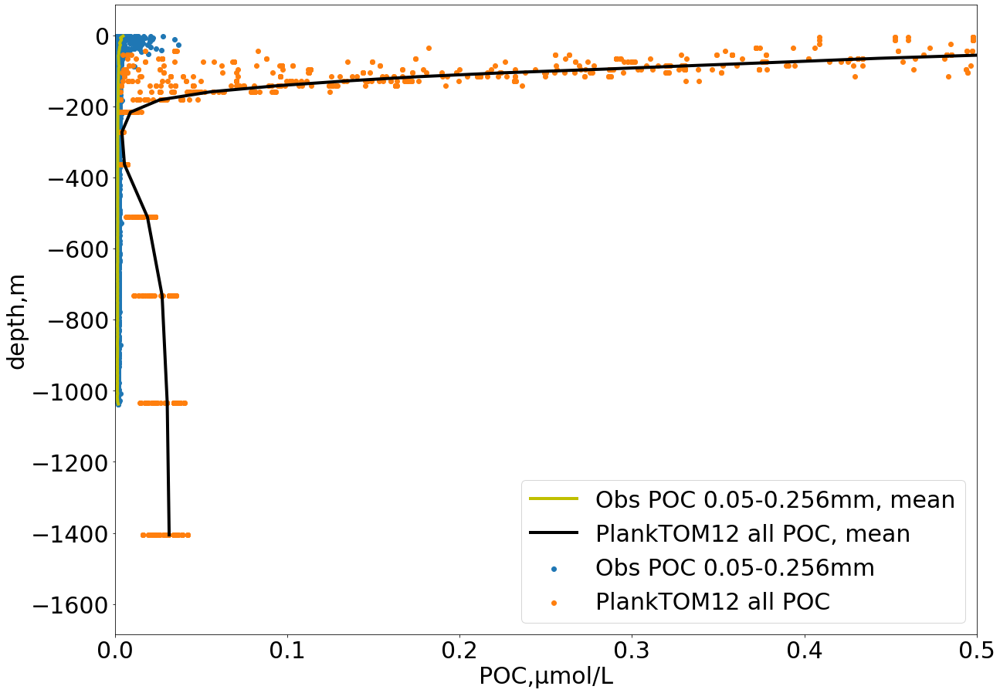

In [415]:
for zone in zone_names:
    if zone != 'zone12':
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'POC','POC_Mmol_wvL','POC','Obs POC 0.05-0.256mm','PlankTOM12 all POC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_POC_'+zone+'.png',legend_sw='off',ylim_sw='on')
    else:
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'POC','POC_Mmol_wvL','POC','Obs POC 0.05-0.256mm','PlankTOM12 all POC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_POC_'+zone+'.png',legend_sw='on',ylim_sw='on')